# Data Analyst Exercise

On Kaggle you will find a Home Insurance dataset covering 2007 – 2012 policies for a home
insurance company representative of customers looking for a quote on their home policy. Using
software of your choice, explore and analyse this dataset in order to surface insight and then build a
set of recommendations to the business which you believe would help to mitigate future lapsed
cases.


You may use whichever techniques, or algorithms, you find most appropriate to tackle this task.  You
will present a summary of your work, again in whatever format you want, for no longer than 20
minutes at interview, with a further 20 minutes for questions.

Areas which you should pay particular attention to are;
- Data exploration: What are the most interesting features of the data set? What have you
considered and why have you made the decisions you have done?
- Assumptions and approach: What process did you follow when building out your insights?
What assumptions have you made and are there any caveats to your results?
- What are your conclusions and what else would’ve been useful to know?


# Variables Description

QUOTE_DATE: Day where the quotation was made

COVER_START: Beginning of the cover payment

CLAIM3YEARS: 3 last years loss

P1_EMP_STATUS: Client's professional status

P1_PT_EMP_STATUS: Client's part-time professional status

BUS_USE: Commercial use indicator

CLERICAL: Administration office usage indicator

AD_BUILDINGS: Building coverage - Self damage

RISK_RATED_AREA_B: Geographical Classification of Risk - Building

SUM_INSURED_BUILDINGS: Assured Sum - Building

NCD_GRANTED_YEARS_B: Bonus Malus - Building

AD_CONTENTS: Coverage of personal items - Self Damage

RISK_RATED_AREA_C: Geographical Classification of Risk - Personal Objects

SUM_INSURED_CONTENTS: Assured Sum - Personal Items

NCD_GRANTED_YEARS_C: Malus Bonus - Personal Items

CONTENTS_COVER: Coverage - Personal Objects indicator

BUILDINGS_COVER: Cover - Building indicator

SPEC_SUM_INSURED: Assured Sum - Valuable Personal Property

SPEC_ITEM_PREM: Premium - Personal valuable items

UNSPEC_HRP_PREM: Unknown

P1_DOB: Date of birth of the client

P1_MAR_STATUS: Marital status of the client

P1_POLICY_REFUSED: Police Emission Denial Indicator

P1_SEX: customer sex

APPR_ALARM: Appropriate alarm

APPR_LOCKS: Appropriate lock

BEDROOMS: Number of bedrooms

ROOF_CONSTRUCTION: Code of the type of construction of the roof

WALL_CONSTRUCTION: Code of the type of wall construction

FLOODING: House susceptible to floods

LISTED: National Heritage Building

MAX_DAYS_UNOCC: Number of days unoccupied

NEIGH_WATCH: Vigils of proximity present

OCC_STATUS: Occupancy status

OWNERSHIP_TYPE: Type of membership

PAYING_GUESTS: Presence of paying guests

PROP_TYPE: Type of property

SAFE_INSTALLED: Safe installs

SEC_DISC_REQ: Reduction of premium for security

SUBSIDENCE: Subsidence indicator (relative downwards motion of the surface )

YEARBUILT: Year of construction

CAMPAIGN_DESC: Description of the marketing campaign

PAYMENT_METHOD: Method of payment

PAYMENT_FREQUENCY: Frequency of payment

LEGAL_ADDON_PRE_REN: Option "Legal Fees" included before 1st renewal

LEGAL_ADDON_POST_REN: Option "Legal Fees" included after 1st renewal
\
HOME_EM_ADDON_PRE_REN: "Emergencies" option included before 1st renewal

HOME_EM_ADDON_POST_REN: Option "Emergencies" included after 1st renewal

GARDEN_ADDON_PRE_REN: Option "Gardens" included before 1st renewal

GARDEN_ADDON_POST_REN: Option "Gardens" included after 1st renewal

KEYCARE_ADDON_PRE_REN: Option "Replacement of keys" included before 1st renewal

KEYCARE_ADDON_POST_REN: Option "Replacement of keys" included after 1st renewal

HP1_ADDON_PRE_REN: Option "HP1" included before 1st renewal

HP1_ADDON_POST_REN: Option "HP1" included after 1st renewal

HP2_ADDON_PRE_REN: Option "HP2" included before 1st renewal

HP2_ADDON_POST_REN: Option "HP2" included afterrenewal

HP3_ADDON_PRE_REN: Option "HP3" included before 1st renewal

HP3_ADDON_POST_REN: Option "HP3" included after renewal

MTA_FLAG: Mid-Term Adjustment indicator

MTA_FAP: Bonus up to date of Adjustment

MTA_APRP: Adjustment of the premium for Mid-Term Adjustmen

MTA_DATE: Date of Mid-Term Adjustment

LAST_ANN_PREM_GROSS: Premium - Total for the previous year

POL_STATUS: Police status

Police: Police number

In [512]:
# imports

import pandas as pd
import numpy as np
import copy

import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, f_oneway, kruskal, mannwhitneyu
import seaborn as sns
from scipy.stats import chi2_contingency

In [513]:
# important functions



def continuous_vs_categorical(data_frame, continuous_col, categorical_col, plot_kind='bar', distribution= 'normal'):
    
    if plot_kind not in ['strip', 'swarm', 'box', 'violin', 'boxen', 'point', 'bar', 'count']:
        raise ValueError("plot_kind not one of 'strip', 'swarm', 'box', 'violin', 'boxen', 'point', 'bar', 'count'")
    # Check the number of unique categories in the categorical column
    num_categories = len(data_frame[categorical_col].unique())
    
    # If there are only two categories, perform t-test
    if num_categories == 2:
        # Get data for each category
        category1_data = data_frame.loc[data_frame[categorical_col] == 1, continuous_col]
        category2_data = data_frame.loc[data_frame[categorical_col] == 0, continuous_col]
        
        if distribution == 'normal':
            # Perform t-test
            t_stat, p_value = ttest_ind(category1_data, category2_data)
            print("T-test statistic is {:.2f}, with p-value of {:.2f}".format(t_stat, p_value))
            
        else:
            # Perform the Mann-Whitney U test
            mwu_stat, p_value = mannwhitneyu(category1_data, category2_data, alternative='two-sided')
            print("KW statistic is {:.2f}, with p-value of {:.2f}".format(mwu_stat, p_value))

        # Create bar chart with error bars using Seaborn
        sns.catplot(x=categorical_col, y=continuous_col,
                    data=data_frame, 
                    kind=plot_kind)
        plt.title("{} by {}".format(continuous_col, categorical_col))
        plt.show()
    
    # If there are more than two categories, perform ANOVA test
    elif num_categories > 2:
        # Get data for each category by grouping and putting all of the data into a list
        data_by_category = data_frame.groupby(categorical_col)[continuous_col].apply(list).reset_index(name='category_data')
        category_data = data_by_category['category_data'].tolist()
        
        if distribution== 'normal':
            
            # Perform ANOVA test
            f_stat, p_value = f_oneway(*category_data)
            print("ANOVA F-statistic is {:.2f}, with p-value of {:.2f}".format(f_stat, p_value))
            
        else:
            # non parametric Kruskal-Wallis test
            kw_stat, p_value = stats.kruskal(*category_data)
            print("KW statistic is {:.2f}, with p-value of {:.2f}".format(kw_stat, p_value))
        
        # Create bar chart with error bars using Seaborn
        sns.catplot(x=continuous_col, y=categorical_col,
                    data=data_frame, 
                    kind=plot_kind)
        
        plt.title("{} by {}".format(continuous_col, categorical_col))
        plt.show()
        
    # If there are no categories, print error message
    else:
        print("Error: no categories found in categorical column")
        
        
        
        
from scipy.stats import contingency

    
# discrete variables

def discrete_comparison(df, col1, col2, plot_type= 'heat'):
    """This function performs a comparison between two discrete variables in a DataFrame.
    It performs a chi-squared test and Cramer's V statistic to measure the strength of association
    between the two variables, and also plots a heat map to visualize the contingency table.
    :param df: DataFrame containing the data
    :param col1: Name of the first discrete column to compare
    :param col2: Name of the second discrete column to compare
    :return: None
    """
    # Create a contingency table of the two columns
    contingency_table = pd.crosstab(df[col1], df[col2])
    
    # Calculate chi-squared test statistic, p-value, degrees of freedom
    chi2, p, dof, _ = chi2_contingency(contingency_table)

    # Calculate Cramer's V statistic
    num_obs = np.sum(contingency_table.values)
    cramers_v = np.sqrt(chi2 / (num_obs*(min(contingency_table.shape)-1)))

    # Print results
    print(f"Chi-squared test statistic: {chi2:.2f}")
    print(f"P-value: {p:.2f}")
    print(f"Degrees of freedom: {dof}")
    print(f"Cramer's V statistic: {cramers_v:.2f}")

    if plot_type == 'heat':
        # Plot a heat map of the contingency table
        plt.figure()
        sns.heatmap(contingency_table, annot=True, cmap="Blues")
        plt.title("{} vs. {}".format(col1, col2))
        plt.show()
        
    elif plot_type == 'bar':
        plt.figure(figsize = (20,20))
        sns.catplot(data = df, x = col2 , y = col1, kind = 'bar', orient = 'h')
        plt.title("{} vs. {}".format(col1, col2))
        plt.show()
        
    elif plot_type == 'strip':
        plt.figure()
        sns.catplot(data = df, x = col1 , hue = col2, kind = 'strip')
        plt.title("{} vs. {}".format(col1, col2))
        plt.show()
        
    elif plot_type == 'box':
        plt.figure()
        sns.catplot(data = df, x = col1 , y = col2, kind = 'box')
        plt.title("{} vs. {}".format(col1, col2))
        plt.show()
        
        

    
    


def detect_datatype_and_plot(df, figsize=(10, 8)):
    # Loop through each column in the dataframe
    for column in df.columns:
        # Check if the column is binary
        if set(df[column].unique()) == {0, 1}:
            print(f"{column} is binary.")
            # Plot a bar plot with counts of 0's and 1's
            plt.figure(figsize=figsize)
            sns.countplot(data=df, x=column)
            plt.show()
        # Check if the column is categorical (integer)
        elif pd.api.types.is_integer_dtype(df[column]) and df[column].nunique() < 50:
            print(f"{column} is categorical.")
            # Plot a bar plot with counts of each category
            plt.figure(figsize=figsize)
            sns.countplot(data=df, x=column, order=df[column].value_counts().index)
            plt.show()
        # Check if the column is categorical (string)
        elif pd.api.types.is_string_dtype(df[column]) and df[column].nunique() < 50:
            print(f"{column} is categorical.")
            # Plot a bar plot with counts of each category
            plt.figure(figsize=figsize)
            sns.countplot(data=df, x=column, order=df[column].value_counts().index)
            plt.show()
        # If it's numeric, plot a KDE/histogram
        elif pd.api.types.is_numeric_dtype(df[column]):
            print(f"{column} is continuous.")
            plt.figure(figsize=figsize)
            sns.histplot(data=df, x=column, kde=True)
            plt.show()
        else:
            print(f"{column} is neither binary, categorical, nor continuous.")
            
            
            
            
            

        
        
        


# Reading in Data and Initial Analysis

In [4]:
# display all cols
pd.set_option('display.max_columns', None)

In [449]:
data = pd.read_csv("/Users/chrismembrey/Downloads/home_insurance.csv")

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 256136 entries, 0 to 256135
Data columns (total 66 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   QUOTE_DATE              129524 non-null  object 
 1   COVER_START             189021 non-null  object 
 2   CLAIM3YEARS             190039 non-null  object 
 3   P1_EMP_STATUS           189021 non-null  object 
 4   P1_PT_EMP_STATUS        1782 non-null    object 
 5   BUS_USE                 189021 non-null  object 
 6   CLERICAL                2944 non-null    object 
 7   AD_BUILDINGS            189021 non-null  object 
 8   RISK_RATED_AREA_B       140876 non-null  float64
 9   SUM_INSURED_BUILDINGS   189021 non-null  float64
 10  NCD_GRANTED_YEARS_B     189021 non-null  float64
 11  AD_CONTENTS             189021 non-null  object 
 12  RISK_RATED_AREA_C       180290 non-null  float64
 13  SUM_INSURED_CONTENTS    189021 non-null  float64
 14  NCD_GRANTED_YEARS_C 

In [450]:
# first thing to do is delete duplicates
data = data.drop_duplicates(subset = [x for x in data.columns if x not in ['i', 'Police']])
data.shape

(191015, 66)

In [451]:
data.head()

,QUOTE_DATE,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,P1_PT_EMP_STATUS,BUS_USE,CLERICAL,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_DOB,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,CAMPAIGN_DESC,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,MTA_FAP,MTA_APRP,MTA_DATE,LAST_ANN_PREM_GROSS,POL_STATUS,i,Police
0,11/22/2007,22/11/2007,N,R,NaN,N,NaN,Y,19.0,1000000.0,7.0,Y,6.0,50000.0,7.0,Y,Y,7500.0,44.42,12.45,15/06/1939,O,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,10.0,Y,Y,N,1960.0,NaN,PureDD,NaN,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,274.81,Lapsed,1,P000001
1,11/22/2007,01/01/2008,N,E,NaN,Y,N,Y,25.0,1000000.0,6.0,Y,9.0,50000.0,7.0,Y,Y,0.0,0.00,24.60,20/05/1970,M,N,M,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,2.0,N,N,N,1960.0,NaN,PureDD,NaN,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,308.83,-9.27,NaN,308.83,Live,2,P000002
2,11/23/2007,23/11/2007,N,E,NaN,N,NaN,N,NaN,0.0,0.0,Y,12.0,50000.0,7.0,N,Y,0.0,0.00,0.00,10/06/1947,S,N,M,Y,Y,2.0,11.0,15.0,Y,3.0,0.0,Y,PH,8.0,0.0,9.0,N,Y,N,1946.0,NaN,PureDD,NaN,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,52.65,52.65,03/11/2010,52.65,Live,3,P000003
3,11/23/2007,12/12/2007,N,R,NaN,N,NaN,N,NaN,0.0,0.0,Y,14.0,50000.0,7.0,N,Y,0.0,0.00,0.00,16/12/1925,W,N,F,N,Y,2.0,11.0,15.0,Y,3.0,0.0,N,PH,18.0,0.0,19.0,N,Y,N,1870.0,NaN,NonDD,NaN,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,54.23,Live,4,P000004
4,11/22/2007,15/12/2007,N,R,NaN,N,NaN,Y,5.0,1000000.0,7.0,Y,10.0,50000.0,7.0,Y,Y,0.0,0.00,19.82,11/02/1936,M,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1960.0,NaN,DD-Other,NaN,Y,Y,N,N,Y,Y,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,244.58,Live,5,P000005


In [452]:
# quote date and cover start need to be datetime format
data['QUOTE_DATE'] = pd.to_datetime(data['QUOTE_DATE'])
data['COVER_START'] = pd.to_datetime(data['COVER_START'])

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning: Parsing '22/11/2007' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning: Parsing '23/11/2007' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning: Parsing '15/12/2007' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-pa

In [453]:
# 16 unknown statuses we can get rid of as removing less than 0.1% of the data should not 
# affect distributions/model evaluations
data['POL_STATUS'].value_counts(normalize = True)

Live         0.699182
Lapsed       0.277927
Cancelled    0.022807
Unknown      0.000085
Name: POL_STATUS, dtype: float64

In [454]:
data = data.loc[data['POL_STATUS'] != 'Unknown']

In [455]:
# many values are null which will affect modelling and need to be accounted for. There is plenty of data in our dataset
# so removing null values remaining is fine
data['POL_STATUS'].isnull().sum()/data.shape[0]

0.010439845234791805

In [456]:
# turns out these are policies where the policy has not started
data.loc[data['POL_STATUS'].isnull()]

,QUOTE_DATE,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,P1_PT_EMP_STATUS,BUS_USE,CLERICAL,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_DOB,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,CAMPAIGN_DESC,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,MTA_FAP,MTA_APRP,MTA_DATE,LAST_ANN_PREM_GROSS,POL_STATUS,i,Police
18,2007-11-15,NaT,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,216.95,216.95,02/02/2009,216.95,NaN,19,P000019
28,2008-01-17,NaT,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,247.26,247.26,18/02/2008,247.26,NaN,29,P000029
81,2007-11-27,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82,P000082
82,2007-12-11,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83,P000083
83,2007-12-13,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84,P000084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255364,NaT,NaT,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,218.58,218.58,06/12/2009,218.58,NaN,255365,P255365
255365,NaT,NaT,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,239.89,0.00,NaN,239.89,NaN,255366,P255366
255366,NaT,NaT,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,269.60,48.71,NaN,269.60,NaN,255367,P255367
255739,2010-01-27,NaT,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,315.18,NaN,255740,P255740


In [11]:
# creating a dataset without nulls
data_no_nulls = data.loc[~data['POL_STATUS'].isnull()]

In [12]:
# create a feature for classification
data_no_nulls['has_lapsed'] = [1 if x == 'Lapsed' else 0 for x in data_no_nulls['POL_STATUS']]
data_no_nulls['has_lapsed'].value_counts(normalize = True)

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/2242125691.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls['has_lapsed'] = [1 if x == 'Lapsed' else 0 for x in data_no_nulls['POL_STATUS']]


0    0.72205
1    0.27795
Name: has_lapsed, dtype: float64

For future models, the baseline will be 0.72 if the proportions remained the same (can be done with undersampling or SMOTENC - oversampling)

In [13]:
# for each feature lets print the distinct values to get feel for them
for col in data_no_nulls.columns:
    print(f'''{col}: {data_no_nulls[col].value_counts(normalize = True)} 
          NULL Counts: {data_no_nulls[col].isnull().sum()}''', '\n\n')
    

QUOTE_DATE: 2011-01-10    0.007620
2011-01-11    0.007279
2011-01-17    0.007190
2011-01-18    0.007114
2011-01-13    0.007026
                ...   
2010-06-07    0.000013
2008-03-17    0.000013
2011-12-16    0.000013
2010-09-11    0.000013
2007-07-23    0.000013
Name: QUOTE_DATE, Length: 1015, dtype: float64 NULL Counts: 109868 


COVER_START: 2011-01-03    0.018571
2011-01-02    0.015312
2010-01-12    0.013910
2011-01-01    0.013497
2010-01-03    0.010841
                ...   
2001-09-19    0.000005
1993-09-11    0.000005
1993-12-23    0.000005
1997-12-26    0.000005
1994-01-18    0.000005
Name: COVER_START, Length: 2207, dtype: float64 NULL Counts: 0 


CLAIM3YEARS: N    0.884474
Y    0.115526
Name: CLAIM3YEARS, dtype: float64 NULL Counts: 0 


P1_EMP_STATUS: R    0.775688
E    0.192561
S    0.016211
H    0.005656
U    0.004873
N    0.003989
V    0.000360
A    0.000275
F    0.000153
I    0.000148
C    0.000085
Name: P1_EMP_STATUS, dtype: float64 NULL Counts: 0 


P1_PT_EMP_STATUS:

Police: P000001    0.000005
P170625    0.000005
P170615    0.000005
P170616    0.000005
P170617    0.000005
             ...   
P084854    0.000005
P084855    0.000005
P084856    0.000005
P084857    0.000005
P256136    0.000005
Name: Police, Length: 189005, dtype: float64 NULL Counts: 0 


has_lapsed: 0    0.72205
1    0.27795
Name: has_lapsed, dtype: float64 NULL Counts: 0 




In [14]:
# columns to drop initially

# dropping MTA extras for now, initial exercise will see if the MTA makes a difference to the policy lapse
# then we can look into particulars

# campain desc is all null

# we want to remove ID's

data_no_nulls.drop(['MTA_FAP', 'MTA_APRP' ,
                    'MTA_DATE', 'CAMPAIGN_DESC', 'i', 'Police'], axis = 'columns', inplace = True)

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/2617310367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls.drop(['MTA_FAP', 'MTA_APRP' ,


In [15]:
# drop cerlical and P1 part time due to large amount of nulls, doesnt make sense to impute.
# in future I could come back and see the effect of being part time compared with full time employment.

data_no_nulls.drop(['P1_PT_EMP_STATUS', 'CLERICAL' ], axis = 'columns', inplace = True)

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/3494458348.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls.drop(['P1_PT_EMP_STATUS', 'CLERICAL' ], axis = 'columns', inplace = True)


In [16]:
# mapping payment frequency by filling the null values with 0

data_no_nulls['PAYMENT_FREQUENCY'] = data_no_nulls['PAYMENT_FREQUENCY'].fillna(0)
data_no_nulls['PAYMENT_FREQUENCY'].value_counts(normalize = True)

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/3683115551.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls['PAYMENT_FREQUENCY'] = data_no_nulls['PAYMENT_FREQUENCY'].fillna(0)


0.0    0.573821
1.0    0.426179
Name: PAYMENT_FREQUENCY, dtype: float64

In [17]:
# looking at date columns with our target variable
dates = ['QUOTE_DATE' , 'COVER_START', 'P1_DOB']

# turn dates into datetimes
for date in dates:
    data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])



date_df = copy.deepcopy(data_no_nulls[dates + ['has_lapsed']])
date_df.head()

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])
/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])
/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: UserWarning: Parsing '15/06/1939' in DD/MM/YYYY format. Pr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: UserWarning: Parsing '18/02/1921' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])
/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: UserWarning: Parsing '30/08/1966' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])
/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: UserWarning: Parsing '25/09/1967' in DD/

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/1565291030.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_no_nulls[date] = pd.to_datetime(data_no_nulls[date])


,QUOTE_DATE,COVER_START,P1_DOB,has_lapsed
0,2007-11-22,2007-11-22,1939-06-15,1
1,2007-11-22,2008-01-01,1970-05-20,0
2,2007-11-23,2007-11-23,1947-10-06,0
3,2007-11-23,2007-12-12,1925-12-16,0
4,2007-11-22,2007-12-15,1936-11-02,0


In [18]:
# things to note: is there a difference between the quote date months and day of the month with the hals_lapsed column?

date_df['quote_day'] = date_df['QUOTE_DATE'].dt.day
date_df['quote_month'] = date_df['QUOTE_DATE'].dt.month
date_df['quote_dayofyear'] = date_df['QUOTE_DATE'].dt.dayofyear
date_df['quote_year'] = date_df['QUOTE_DATE'].dt.year

Chi-squared test statistic: 65.06
P-value: 0.00
Degrees of freedom: 30
Cramer's V statistic: 0.03


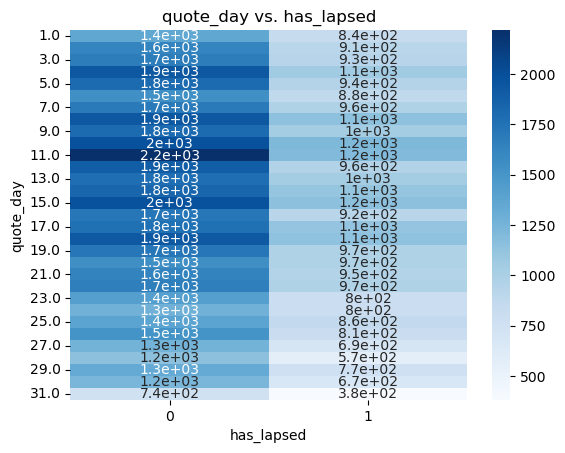

Chi-squared test statistic: 56.78
P-value: 0.00
Degrees of freedom: 11
Cramer's V statistic: 0.03


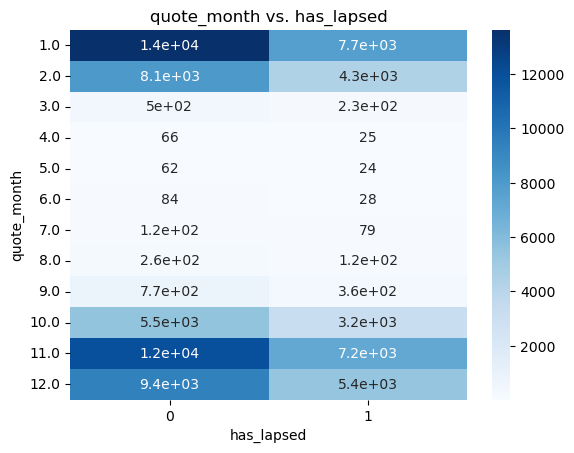

In [19]:
for col in ['quote_day','quote_month']:
    
    discrete_comparison(date_df , col , 'has_lapsed')

there seems to be significant difference between the values of quote day and month but cramers V suggests that the associations are extremely weak. Based on this I will leave them out of initial models for simplicity and add them back in if any modelling requires increased complexity

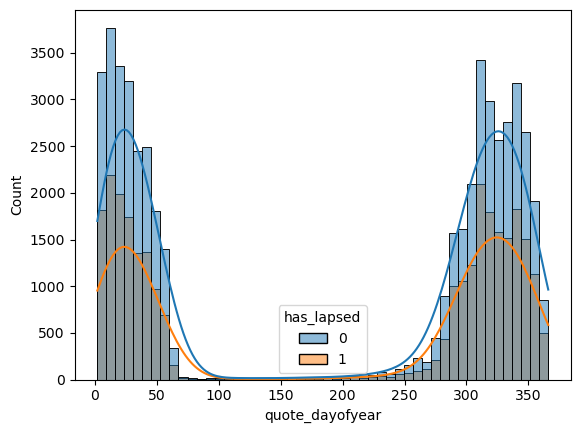

In [20]:
# lets have a look at dayofyear and treat it as a continuous feature

sns.histplot(data=date_df, x="quote_dayofyear", hue="has_lapsed", kde=True, alpha=0.5, bins=50);

The relative proportions here show that the distributions of the dayofyear are very similar. Lets double check with chi squared and cramers V.

Chi-squared test statistic: 670.96
P-value: 0.00
Degrees of freedom: 357
Cramer's V statistic: 0.09


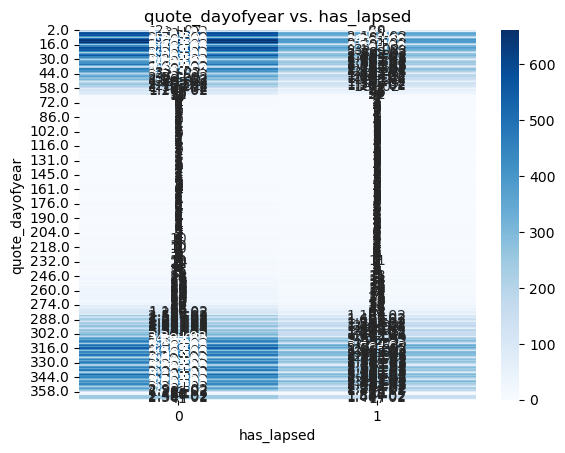

In [21]:
discrete_comparison(date_df , 'quote_dayofyear' , 'has_lapsed')
# again, a very weak association that could just add noise to a future model

looking at how has_lapsed mean changes over time with regards to quote date and cover start

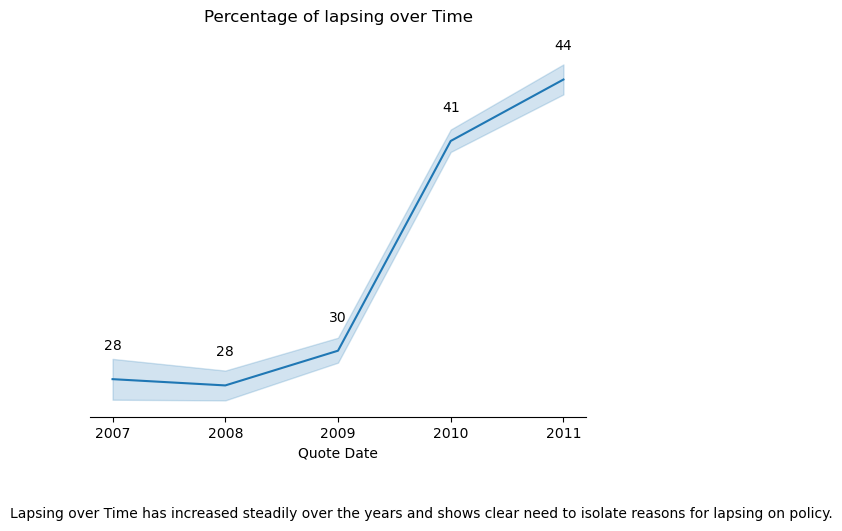

In [448]:
# init fig
fig, ax = plt.subplots()

# Plot using seaborn
sns.lineplot(x='quote_year', y='has_lapsed', data=date_df[date_df['quote_year'].isin([2012, 2006]) == False], ax = ax)

# Set axis labels and legend
ax.set_title('Percentage of lapsing over Time\n')
ax.set_xlabel('Quote Date')
ax.set_ylabel(None)
ax.set_xticks([2007, 2008, 2009, 2010, 2011])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

# create new table for annotations
groupby_df = date_df.groupby('quote_year').mean().reset_index()[['quote_year', 'has_lapsed']]
groupby_df = groupby_df[groupby_df['quote_year'].isin([2007, 2008, 2009, 2010, 2011])]


# Annotate the plot with the values of the y-axis for each date
for index, row in groupby_df.iterrows():
    plt.annotate(str(int(row['has_lapsed']*100)), xy=(row['quote_year'], (row['has_lapsed']+ 0.014)), ha='center', va='bottom')


statement = '''Lapsing over Time has increased steadily over the years and shows clear need to isolate reasons for lapsing on policy.'''
fig.text(0, -0.1, statement)
plt.show()

In [23]:
# quote date will be dropped as a feature for modelling as the accociatins were week between months and days of the year
# which was expected

I'm not expecting the COVER_START to have an impact on the housing policy but the **age** of the policy owner may unearth certain age groups that struggle to keep payments up for insurance.

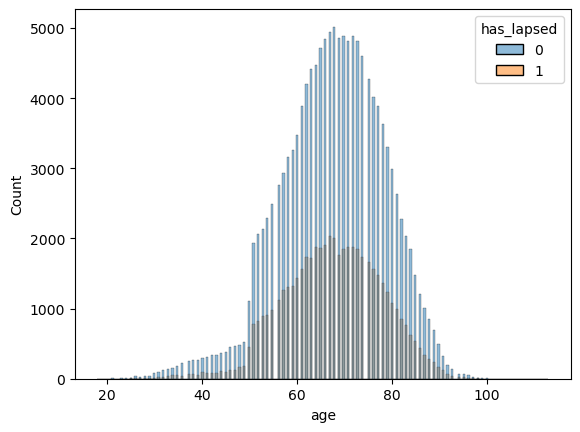

In [24]:
date_df['age'] = date_df['COVER_START'].dt.year - date_df['P1_DOB'].dt.year


sns.histplot(data = date_df, x='age', hue = 'has_lapsed');

T-test statistic is -0.22, with p-value of 0.83


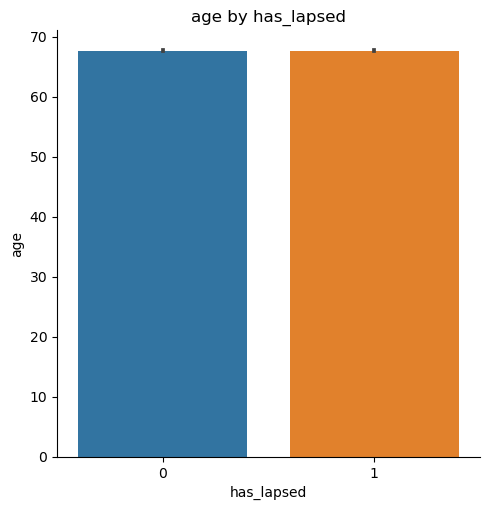

In [25]:
continuous_vs_categorical(date_df , 'age', 'has_lapsed')

Above stats are an indication that the age of the individual has no relationship with the lapsing boolean, the above bar chart shows that there is little difference in the mean age of both lapsed and non-lapsed groups

#### in light of the date features and the age column relationship with the tartget var. I'm going to drop these columns.

In [26]:
data_no_nulls = data_no_nulls.drop(['QUOTE_DATE', 
                                    #'COVER_START'
                                   ], axis = 'columns')

data_no_nulls = data_no_nulls.drop(['P1_DOB'], axis = 'columns')


In [27]:
data_no_nulls

,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,BUS_USE,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,LAST_ANN_PREM_GROSS,POL_STATUS,has_lapsed
0,2007-11-22,N,R,N,Y,19.0,1000000.0,7.0,Y,6.0,50000.0,7.0,Y,Y,7500.0,44.42,12.45,O,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,10.0,Y,Y,N,1960.0,PureDD,0.0,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,274.81,Lapsed,1
1,2008-01-01,N,E,Y,Y,25.0,1000000.0,6.0,Y,9.0,50000.0,7.0,Y,Y,0.0,0.00,24.60,M,N,M,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,2.0,N,N,N,1960.0,PureDD,0.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,308.83,Live,0
2,2007-11-23,N,E,N,N,NaN,0.0,0.0,Y,12.0,50000.0,7.0,N,Y,0.0,0.00,0.00,S,N,M,Y,Y,2.0,11.0,15.0,Y,3.0,0.0,Y,PH,8.0,0.0,9.0,N,Y,N,1946.0,PureDD,0.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,52.65,Live,0
3,2007-12-12,N,R,N,N,NaN,0.0,0.0,Y,14.0,50000.0,7.0,N,Y,0.0,0.00,0.00,W,N,F,N,Y,2.0,11.0,15.0,Y,3.0,0.0,N,PH,18.0,0.0,19.0,N,Y,N,1870.0,NonDD,0.0,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,54.23,Live,0
4,2007-12-15,N,R,N,Y,5.0,1000000.0,7.0,Y,10.0,50000.0,7.0,Y,Y,0.0,0.00,19.82,M,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1960.0,DD-Other,0.0,Y,Y,N,N,Y,Y,N,N,N,N,N,N,N,N,N,244.58,Live,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256131,2005-02-22,Y,R,N,Y,16.0,1000000.0,2.0,Y,10.0,50000.0,2.0,Y,Y,0.0,0.00,19.06,O,N,F,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,2.0,N,N,N,1980.0,PureDD,1.0,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,235.08,Lapsed,1
256132,2000-01-12,N,R,N,Y,0.0,1000000.0,5.0,Y,0.0,50000.0,5.0,Y,Y,0.0,0.00,26.79,M,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1980.0,NonDD,1.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,194.02,Live,0
256133,2006-01-18,N,R,N,Y,1.0,1000000.0,5.0,Y,18.0,50000.0,5.0,Y,Y,0.0,0.00,0.00,O,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,19.0,N,Y,N,1900.0,PureDD,1.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,287.30,Live,0
256134,2004-12-31,N,R,N,Y,32.0,1000000.0,5.0,N,NaN,0.0,0.0,Y,N,0.0,0.00,0.00,O,N,M,N,Y,5.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,19.0,N,Y,N,1900.0,DD-Other,1.0,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,457.57,Lapsed,1


#### employment status assumptions and Marital staus assumptions

employment_status_map = {
    'R': 'Retired',
    'E': 'Employed',
    'S': 'Self-employed',
    'N': 'Not employed',
    'H': 'Homemaker',
    'U': 'Unknown',
    'A': 'Apprentice',
    'F': 'Full-time education',
    'I': 'Inactive',
    'V': 'Voluntary work',
    'C': 'Carer'
}



marital_status = {
    'M': 'Married',
    'P': 'Partnership',
    'O': 'Other',
    'W': 'Widowed',
    'S': 'Single',
    'D': 'Divorced',
    'A': 'Separated',
    'C': 'Cohabiting',
    'B': 'Unknown',
    'N': 'Not Disclosed'
}



In [28]:
data_no_nulls.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 189005 entries, 0 to 256135
Data columns (total 57 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   COVER_START             189005 non-null  datetime64[ns]
 1   CLAIM3YEARS             189005 non-null  object        
 2   P1_EMP_STATUS           189005 non-null  object        
 3   BUS_USE                 189005 non-null  object        
 4   AD_BUILDINGS            189005 non-null  object        
 5   RISK_RATED_AREA_B       140865 non-null  float64       
 6   SUM_INSURED_BUILDINGS   189005 non-null  float64       
 7   NCD_GRANTED_YEARS_B     189005 non-null  float64       
 8   AD_CONTENTS             189005 non-null  object        
 9   RISK_RATED_AREA_C       180274 non-null  float64       
 10  SUM_INSURED_CONTENTS    189005 non-null  float64       
 11  NCD_GRANTED_YEARS_C     189005 non-null  float64       
 12  CONTENTS_COVER          189005

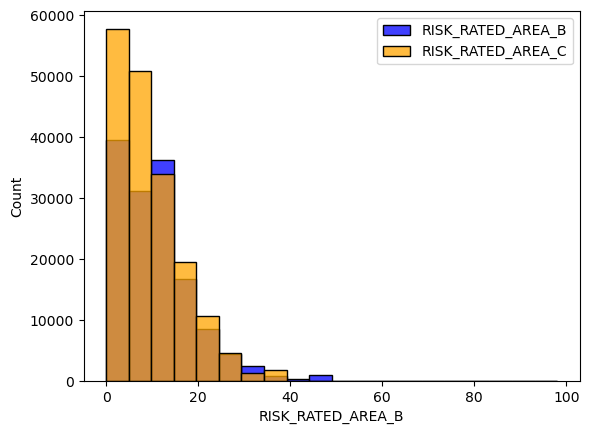

In [29]:
# the only fields missing values now are the RISK rated area B and risk rated area C
# lets look at the distributions of both to decise hat the most appropriate inputation methods are

sns.histplot(data = data_no_nulls, x = 'RISK_RATED_AREA_B', color = 'b', bins = 20);
sns.histplot(data = data_no_nulls, x = 'RISK_RATED_AREA_C', color = 'orange', bins = 20);
plt.legend(labels=['RISK_RATED_AREA_B', 'RISK_RATED_AREA_C'])
plt.show()

Relationship is exponential decay, so the best method would be to imput these features with the median

In [30]:
data_no_nulls['RISK_RATED_AREA_B'].fillna(np.mean(data_no_nulls['RISK_RATED_AREA_B']), inplace = True)
data_no_nulls['RISK_RATED_AREA_C'].fillna(np.mean(data_no_nulls['RISK_RATED_AREA_C']), inplace = True)

In [31]:
data_no_nulls.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 189005 entries, 0 to 256135
Data columns (total 57 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   COVER_START             189005 non-null  datetime64[ns]
 1   CLAIM3YEARS             189005 non-null  object        
 2   P1_EMP_STATUS           189005 non-null  object        
 3   BUS_USE                 189005 non-null  object        
 4   AD_BUILDINGS            189005 non-null  object        
 5   RISK_RATED_AREA_B       189005 non-null  float64       
 6   SUM_INSURED_BUILDINGS   189005 non-null  float64       
 7   NCD_GRANTED_YEARS_B     189005 non-null  float64       
 8   AD_CONTENTS             189005 non-null  object        
 9   RISK_RATED_AREA_C       189005 non-null  float64       
 10  SUM_INSURED_CONTENTS    189005 non-null  float64       
 11  NCD_GRANTED_YEARS_C     189005 non-null  float64       
 12  CONTENTS_COVER          189005

In [32]:
data_no_nulls.head()

,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,BUS_USE,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,LAST_ANN_PREM_GROSS,POL_STATUS,has_lapsed
0,2007-11-22,N,R,N,Y,19.000000,1000000.0,7.0,Y,6.0,50000.0,7.0,Y,Y,7500.0,44.42,12.45,O,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,10.0,Y,Y,N,1960.0,PureDD,0.0,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,274.81,Lapsed,1
1,2008-01-01,N,E,Y,Y,25.000000,1000000.0,6.0,Y,9.0,50000.0,7.0,Y,Y,0.0,0.00,24.60,M,N,M,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,2.0,N,N,N,1960.0,PureDD,0.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,308.83,Live,0
2,2007-11-23,N,E,N,N,10.273886,0.0,0.0,Y,12.0,50000.0,7.0,N,Y,0.0,0.00,0.00,S,N,M,Y,Y,2.0,11.0,15.0,Y,3.0,0.0,Y,PH,8.0,0.0,9.0,N,Y,N,1946.0,PureDD,0.0,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,52.65,Live,0
3,2007-12-12,N,R,N,N,10.273886,0.0,0.0,Y,14.0,50000.0,7.0,N,Y,0.0,0.00,0.00,W,N,F,N,Y,2.0,11.0,15.0,Y,3.0,0.0,N,PH,18.0,0.0,19.0,N,Y,N,1870.0,NonDD,0.0,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,54.23,Live,0
4,2007-12-15,N,R,N,Y,5.000000,1000000.0,7.0,Y,10.0,50000.0,7.0,Y,Y,0.0,0.00,19.82,M,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1960.0,DD-Other,0.0,Y,Y,N,N,Y,Y,N,N,N,N,N,N,N,N,N,244.58,Live,0


In [33]:
# summary stats
data_no_nulls.describe(include = 'all')

/var/folders/52/frb9m4f51mq543by_rw247kc0000gn/T/ipykernel_20963/3235961184.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_no_nulls.describe(include = 'all')


,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,BUS_USE,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,LAST_ANN_PREM_GROSS,POL_STATUS,has_lapsed
count,189005,189005,189005,189005,189005,189005.000000,189005.000000,189005.000000,189005,189005.000000,189005.000000,189005.000000,189005,189005,189005.000000,189005.000000,189005.000000,189005,189005,189005,189005,189005,189005.000000,189005.000000,189005.000000,189005,189005.000000,189005.000000,189005,189005,189005.000000,189005.000000,189005.000000,189005,189005,189005,189005.000000,189005,189005.000000,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005,189005.000000,189005,189005.00000
unique,2207,2,11,2,2,NaN,NaN,NaN,2,NaN,NaN,NaN,2,2,NaN,NaN,NaN,10,2,3,2,2,NaN,NaN,NaN,2,NaN,NaN,2,7,NaN,NaN,NaN,2,2,2,NaN,3,NaN,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,NaN,3,NaN
top,2011-01-03 00:00:00,N,R,N,Y,NaN,NaN,NaN,Y,NaN,NaN,NaN,Y,Y,NaN,NaN,NaN,M,N,M,N,Y,NaN,NaN,NaN,Y,NaN,NaN,N,PH,NaN,NaN,NaN,N,Y,N,NaN,NonDD,NaN,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,NaN,Live,NaN
freq,3510,167170,146609,186061,147248,NaN,NaN,NaN,180436,NaN,NaN,NaN,147248,180436,NaN,NaN,NaN,66472,188942,102996,174910,133915,NaN,NaN,NaN,185105,NaN,NaN,144033,188195,NaN,NaN,NaN,187403,145552,187769,NaN,95053,NaN,114479,105847,136171,179805,174102,175472,180107,179347,188964,186554,188795,153682,188989,188379,133630,NaN,132160,NaN
first,1992-01-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2012-01-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,10.273886,778138.144494,4.477167,NaN,9.055432,47836.036084,5.497336,NaN,NaN,329.493992,2.507021,5.653435,NaN,NaN,NaN,NaN,NaN,2.779710,11.020613,14.977974,NaN,2.995672,8.471517,NaN,NaN,7.646142,0.001095,10.230147,NaN,NaN,NaN,1944.993995,NaN,0.426179,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,186.725297,NaN,0.27795
std,NaN,NaN,NaN,NaN,NaN,7.294225,415499.802639,2.677508,NaN,7.446210,10706.789671,1.777474,NaN,NaN,1333.644371,10.666695,10.254379,NaN,NaN,NaN,NaN,NaN,0.801425,0.885433,0.870055,NaN,0.083711,15.213641,NaN,NaN,2.543348,0.033076,8.948981,NaN,NaN,NaN,28.903573,NaN,0.494522,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.495998,NaN,0.44799
min,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,1.000000,2.000000,1.000000,NaN,1.000000,0.000000,NaN,NaN,1.000000,0.000000,1.000000,NaN,NaN,NaN,1749.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1152.680000,NaN,0.00000
25%,NaN,NaN,NaN,NaN,NaN,6.000000,1000000.000000,3.000000,NaN,4.000000,50000.000000,6.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,2.000000,11.000000,15.000000,NaN,3.000000,0.000000,NaN,NaN,8.000000,0.000000,2.000000,NaN,NaN,NaN,1920.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

COVER_START is neither binary, categorical, nor continuous.
CLAIM3YEARS is categorical.


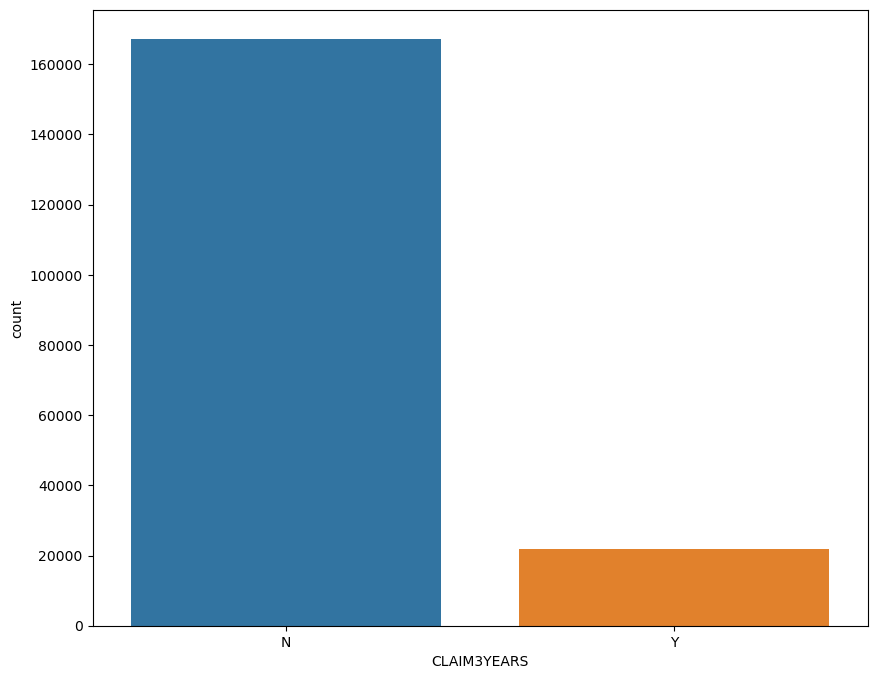

P1_EMP_STATUS is categorical.


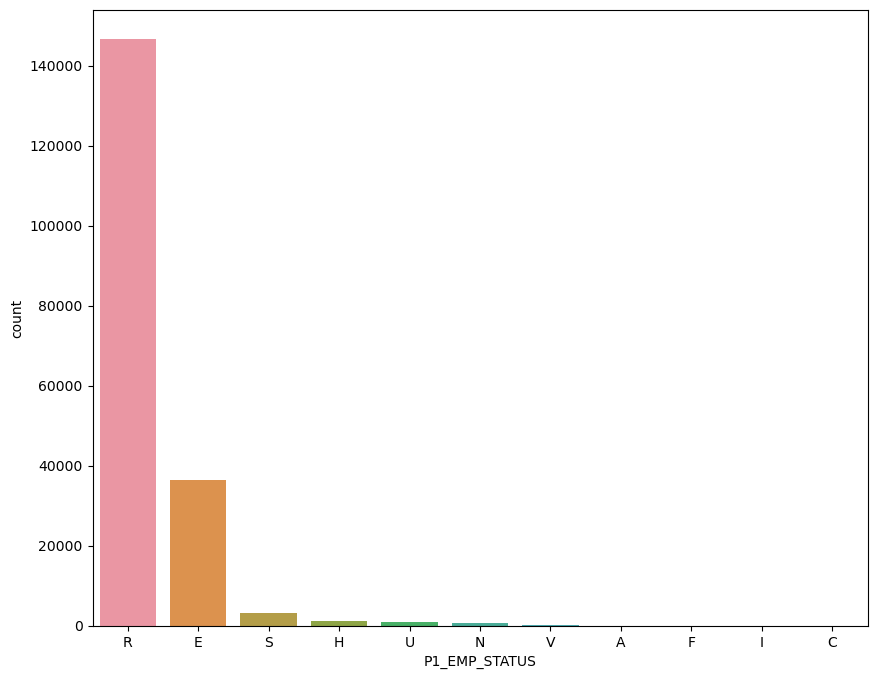

BUS_USE is categorical.


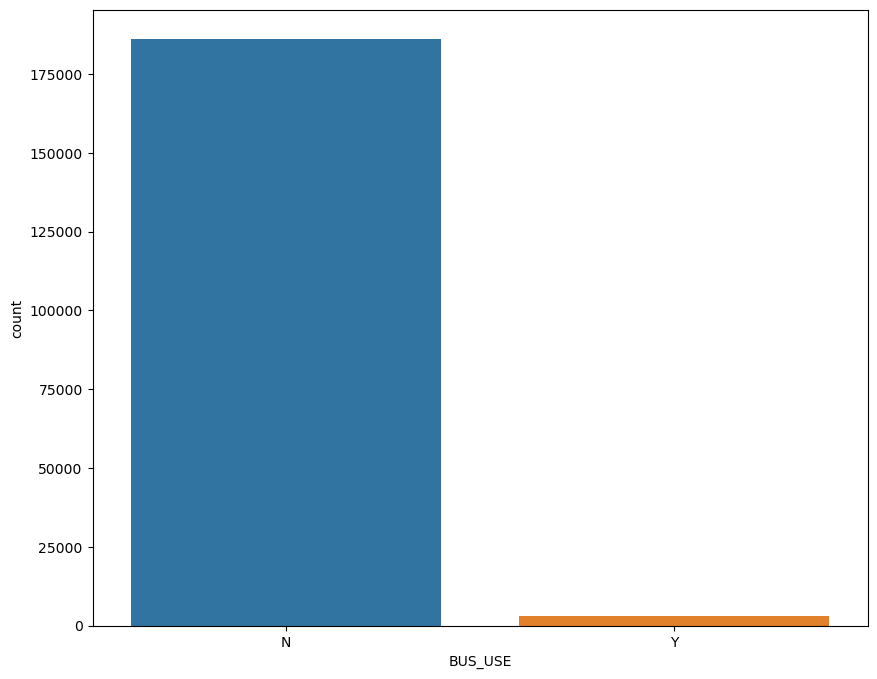

AD_BUILDINGS is categorical.


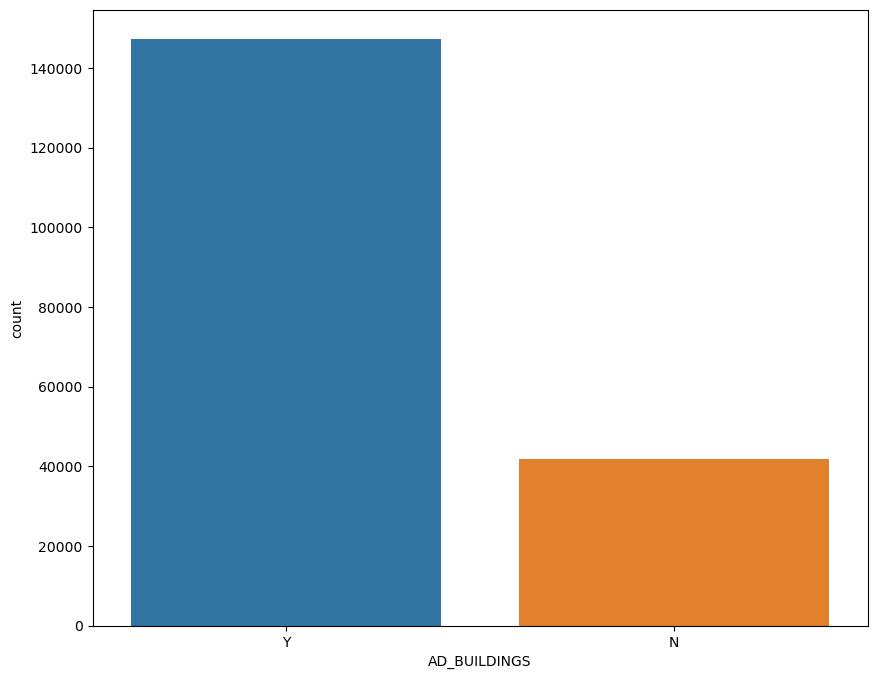

RISK_RATED_AREA_B is continuous.


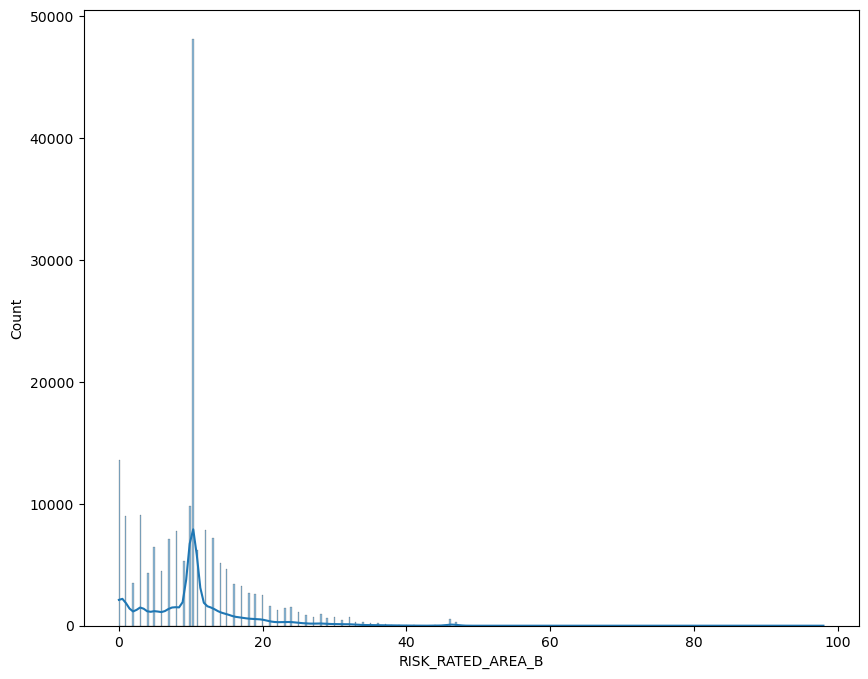

SUM_INSURED_BUILDINGS is continuous.


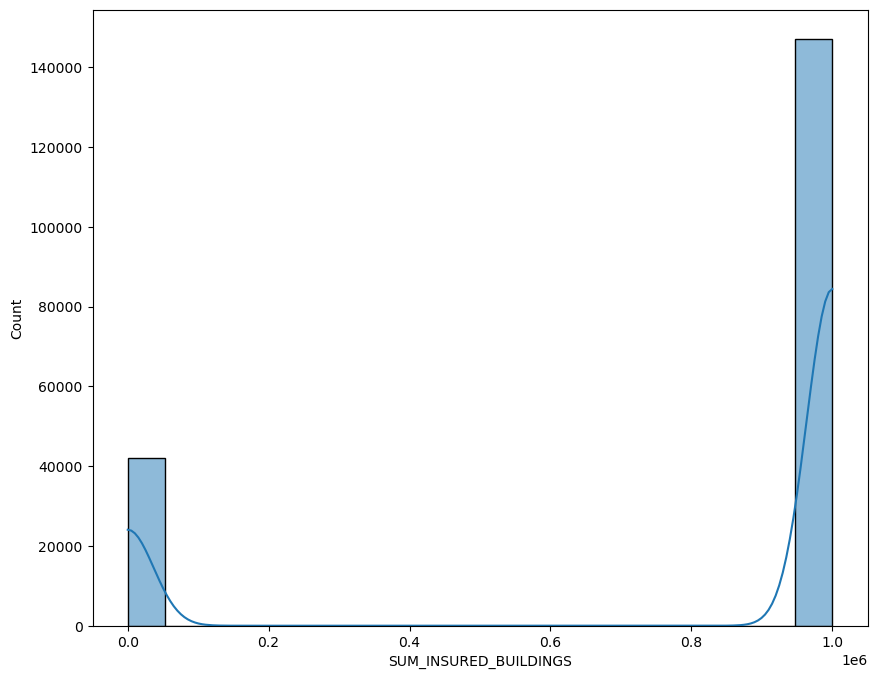

NCD_GRANTED_YEARS_B is continuous.


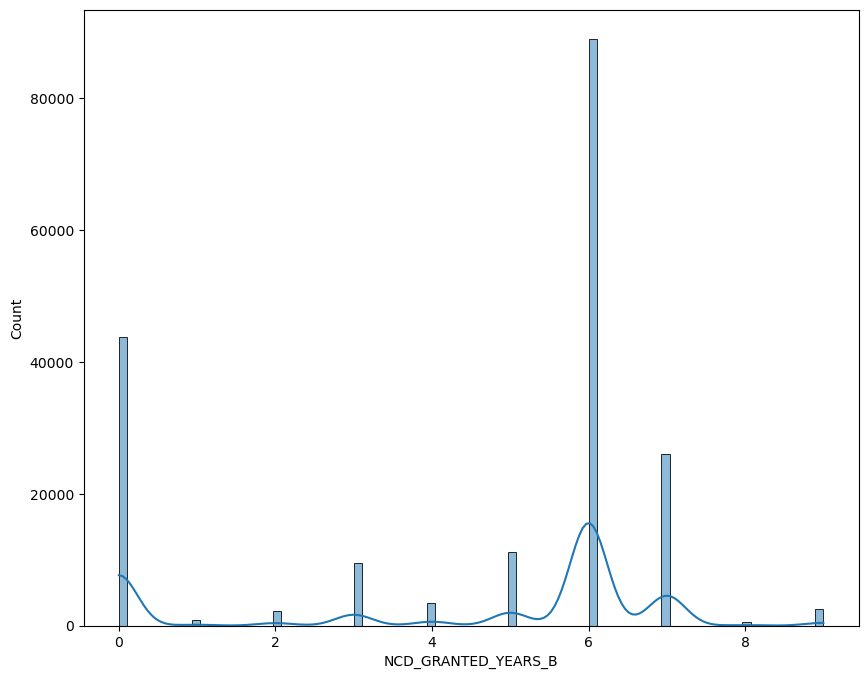

AD_CONTENTS is categorical.


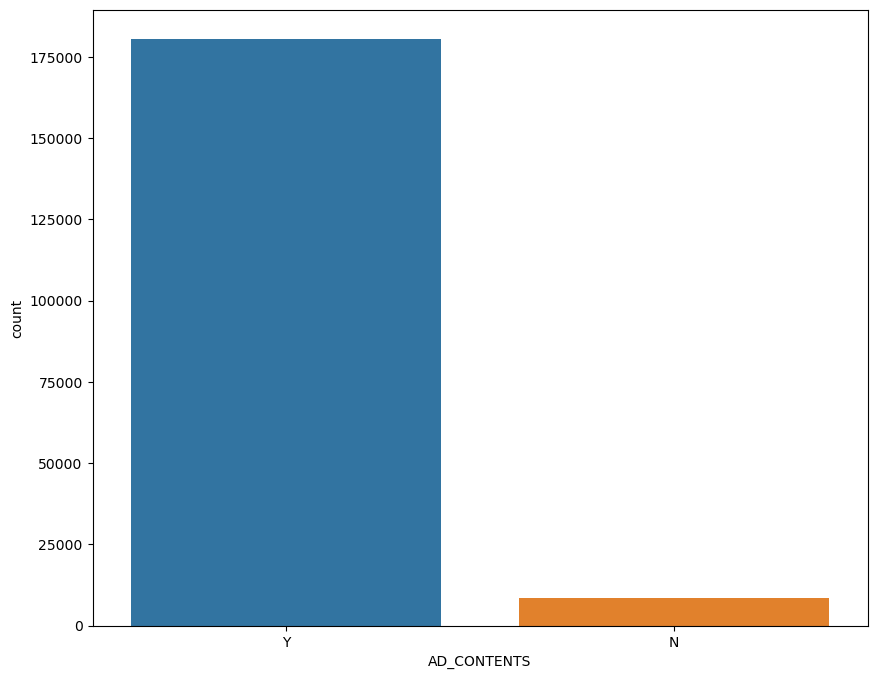

RISK_RATED_AREA_C is continuous.


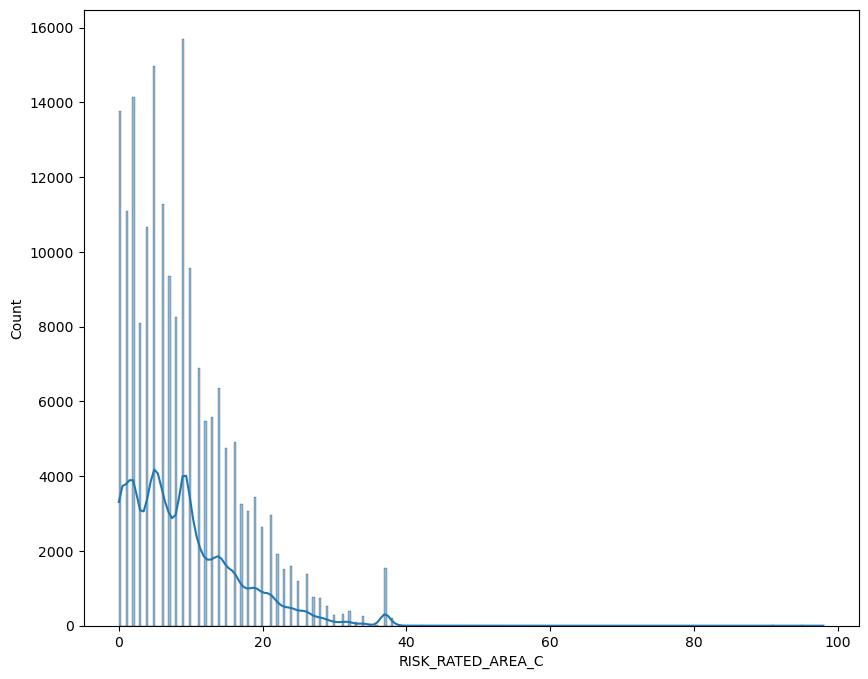

SUM_INSURED_CONTENTS is continuous.


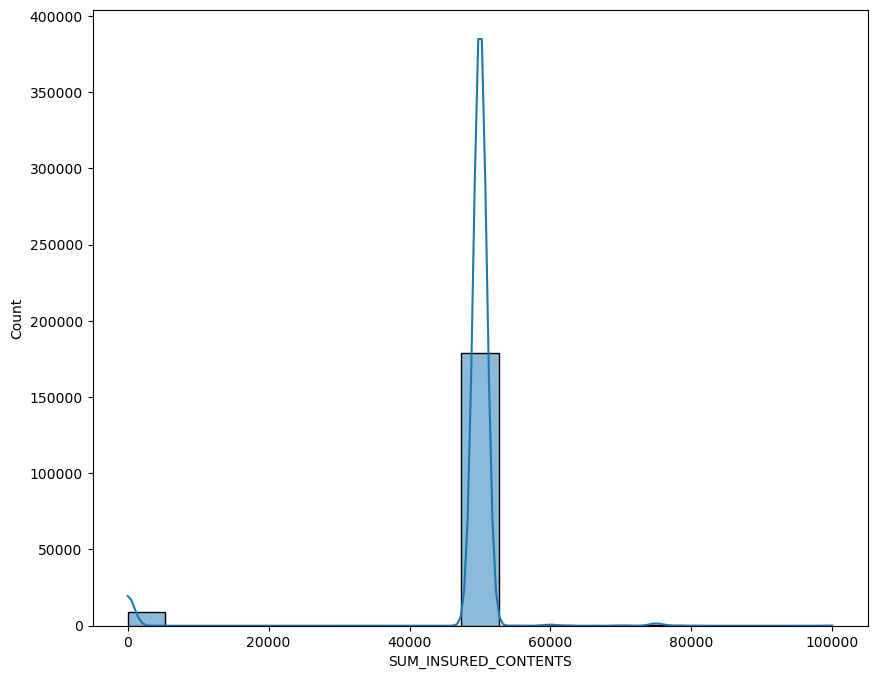

NCD_GRANTED_YEARS_C is continuous.


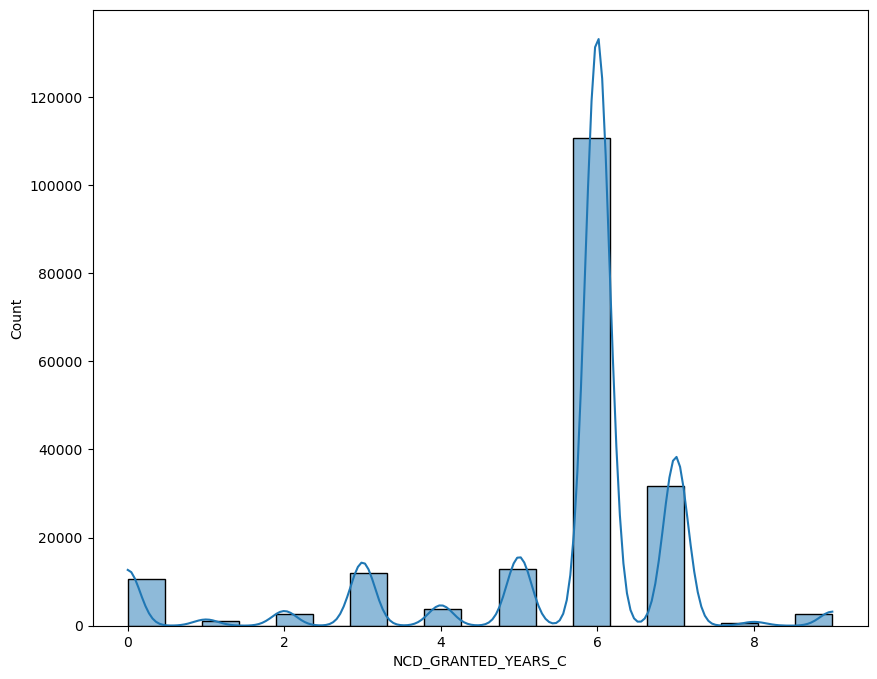

CONTENTS_COVER is categorical.


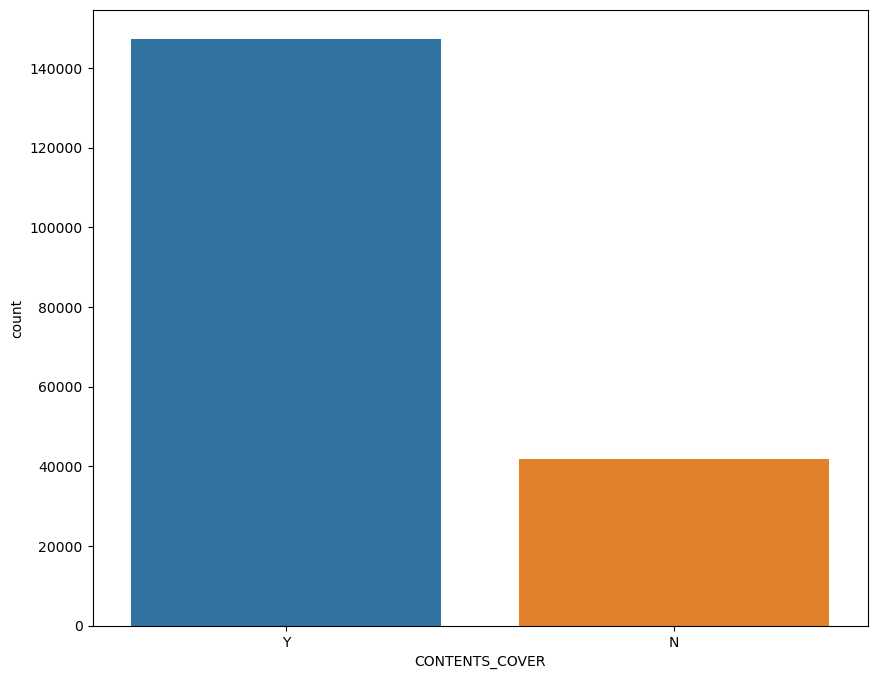

BUILDINGS_COVER is categorical.


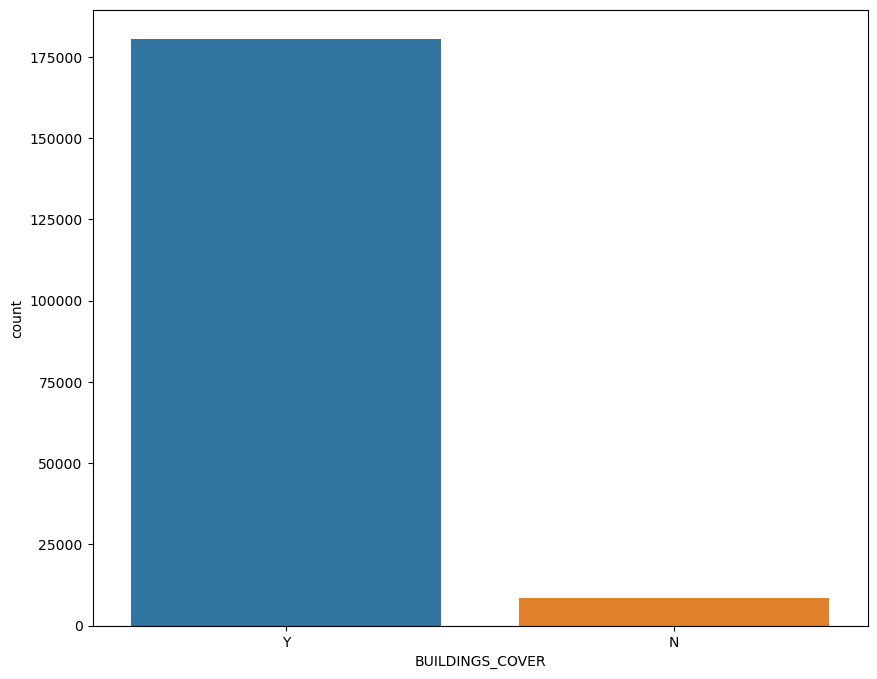

SPEC_SUM_INSURED is continuous.


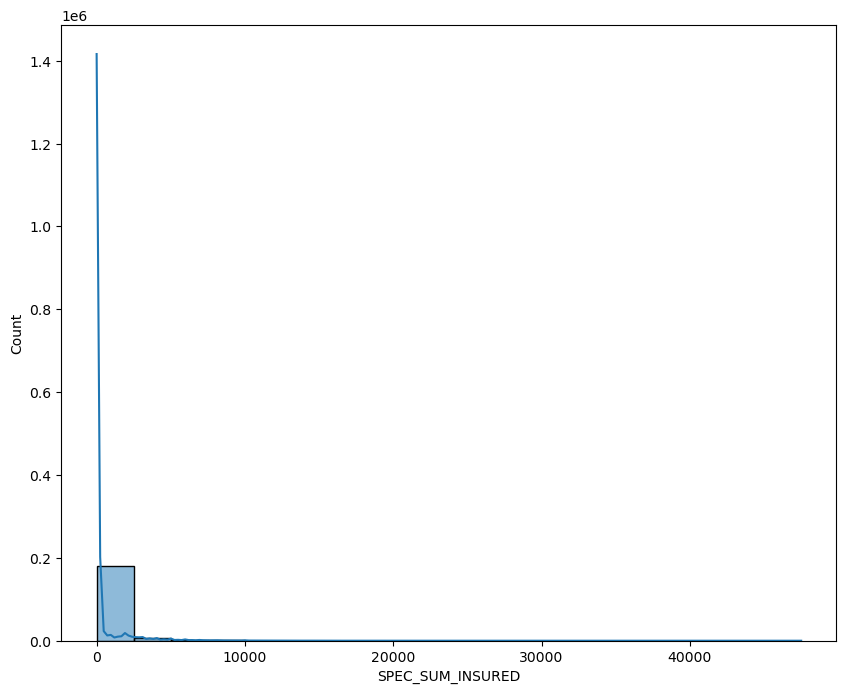

SPEC_ITEM_PREM is continuous.


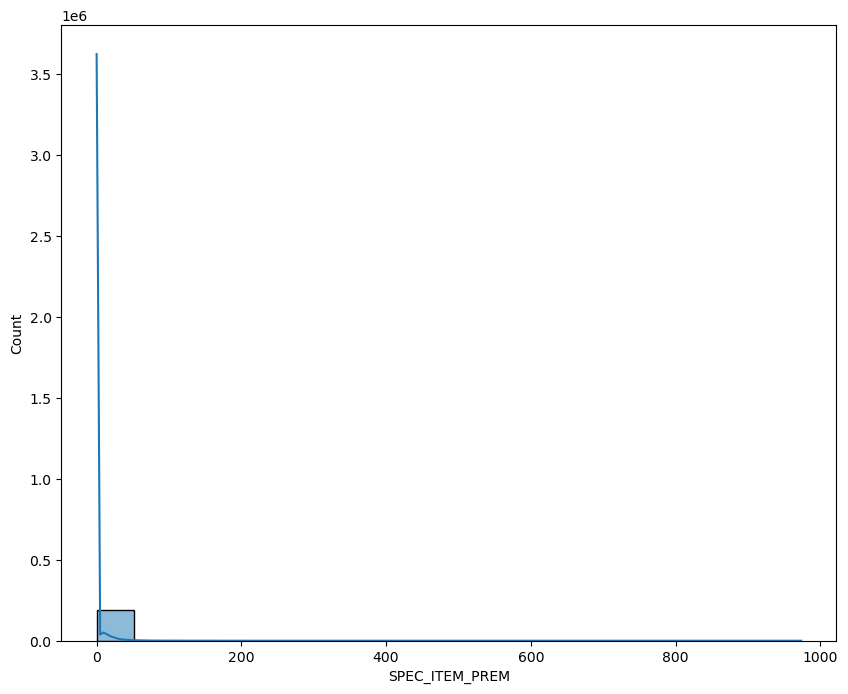

UNSPEC_HRP_PREM is continuous.


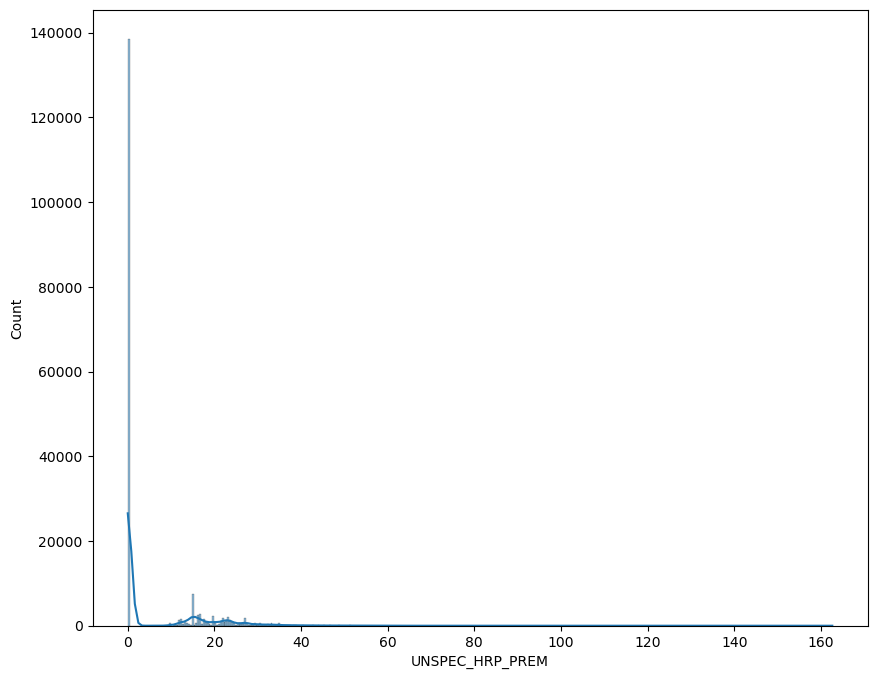

P1_MAR_STATUS is categorical.


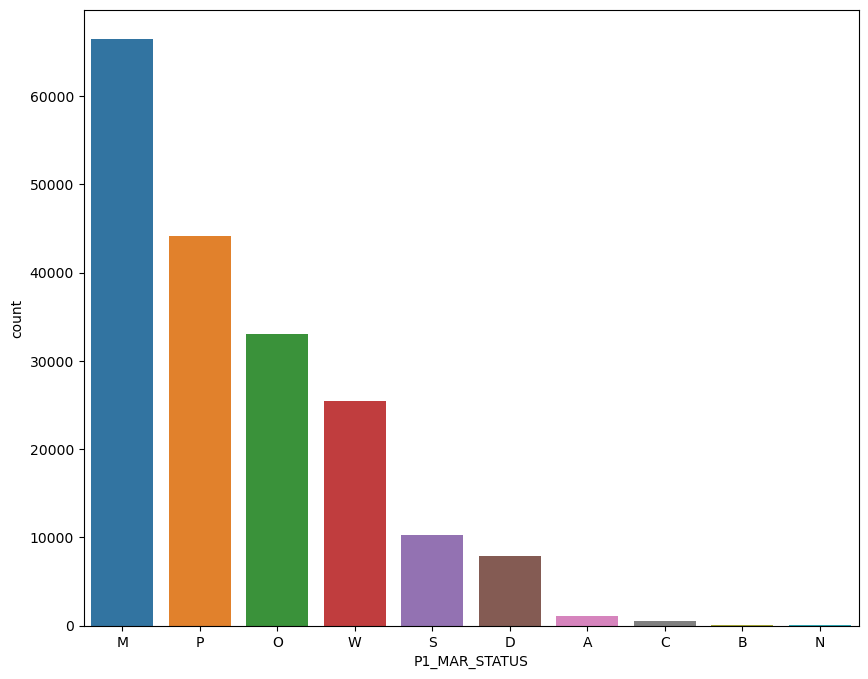

P1_POLICY_REFUSED is categorical.


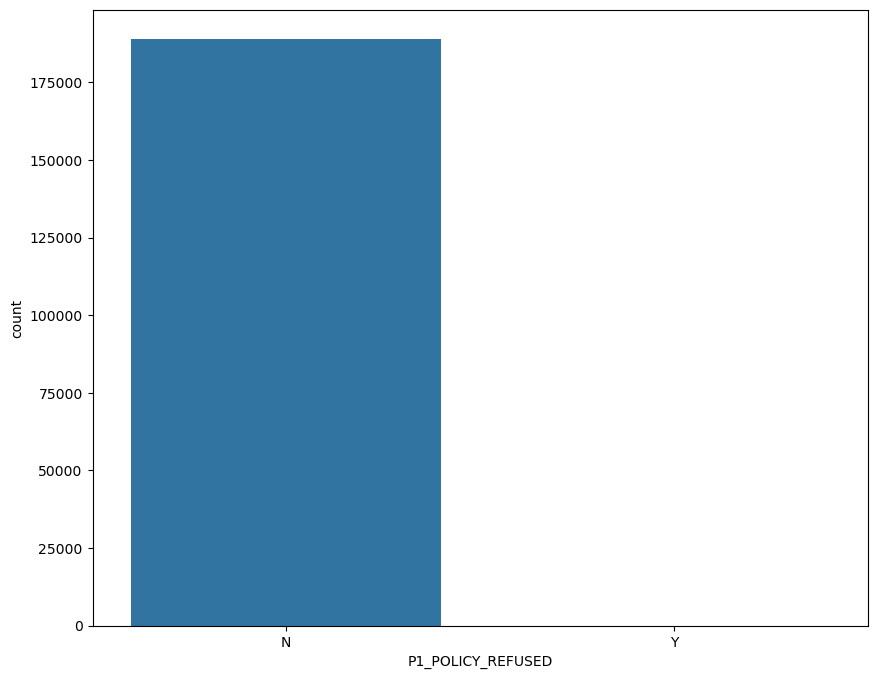

P1_SEX is categorical.


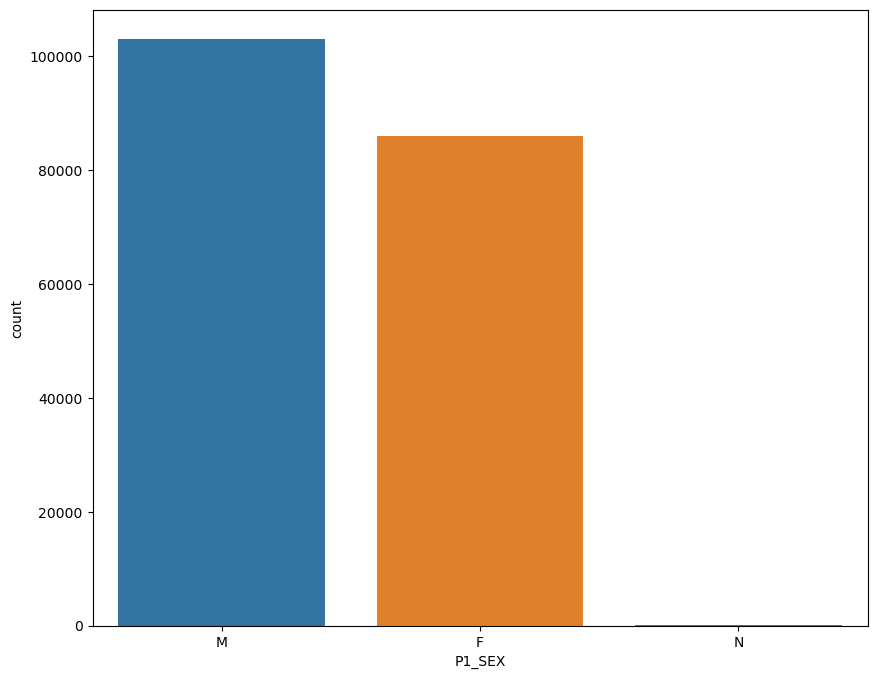

APPR_ALARM is categorical.


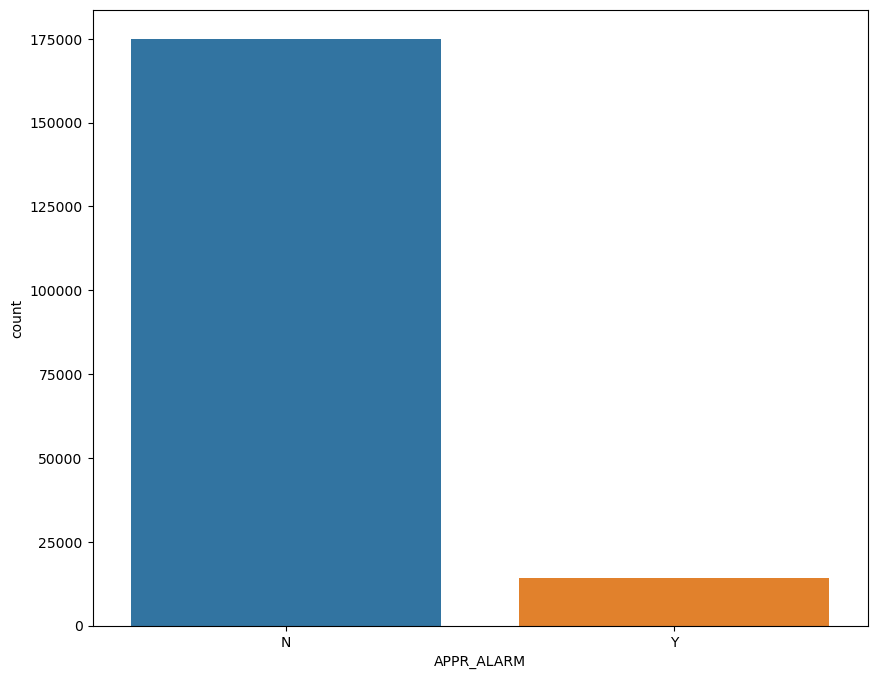

APPR_LOCKS is categorical.


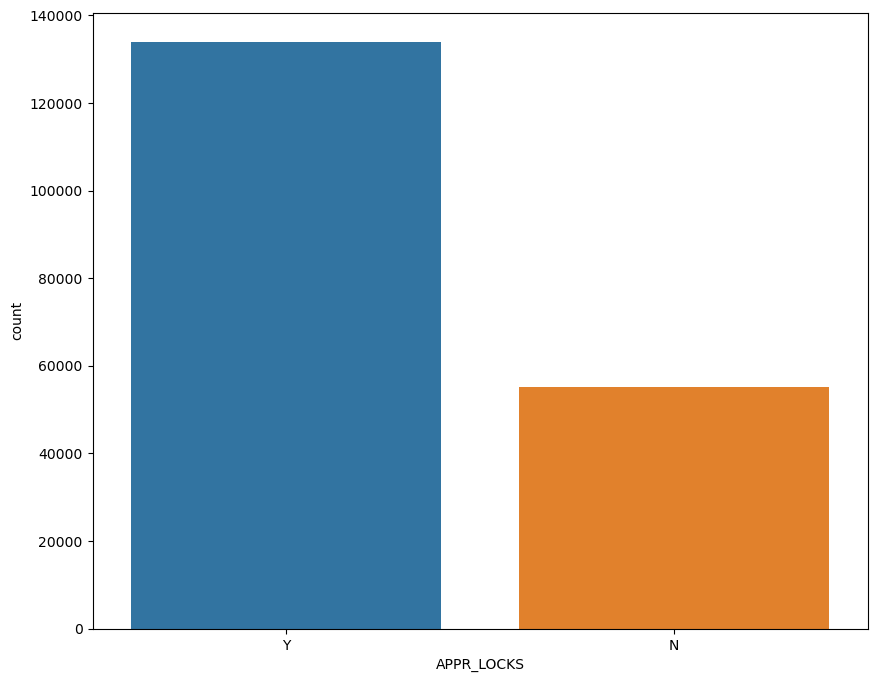

BEDROOMS is continuous.


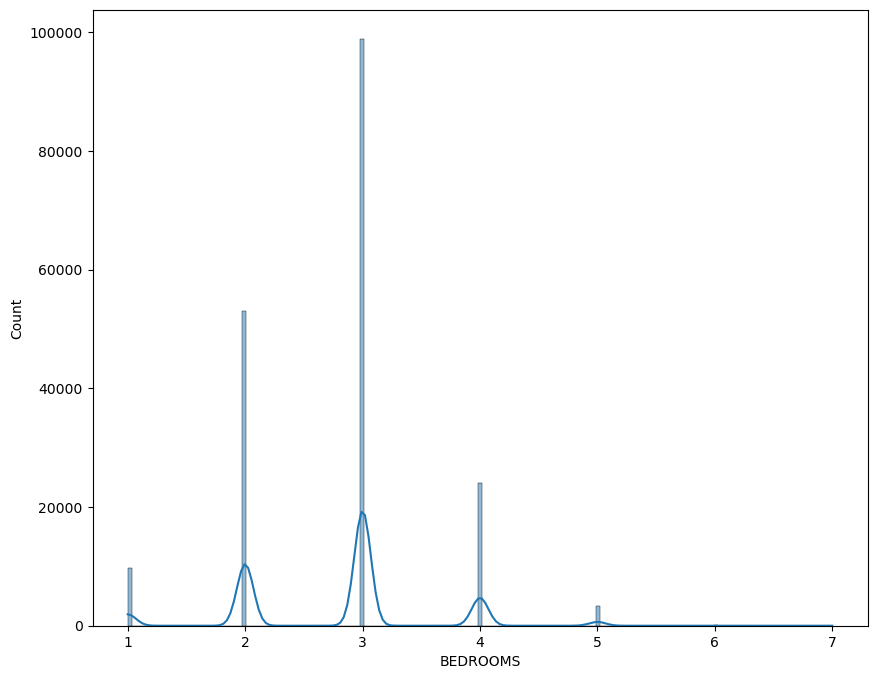

ROOF_CONSTRUCTION is continuous.


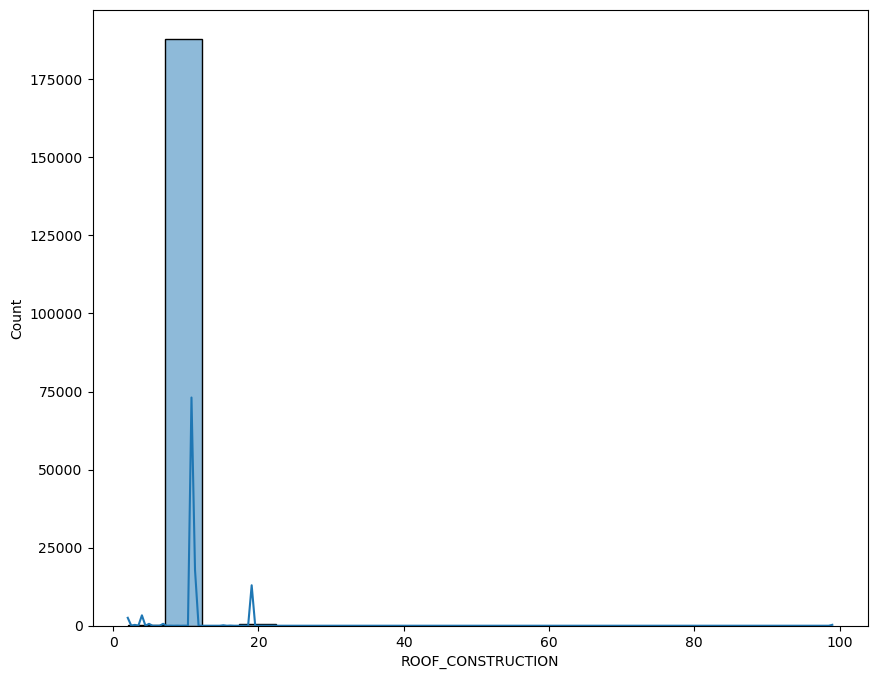

WALL_CONSTRUCTION is continuous.


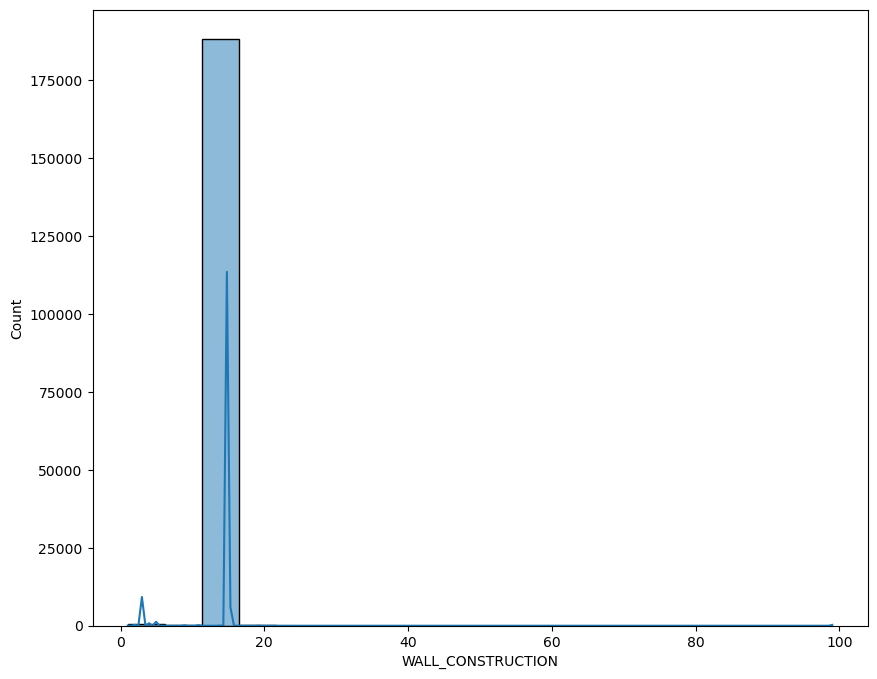

FLOODING is categorical.


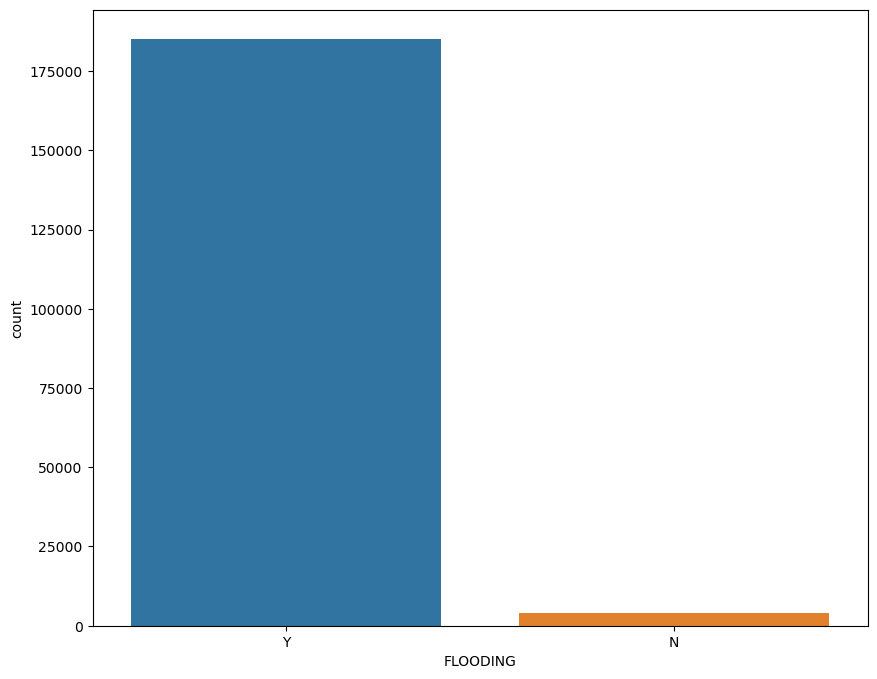

LISTED is continuous.


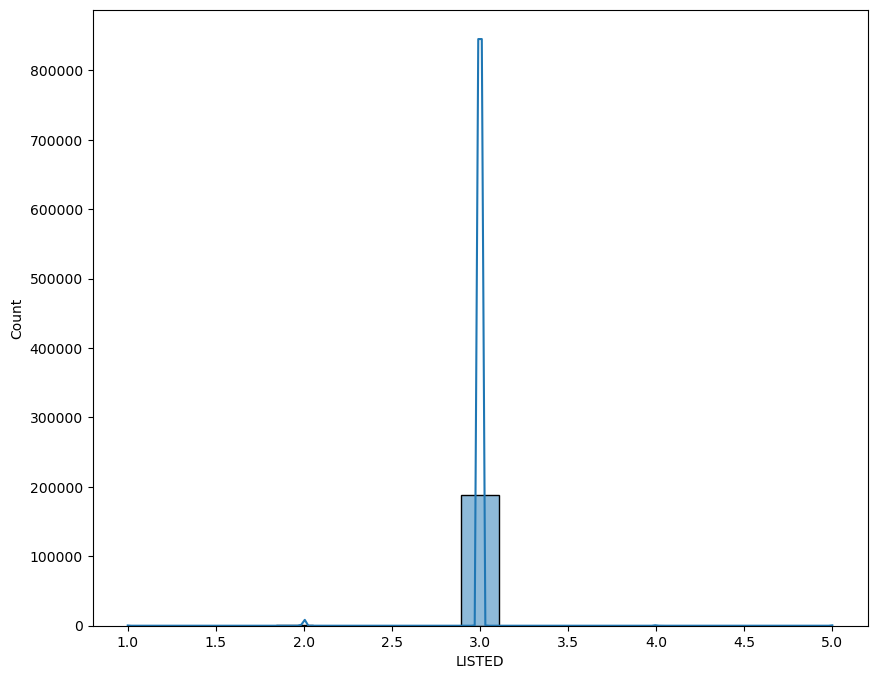

MAX_DAYS_UNOCC is continuous.


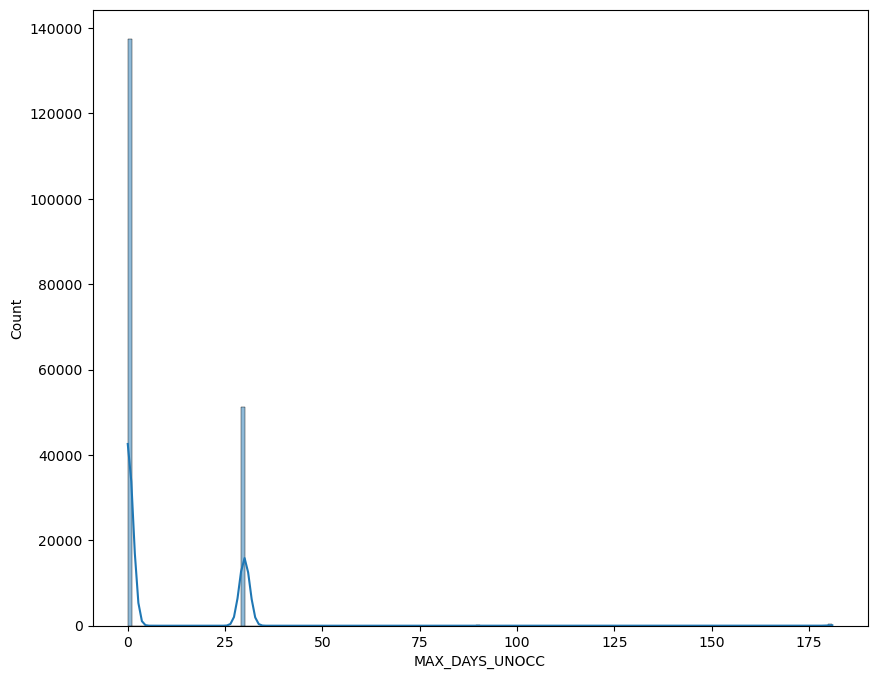

NEIGH_WATCH is categorical.


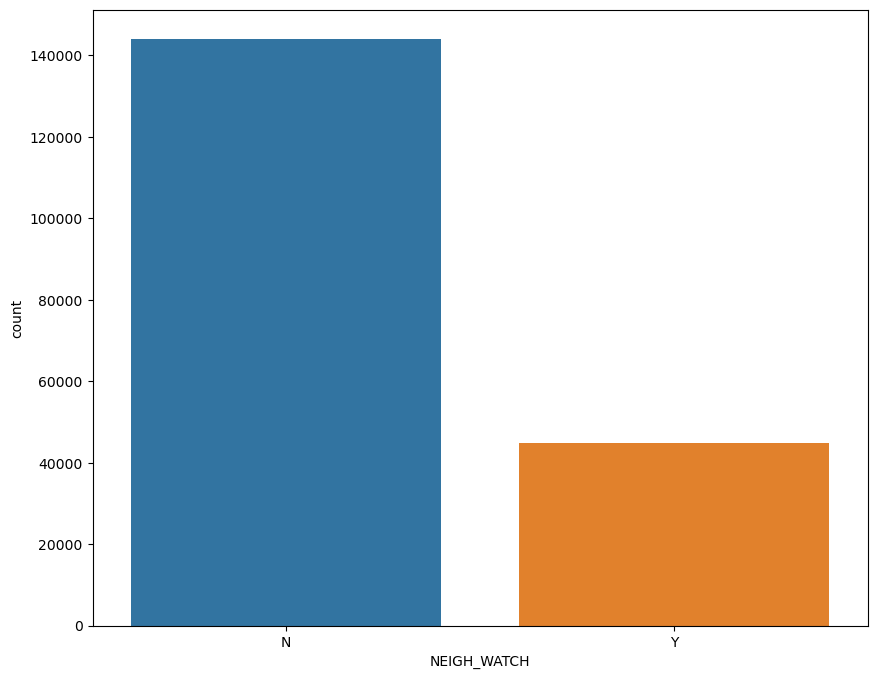

OCC_STATUS is categorical.


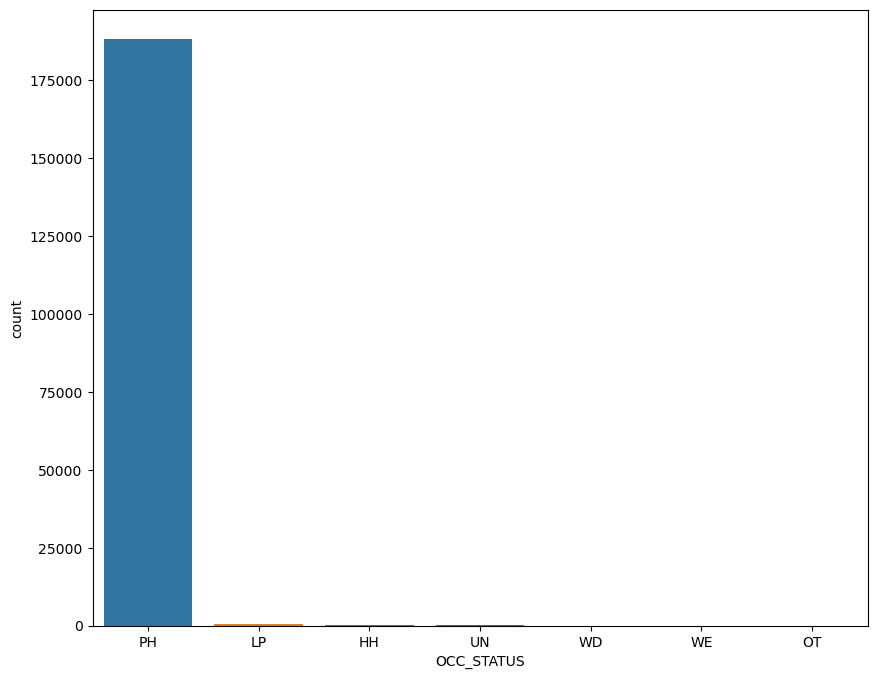

OWNERSHIP_TYPE is continuous.


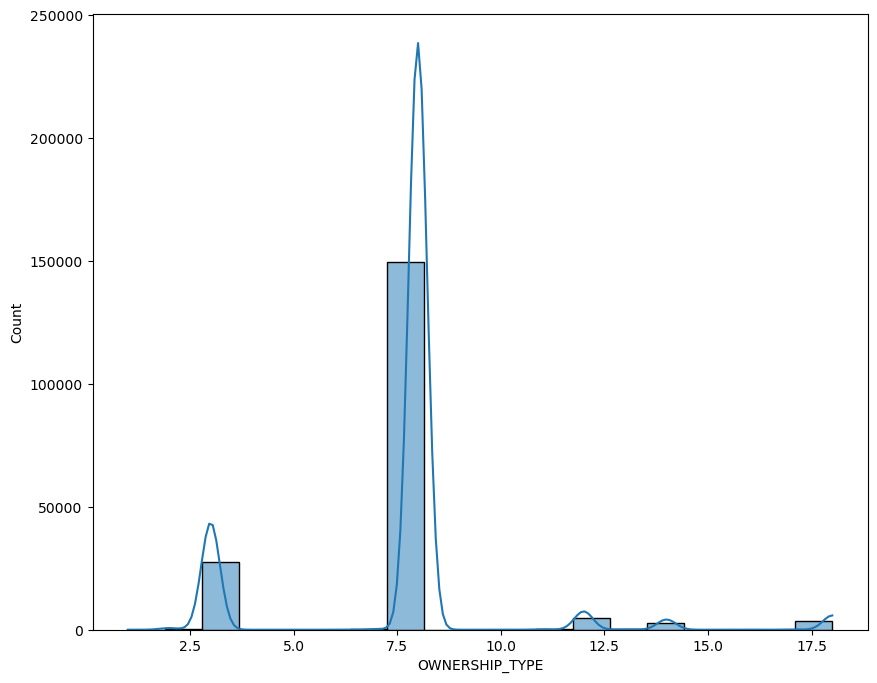

PAYING_GUESTS is binary.


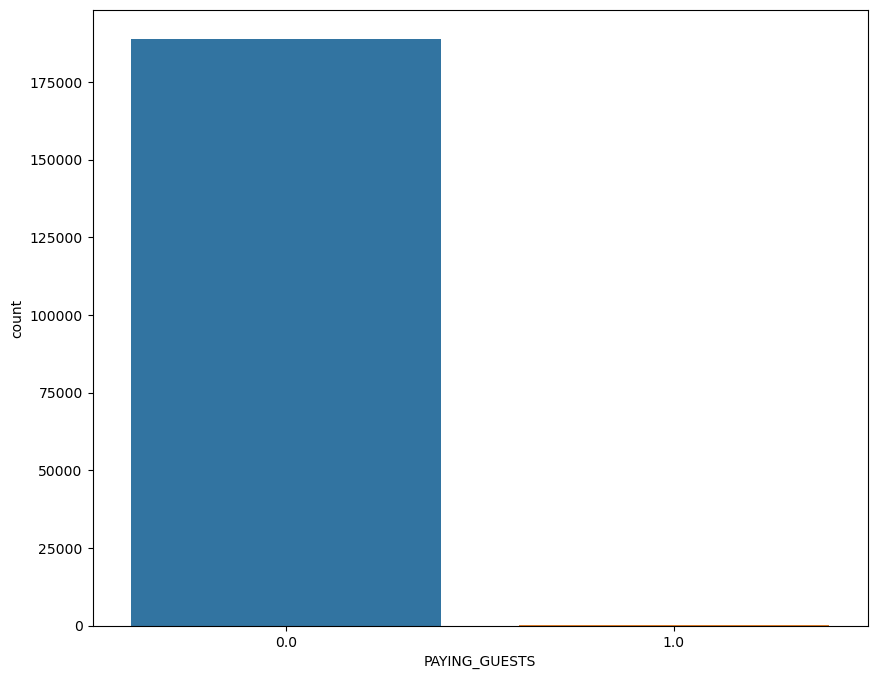

PROP_TYPE is continuous.


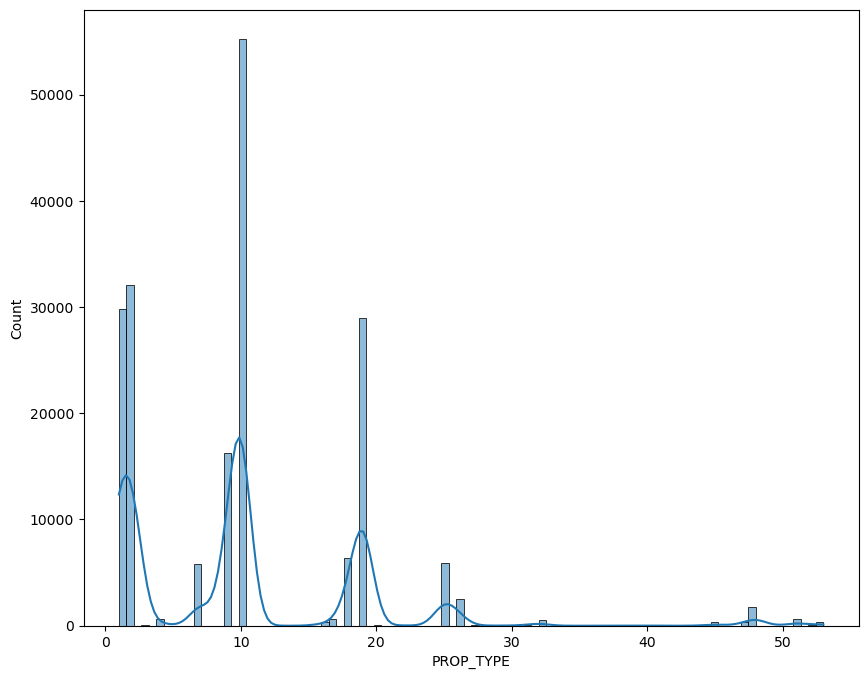

SAFE_INSTALLED is categorical.


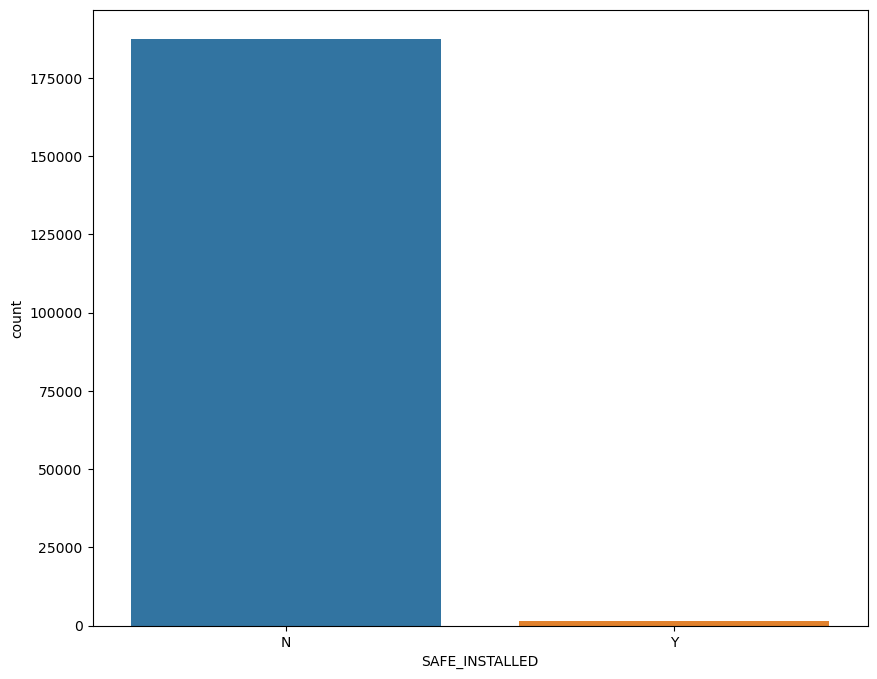

SEC_DISC_REQ is categorical.


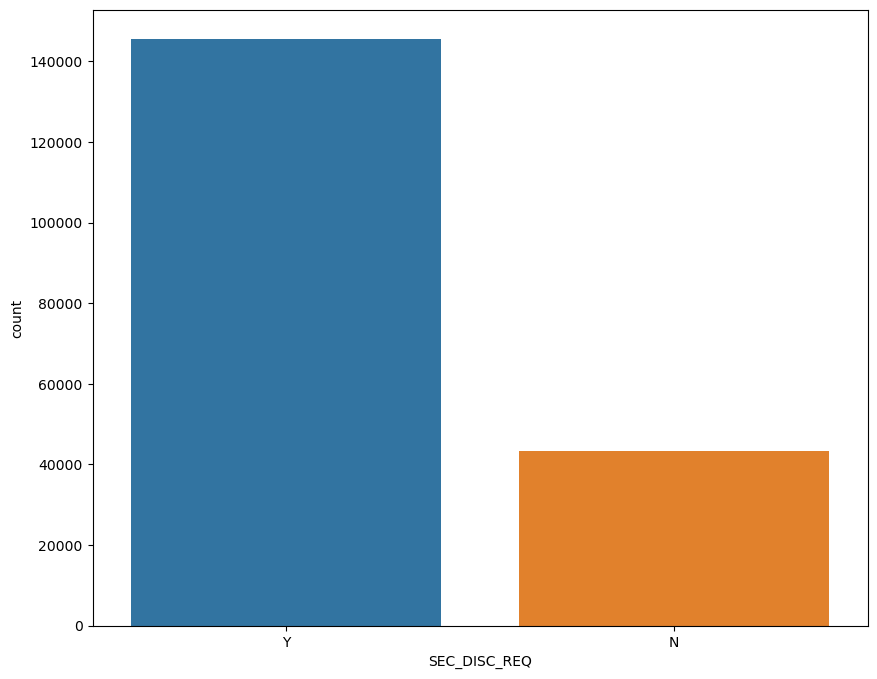

SUBSIDENCE is categorical.


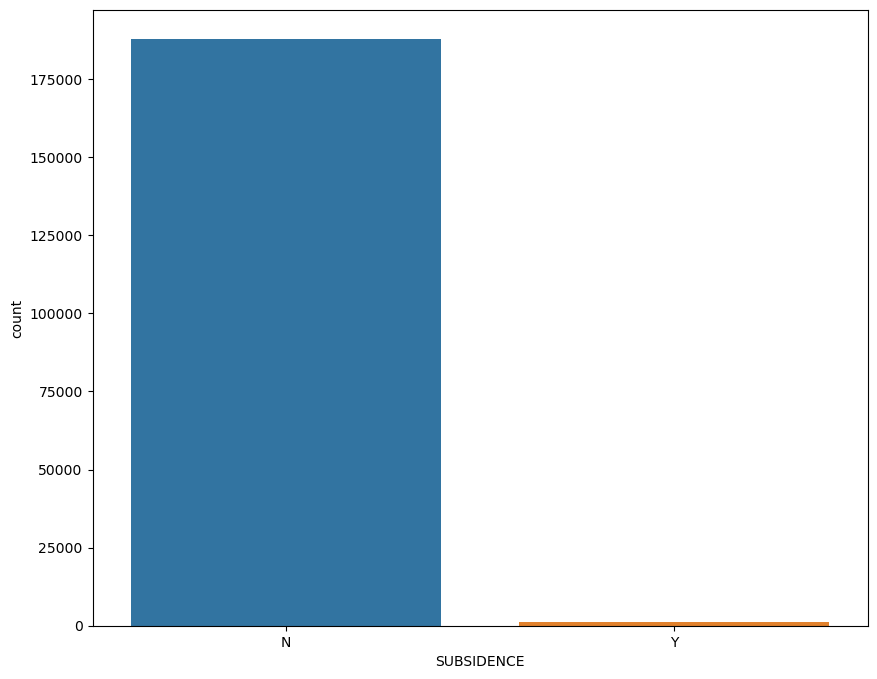

YEARBUILT is continuous.


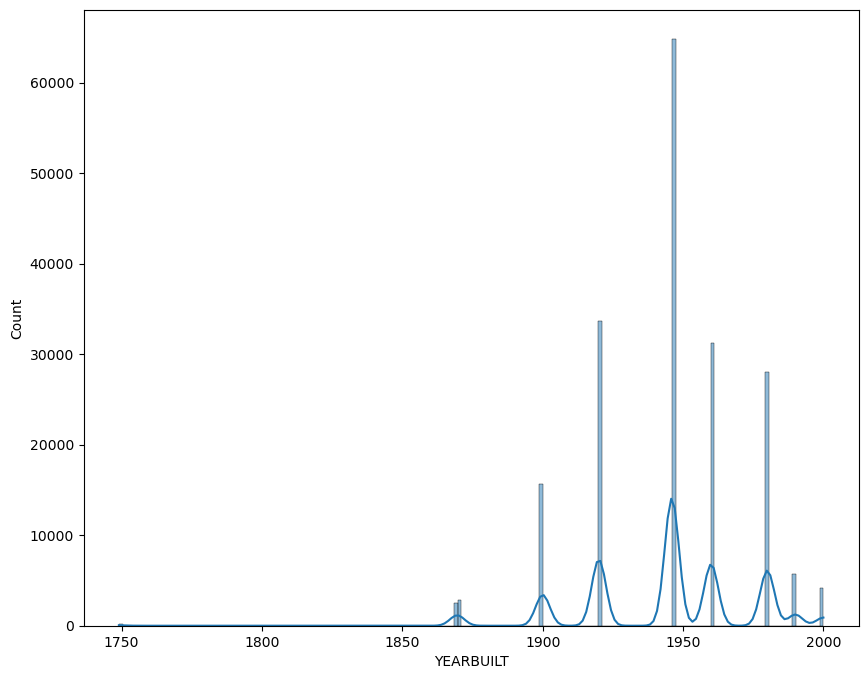

PAYMENT_METHOD is categorical.


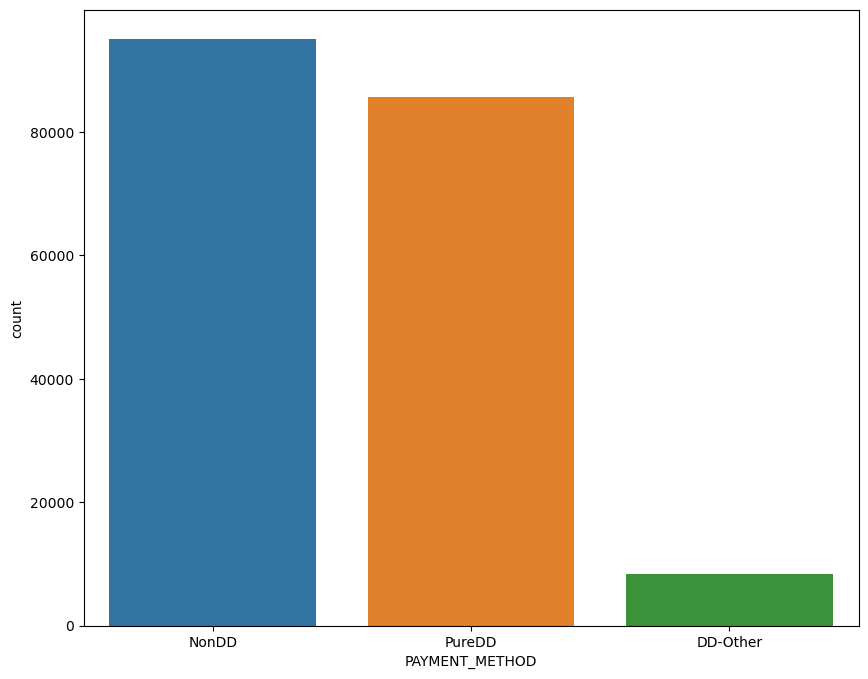

PAYMENT_FREQUENCY is binary.


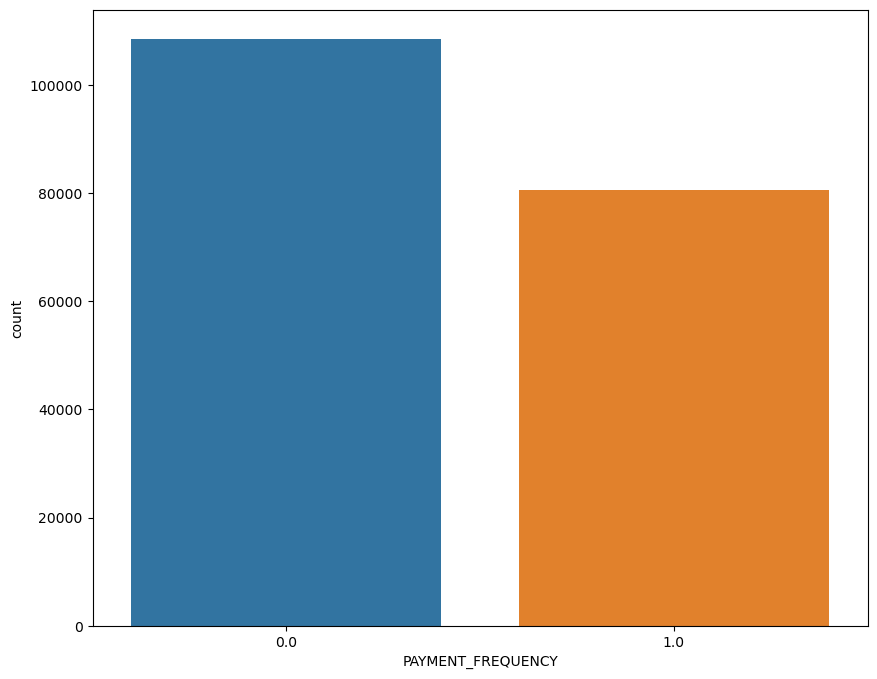

LEGAL_ADDON_PRE_REN is categorical.


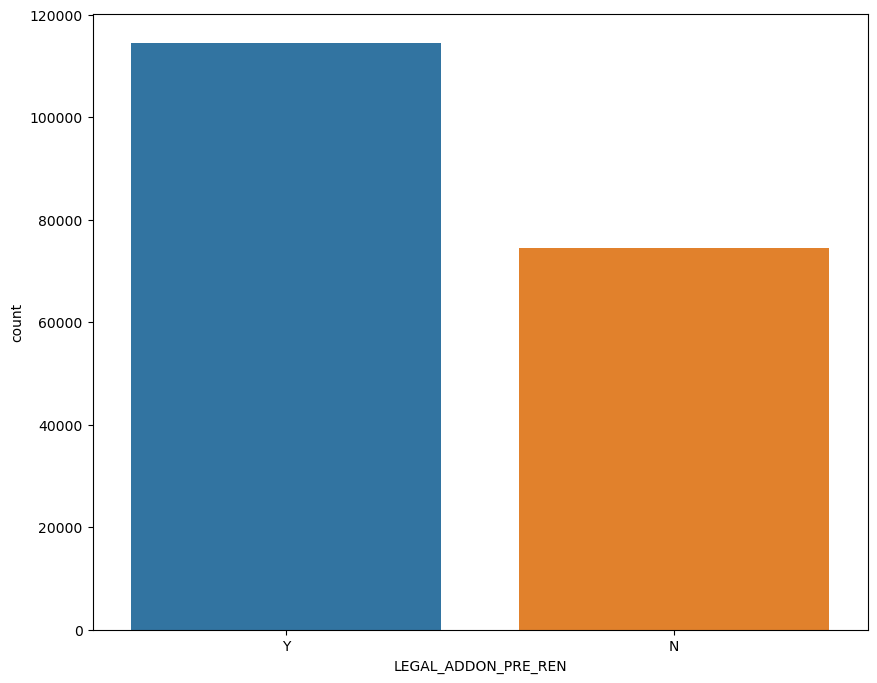

LEGAL_ADDON_POST_REN is categorical.


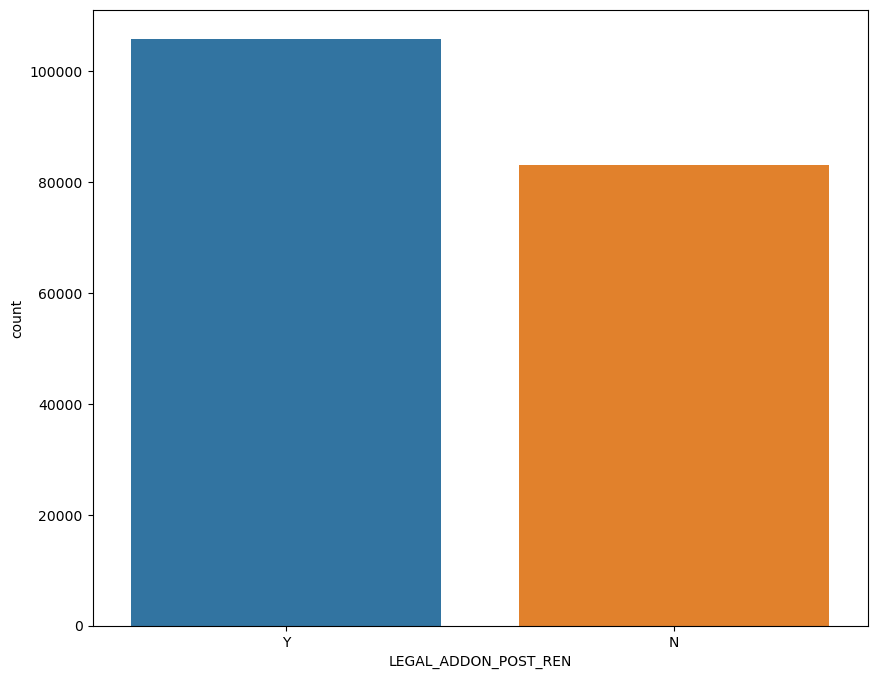

HOME_EM_ADDON_PRE_REN is categorical.


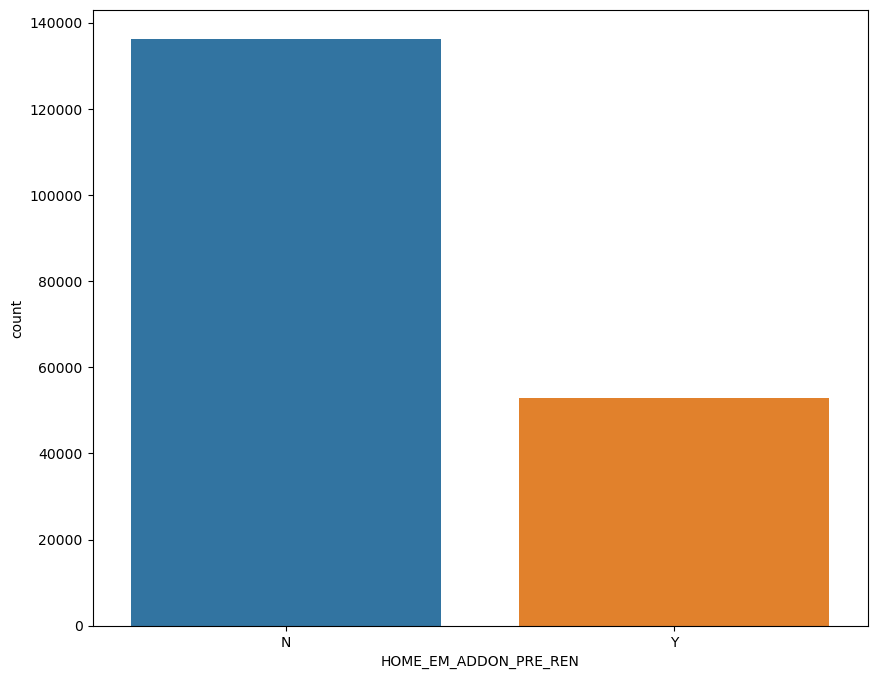

HOME_EM_ADDON_POST_REN is categorical.


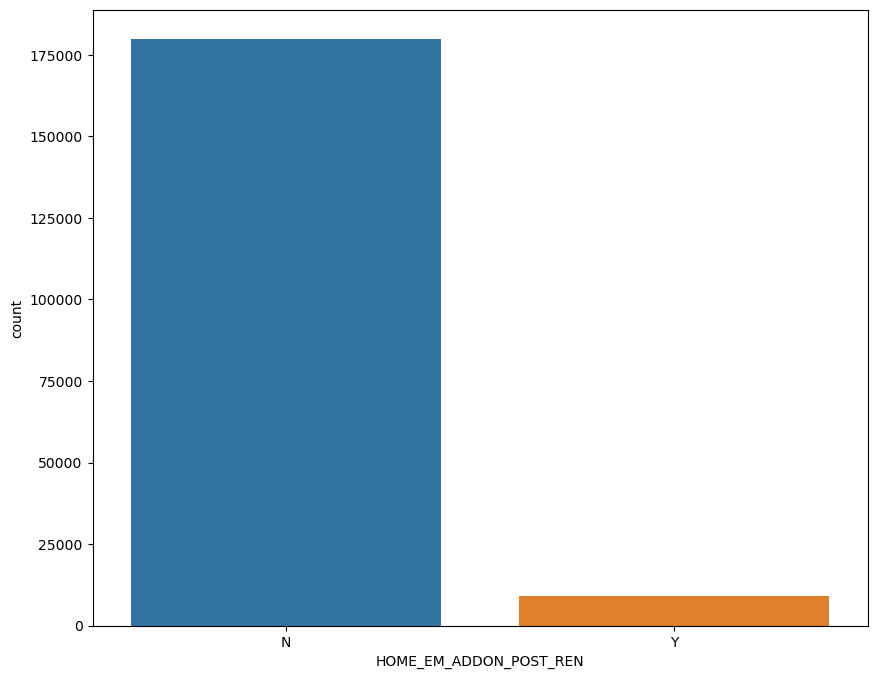

GARDEN_ADDON_PRE_REN is categorical.


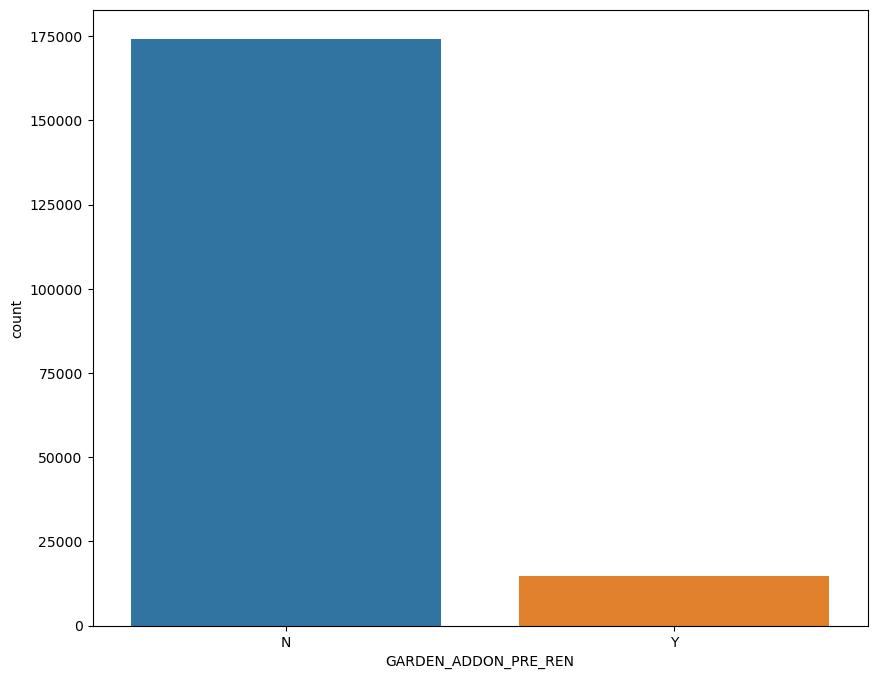

GARDEN_ADDON_POST_REN is categorical.


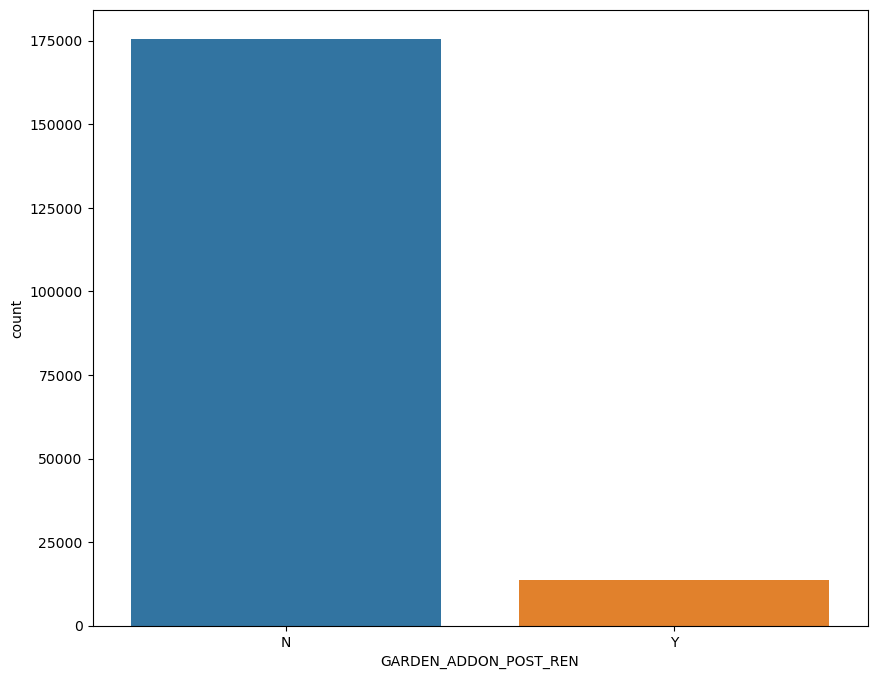

KEYCARE_ADDON_PRE_REN is categorical.


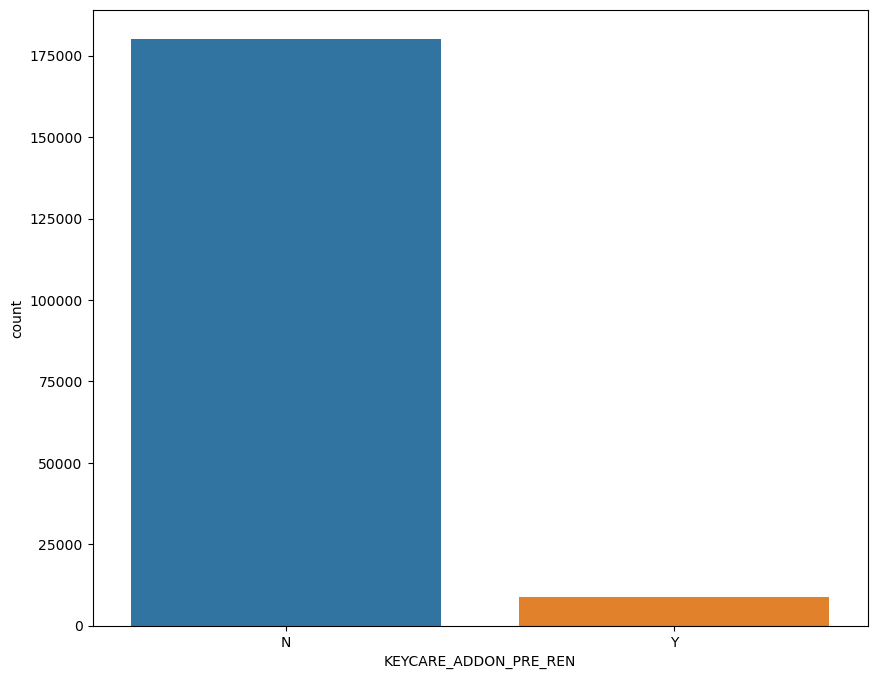

KEYCARE_ADDON_POST_REN is categorical.


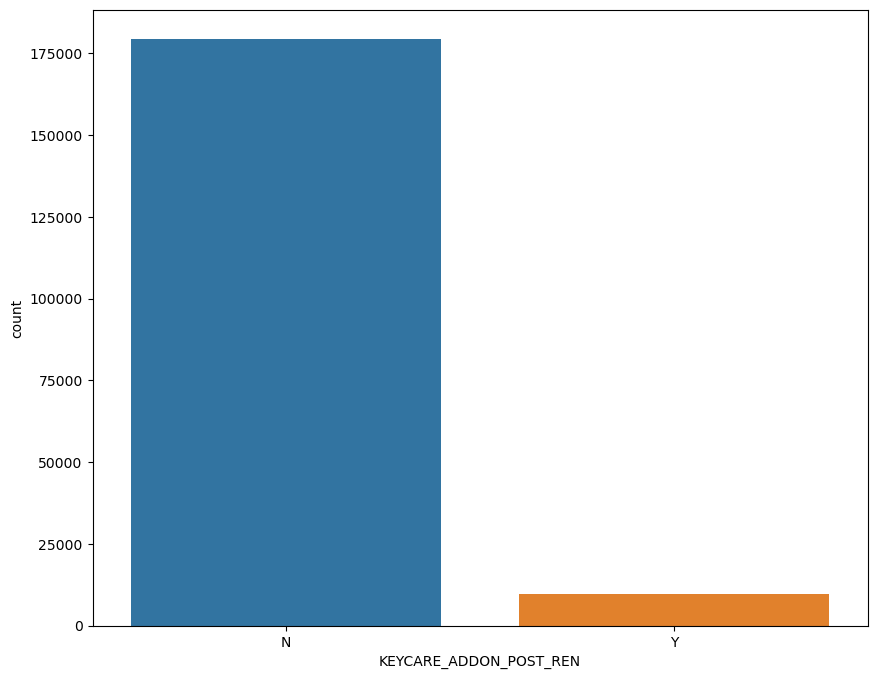

HP1_ADDON_PRE_REN is categorical.


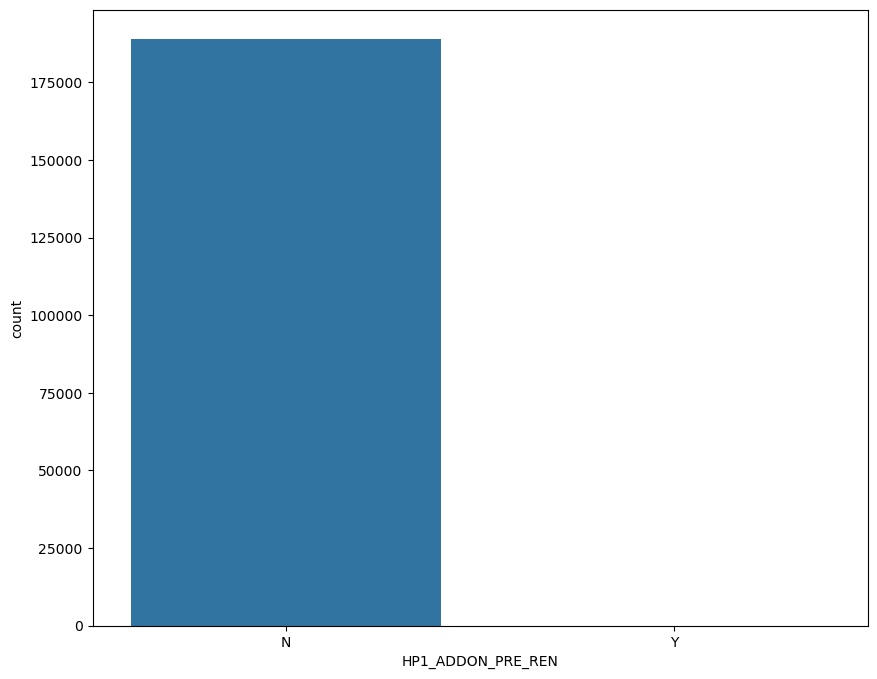

HP1_ADDON_POST_REN is categorical.


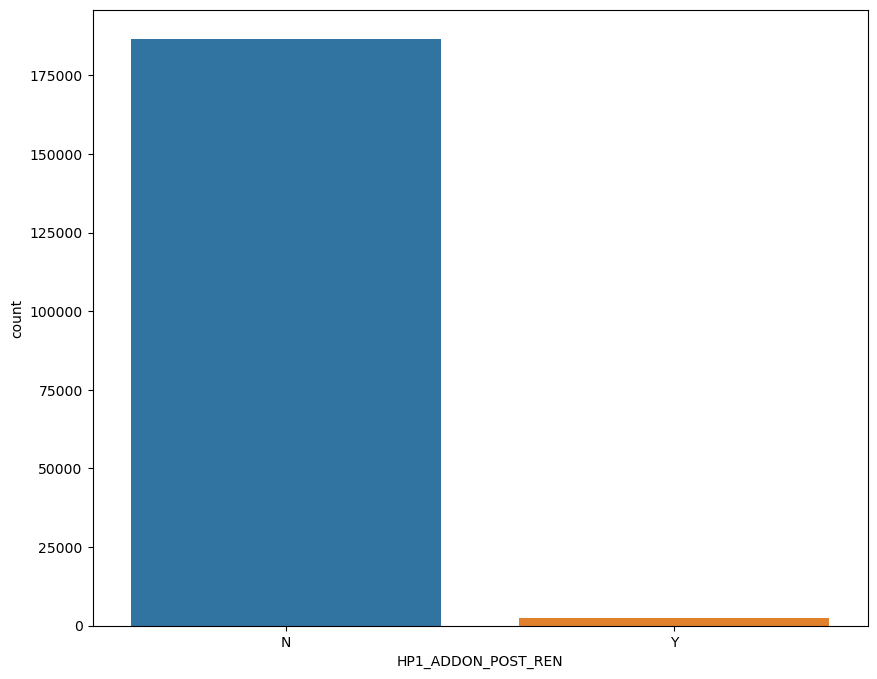

HP2_ADDON_PRE_REN is categorical.


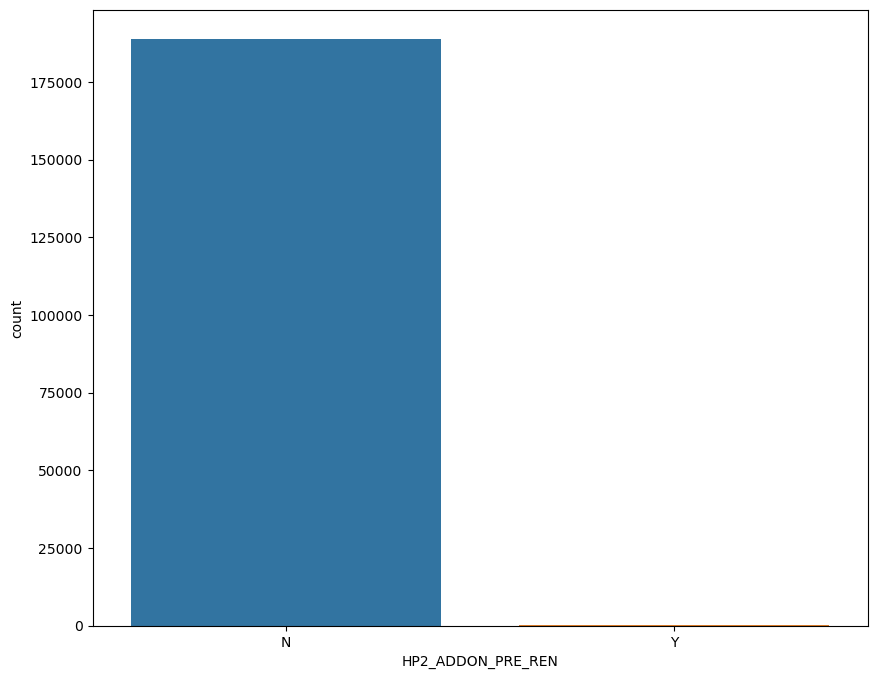

HP2_ADDON_POST_REN is categorical.


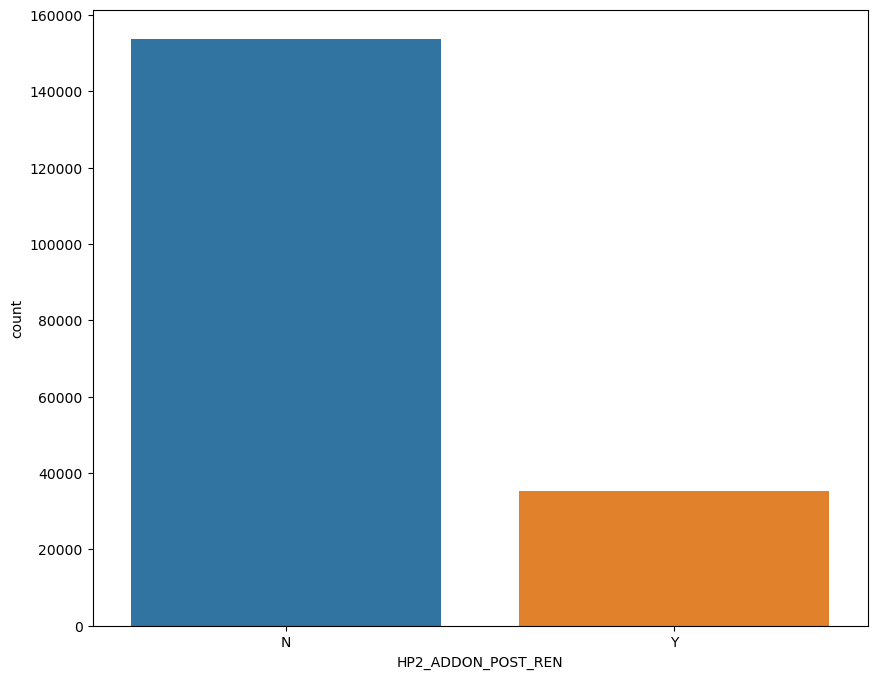

HP3_ADDON_PRE_REN is categorical.


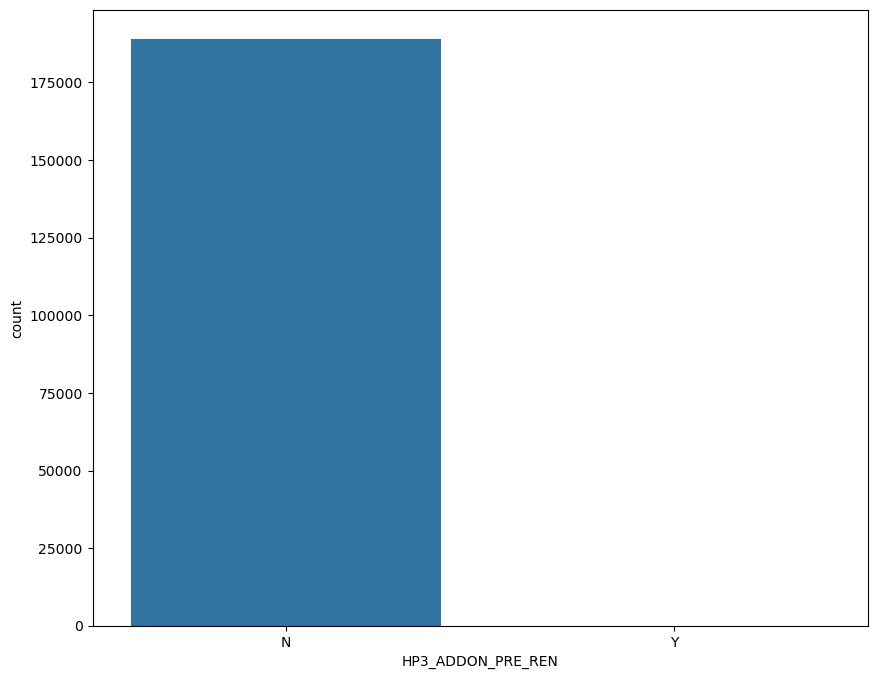

HP3_ADDON_POST_REN is categorical.


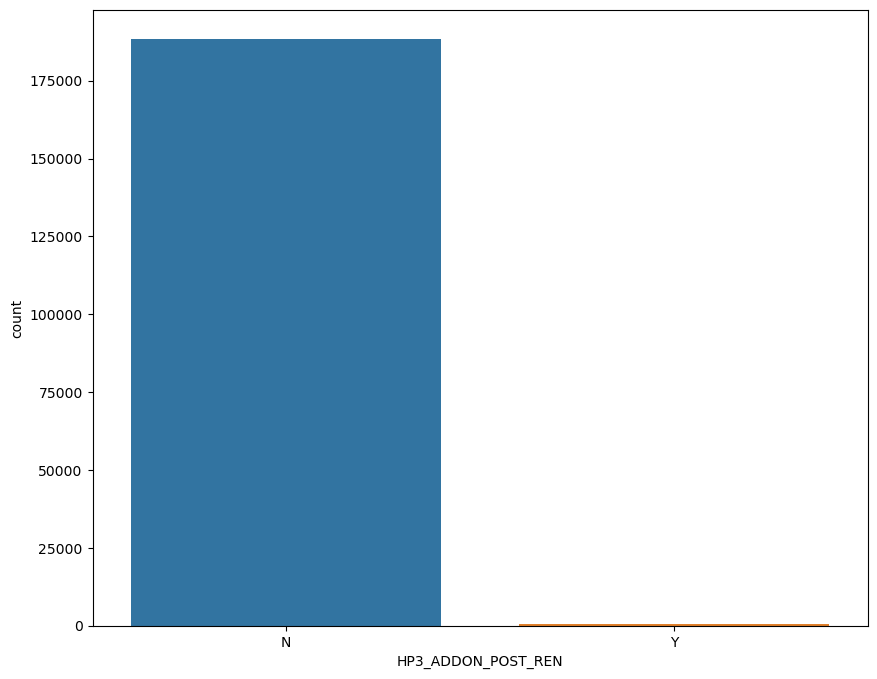

MTA_FLAG is categorical.


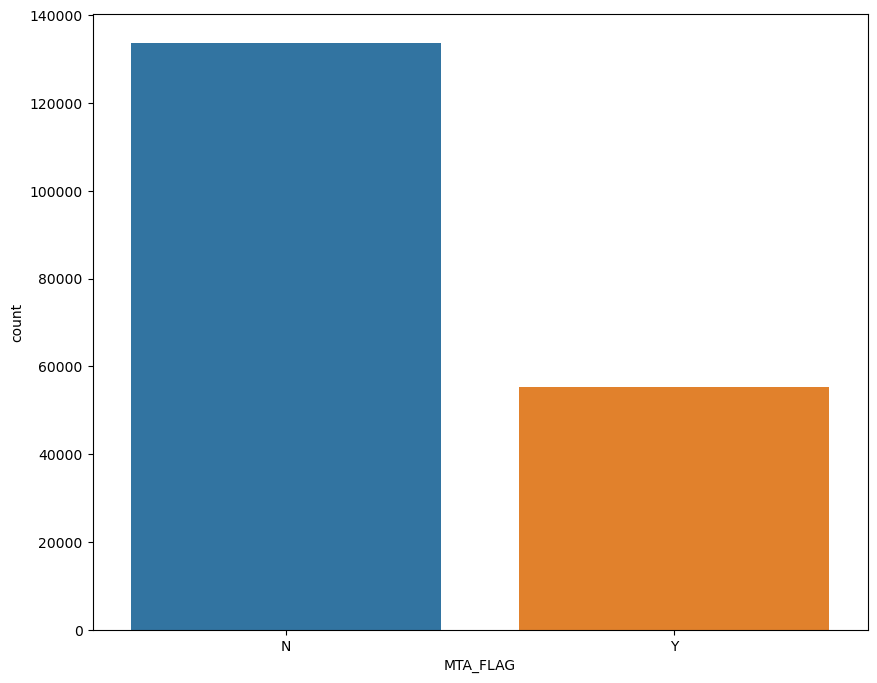

LAST_ANN_PREM_GROSS is continuous.


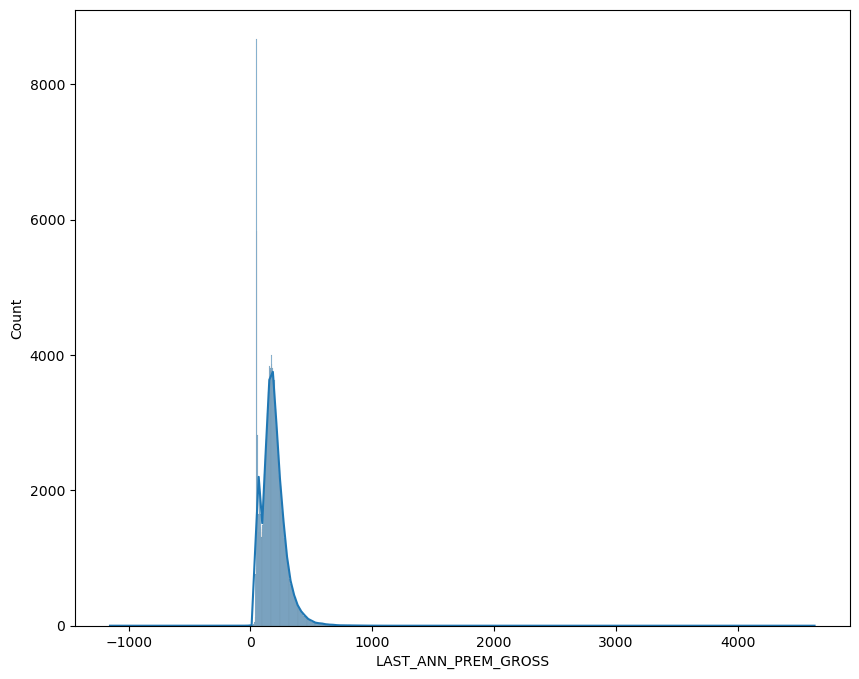

POL_STATUS is categorical.


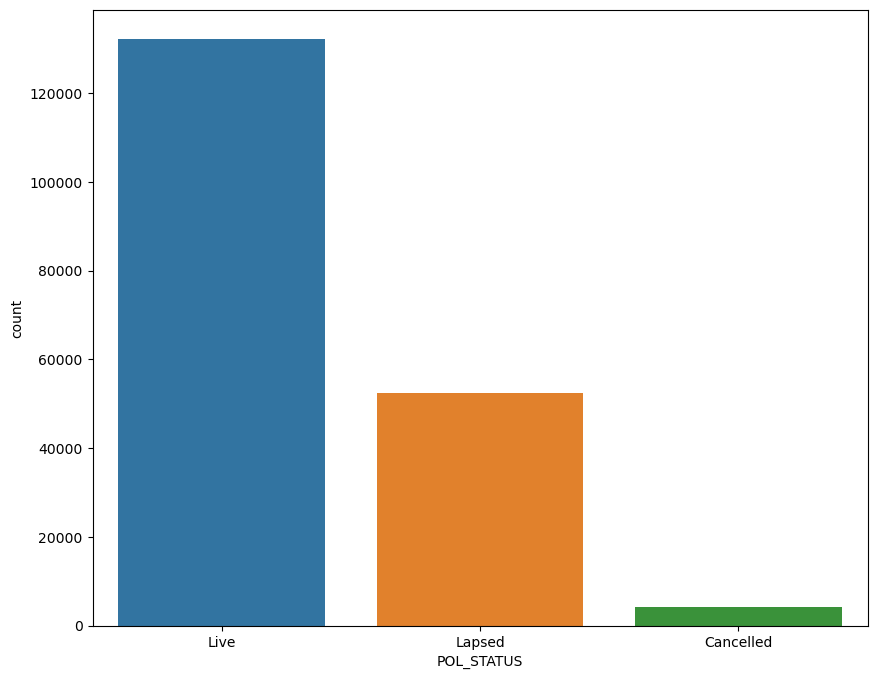

has_lapsed is binary.


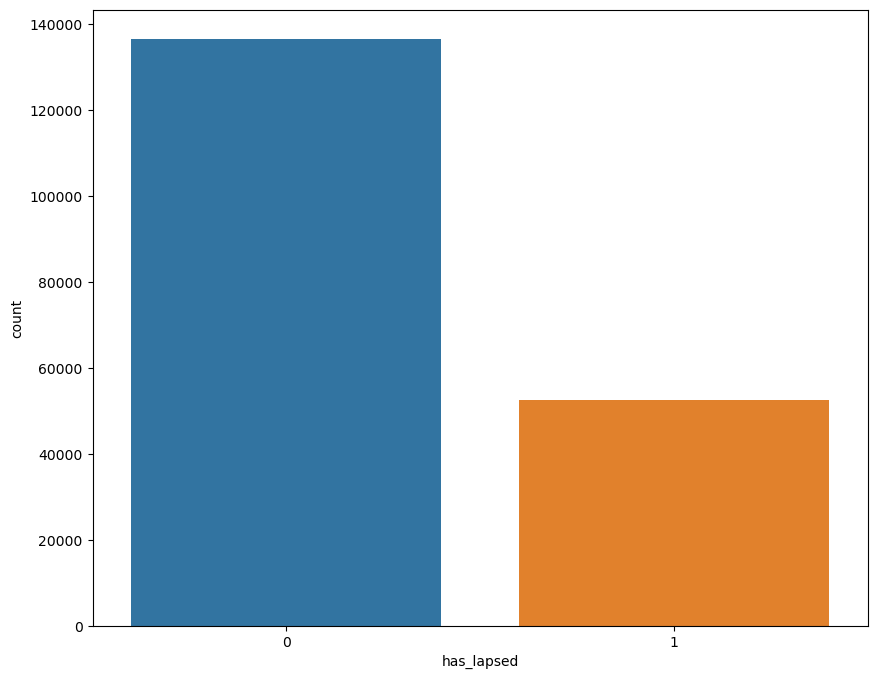

In [34]:
# Figure out data type of each feature
detect_datatype_and_plot(data_no_nulls)

points from above data visualisations, unique values and descriptive statistics:

 - SUM_INSURED_BUILDING has either 0 or 1000000.0. The feature "SUM_INSURED_BUILDINGS" refers to the maximum amount of coverage that the insurance policy provides for damage to the building itself. In other words, it is the maximum amount of money that the insurance company will pay out to repair or replace the building if it is damaged or destroyed. In the dataset, if all the values are either 0 or 100000, it is possible that the insurance policy only offers a binary choice between having no coverage for building damage (0) or having coverage up to a maximum of 100000. It is also possible that all the policyholders in the dataset have opted for the same coverage amount. The field could also just indicate that there is a maximum insurance payout for damage or not. Therefore ill make the max_building_coverage = Y/N
 
 
 - the sum insured contents is similar and will be mapped into 'None', '5000' and '>5000'

 - NCD granted are actually categorical columns (assumed ordinal due to the numbering). As is bedrooms
 
 - UNSPEC_HRP_PREM is unknown in the data dict so removal seems the best case of action as its not defined
 
 - roof construction can be put into 4 categories 0-5,6-10,11-15, >=15
 
 - spec item prem and spec sum insured are highly exponential (decaying) and so could be grouped by the quantiles
 
 - wall construction needs to be grouped as the distribution seems to be continuous but is heavily towards 15, it also has the same scale as the roof construction so using that bracket to group the feature makes sense as they become comparable
 - property type should be ordinal not continuous based on the distribution

In [35]:
# in light of above

def max_content_cov(value):
    
    if int(value) == 50000:
        return '50000'
    
    elif int(value) > 50000:
        return '>50000'
    
    else:
        return 'None'
    
    
def roof_converter(value):
    
    if int(value) < 6:
        return '0-5'
    
    elif int(value) < 11:
        return '6-10'
    
    elif int(value) < 15:
        return '11-15'
    
    else:
        return '>=15'
        

data_no_nulls['max_building_coverage'] = [1 if x > 0 else 0 for x in data_no_nulls['SUM_INSURED_BUILDINGS']]
data_no_nulls['max_contents_coverage'] = data_no_nulls['SUM_INSURED_CONTENTS'].apply(lambda x: max_content_cov(x))
data_no_nulls['roof_construction_cat'] = data_no_nulls['ROOF_CONSTRUCTION'].apply(lambda x: roof_converter(x))
data_no_nulls['special_item_premium_quantile_band'] = pd.cut(data_no_nulls['SPEC_ITEM_PREM'], bins=4, labels=['q1', 'q2', 'q3', 'q4'])
data_no_nulls['special_item_cover_quantile_band'] = pd.cut(data_no_nulls['SPEC_SUM_INSURED'], bins=4, labels=['q1', 'q2', 'q3', 'q4'])
data_no_nulls['wall_construction_cat'] = data_no_nulls['WALL_CONSTRUCTION'].apply(lambda x: roof_converter(x))


                                          
                                          

In [36]:
# each column is not going to be added to certain lists depending on the type of data.
# typically we see continuous, categorical_nominal , categorical_ordinal, boolean

target = 'has_lapsed'

continuous = ['RISK_RATED_AREA_B',  'RISK_RATED_AREA_C', 'LAST_ANN_PREM_GROSS']

cat_ordinal = ['NCD_GRANTED_YEARS_B', 'NCD_GRANTED_YEARS_C', 'BEDROOMS', 'LISTED', 'YEARBUILT']

cat_nominal = ['P1_EMP_STATUS', 'P1_MAR_STATUS', 'special_item_premium_quantile_band',
              'special_item_cover_quantile_band', 'wall_construction_cat', 'roof_construction_cat', 'OCC_STATUS',
              'PROP_TYPE','OWNERSHIP_TYPE']

boolean = ['CLAIM3YEARS', 'BUS_USE', 'AD_BUILDINGS', 'AD_CONTENTS', 'CONTENTS_COVER', 'BUILDINGS_COVER',
          'P1_SEX', 'P1_POLICY_REFUSED', 'max_building_coverage', 'max_contents_coverage', 'APPR_ALARM', 'APPR_LOCKS',
          'FLOODING', 'NEIGH_WATCH',  'PAYING_GUESTS', 'SAFE_INSTALLED',
             'SEC_DISC_REQ',
             'SUBSIDENCE',
             'PAYMENT_FREQUENCY',
             'LEGAL_ADDON_PRE_REN',
             'LEGAL_ADDON_POST_REN',
             'HOME_EM_ADDON_PRE_REN',
             'HOME_EM_ADDON_POST_REN',
             'GARDEN_ADDON_PRE_REN',
             'GARDEN_ADDON_POST_REN',
             'KEYCARE_ADDON_PRE_REN',
             'KEYCARE_ADDON_POST_REN',
             'HP1_ADDON_PRE_REN',
             'HP1_ADDON_POST_REN',
             'HP2_ADDON_PRE_REN',
             'HP2_ADDON_POST_REN',
             'HP3_ADDON_PRE_REN',
             'HP3_ADDON_POST_REN',
             'MTA_FLAG']



The features have been categorised into thieir types. Now lets see the effect of each of them on the tsrget variable (has_lapsed)

**Continuous**

KW statistic is 3851231685.00, with p-value of 0.00


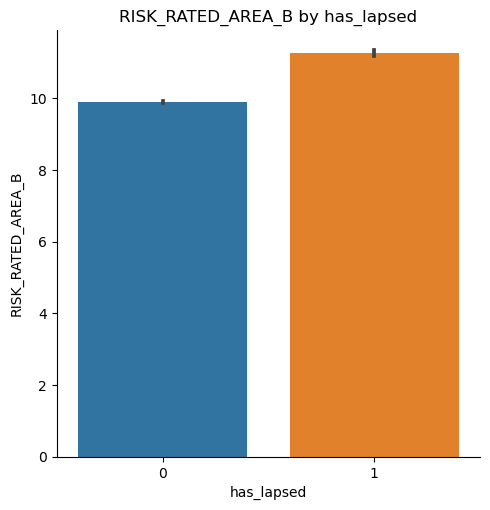

KW statistic is 3868778626.00, with p-value of 0.00


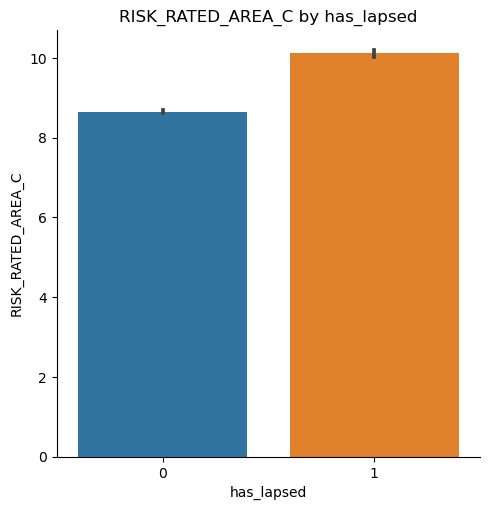

KW statistic is 3874326718.50, with p-value of 0.00


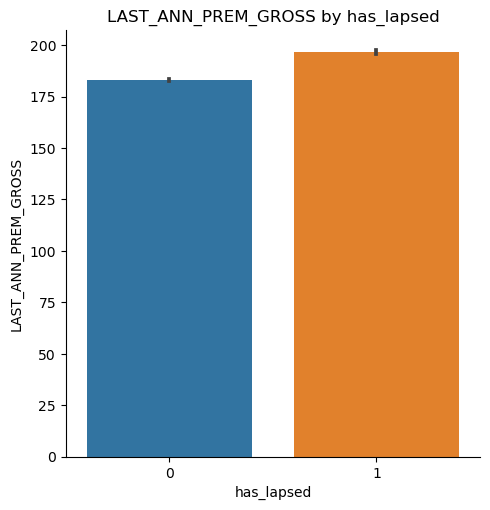

KW statistic is 3585782870.00, with p-value of 0.92


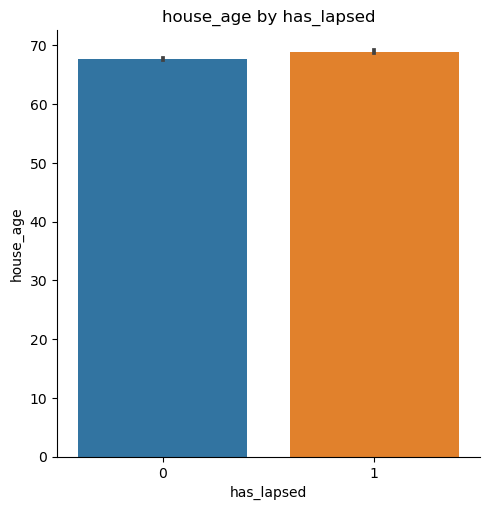

KW statistic is 2861547177.00, with p-value of 0.00


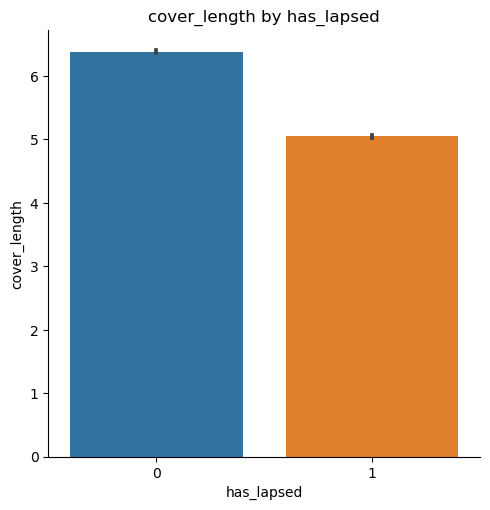

In [514]:
for cont in continuous:
    continuous_vs_categorical(data_no_nulls , cont, target, distribution = 'non-parametric')

Each of these has a significant t-statistic with the target variable which would suggest they are worth keeping in a model

**catgegorical ordinal**

Chi-squared test statistic: 3336.24
P-value: 0.00
Degrees of freedom: 9
Cramer's V statistic: 0.13


<Figure size 2000x2000 with 0 Axes>

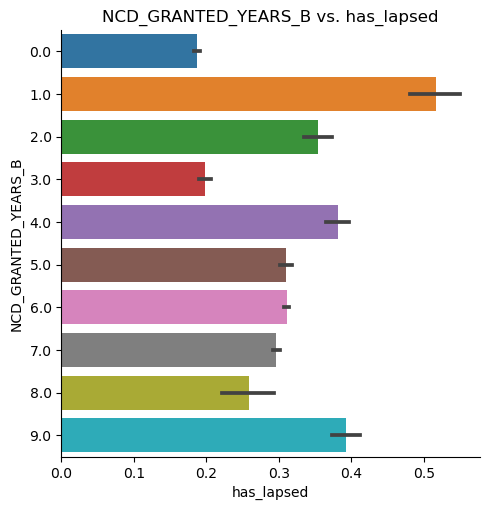

Chi-squared test statistic: 1069.06
P-value: 0.00
Degrees of freedom: 9
Cramer's V statistic: 0.08


<Figure size 2000x2000 with 0 Axes>

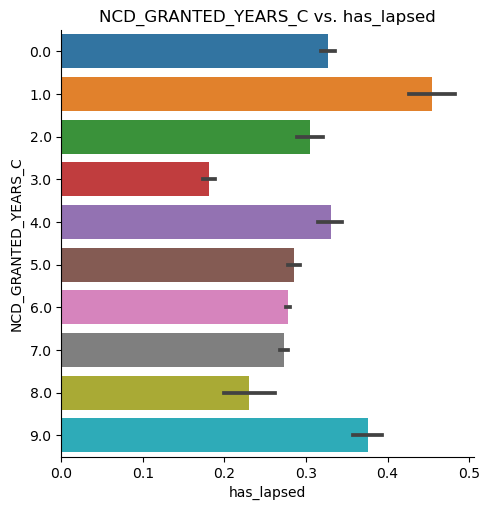

Chi-squared test statistic: 1191.58
P-value: 0.00
Degrees of freedom: 6
Cramer's V statistic: 0.08


<Figure size 2000x2000 with 0 Axes>

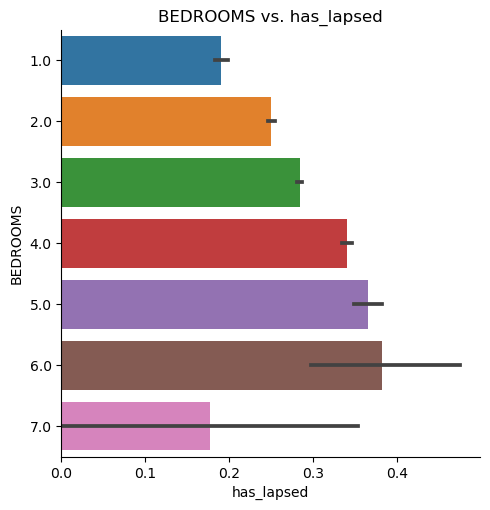

Chi-squared test statistic: 3.08
P-value: 0.54
Degrees of freedom: 4
Cramer's V statistic: 0.00


<Figure size 2000x2000 with 0 Axes>

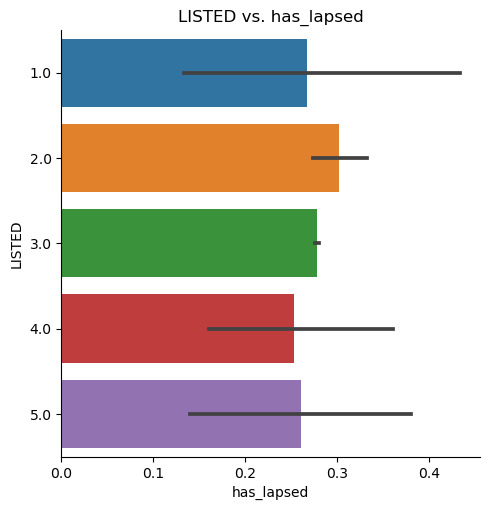

Chi-squared test statistic: 2220.72
P-value: 0.00
Degrees of freedom: 16
Cramer's V statistic: 0.11


<Figure size 2000x2000 with 0 Axes>

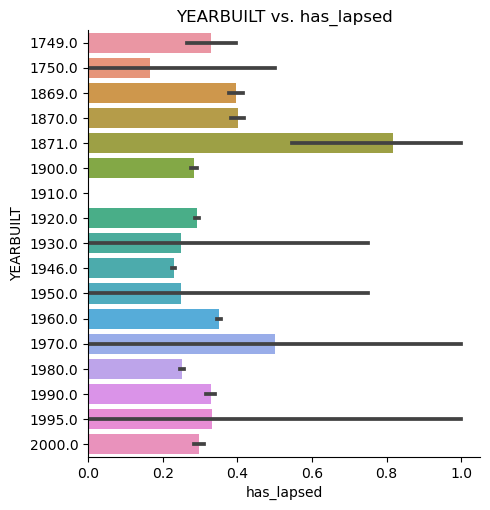

In [38]:
for cat in cat_ordinal:
    
    discrete_comparison(data_no_nulls , cat, target, plot_type= 'bar');

for all ordinal values (except 'LISTED') the data show statistical significance between the expected values and the observed values in the chi squared tests. The data show very week Cramers V scores across the board but I'm going to keep the ordinal values becuase of thier extremely high test statistics. 

The column LISTED is going to be removed from modelling becuase the bar chart shows very limited discrepencies between types of listings and the chi squared statistic lead to a non significant p-value.

The year built column also has a significant effect on lapsing, but it makes more sense to use a house age column for new predictions in modelling.

In [39]:
data_no_nulls.drop(['LISTED'], inplace = True, axis = 'columns')

The house age and the cover_length could be features to look at in a model.

In [113]:
data_no_nulls["house_age"] = 2013 - data_no_nulls["YEARBUILT"]
data_no_nulls["cover_length"] = 2013 - pd.to_datetime(data_no_nulls["COVER_START"]).dt.year

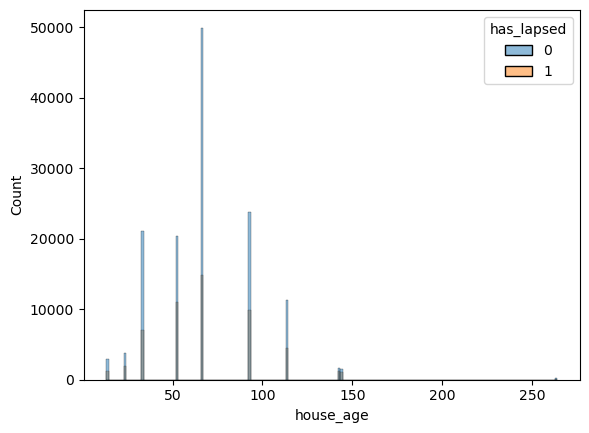

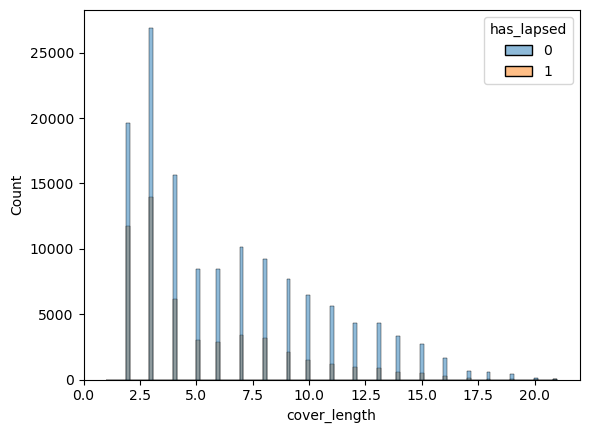

In [116]:
sns.histplot(data = data_no_nulls, x='house_age', hue = 'has_lapsed');

plt.figure()
sns.histplot(data = data_no_nulls, x='cover_length', hue = 'has_lapsed');

T-test statistic is 8.17, with p-value of 0.00


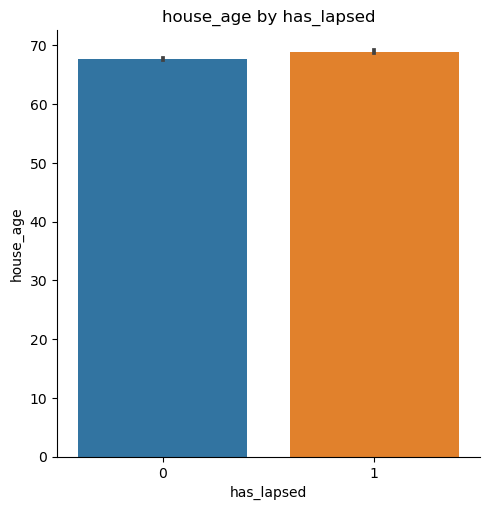

In [117]:
continuous_vs_categorical(data_no_nulls , 'house_age', target, plot_kind = 'bar')

Interesting to see a significant difference for house age even though the distributions look similar and the average has_lapsed is marginally different

T-test statistic is -67.39, with p-value of 0.00


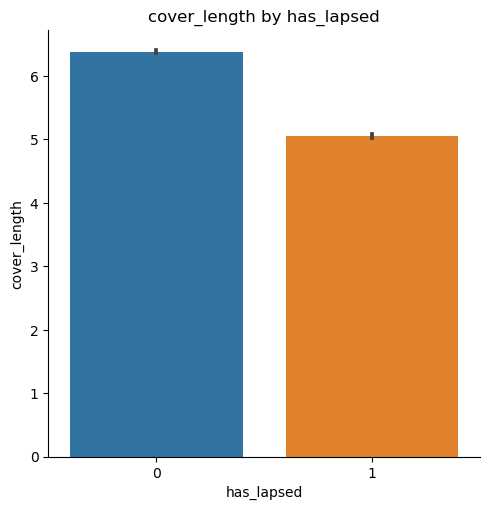

In [349]:
continuous_vs_categorical(data_no_nulls ,continuous_col= 'cover_length', categorical_col = target,plot_kind = 'bar')

**categorical nominal**

Chi-squared test statistic: 189.34
P-value: 0.00
Degrees of freedom: 10
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

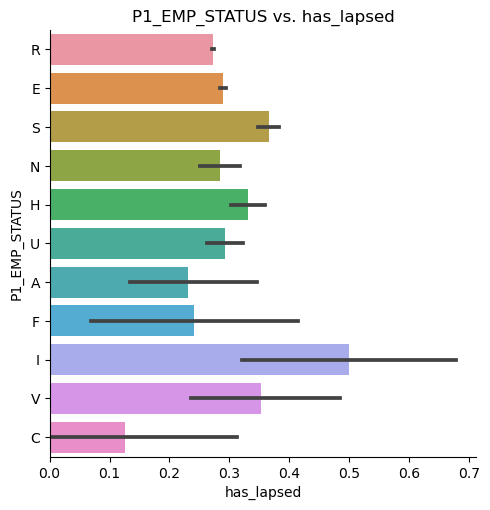

Chi-squared test statistic: 6419.25
P-value: 0.00
Degrees of freedom: 9
Cramer's V statistic: 0.18


<Figure size 2000x2000 with 0 Axes>

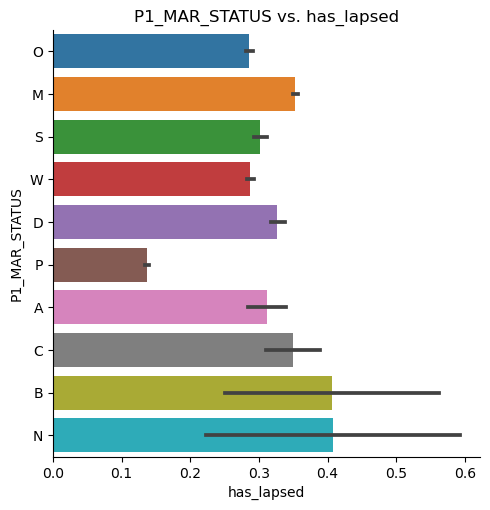

Chi-squared test statistic: 22.54
P-value: 0.00
Degrees of freedom: 2
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

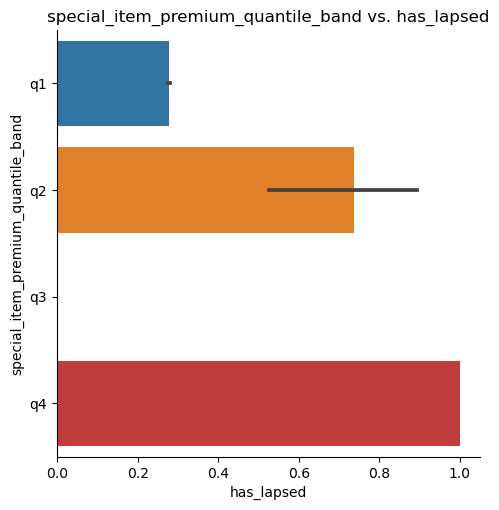

Chi-squared test statistic: 73.07
P-value: 0.00
Degrees of freedom: 3
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

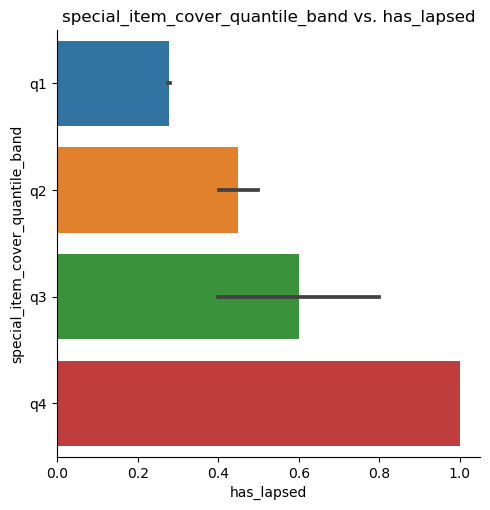

Chi-squared test statistic: 20.72
P-value: 0.00
Degrees of freedom: 3
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

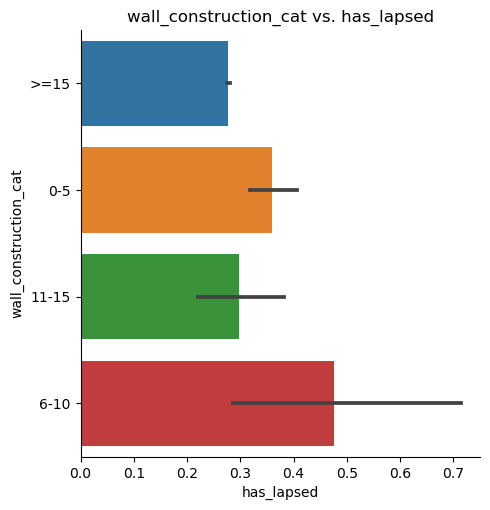

Chi-squared test statistic: 27.33
P-value: 0.00
Degrees of freedom: 3
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

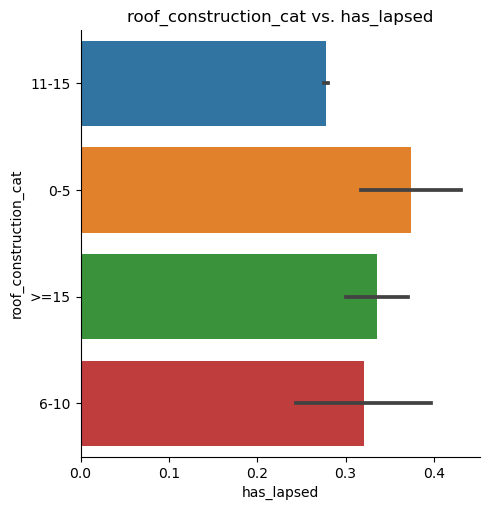

Chi-squared test statistic: 94.52
P-value: 0.00
Degrees of freedom: 6
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

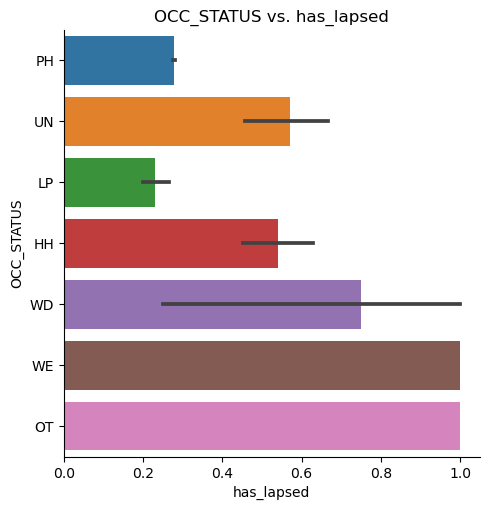

Chi-squared test statistic: 1958.58
P-value: 0.00
Degrees of freedom: 35
Cramer's V statistic: 0.10


<Figure size 2000x2000 with 0 Axes>

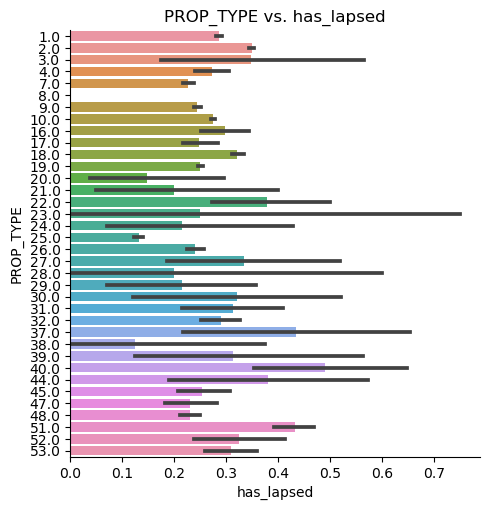

Chi-squared test statistic: 384.16
P-value: 0.00
Degrees of freedom: 13
Cramer's V statistic: 0.05


<Figure size 2000x2000 with 0 Axes>

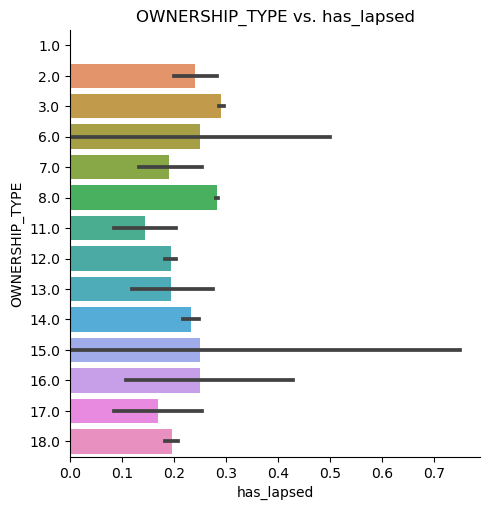

In [44]:
for cat in cat_nominal:
    
    discrete_comparison(data_no_nulls , cat, target, plot_type= 'bar');

All of these relationships appear to be significant but not with a strong association using cramers V. We can keep these features for now and look to remove them in modelling to see if there is a noticeable drop in performance.

Marital status seems to have the largest effect on lapsing policy, specifically P status is much lower than the others.

**Boolean**

Chi-squared test statistic: 29.75
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

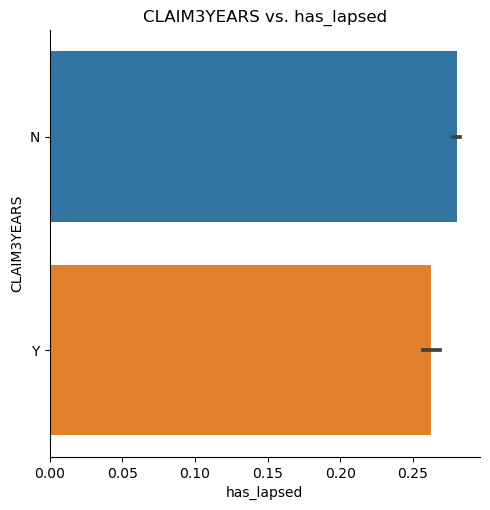

Chi-squared test statistic: 149.84
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

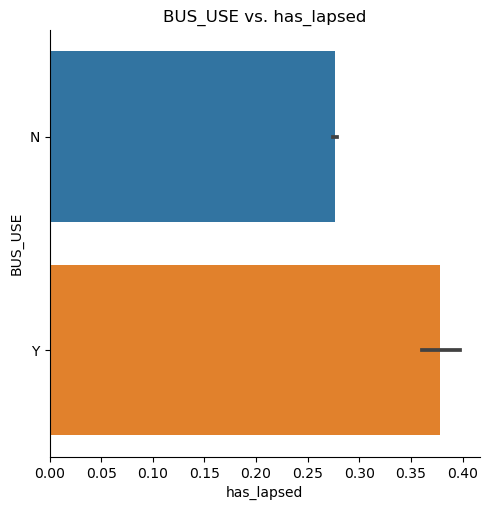

Chi-squared test statistic: 2939.55
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.12


<Figure size 2000x2000 with 0 Axes>

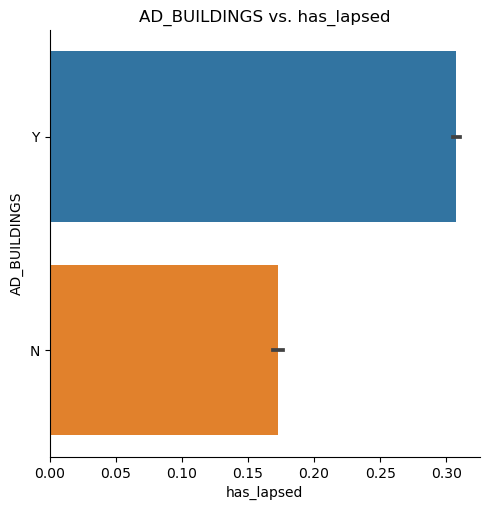

Chi-squared test statistic: 11.72
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

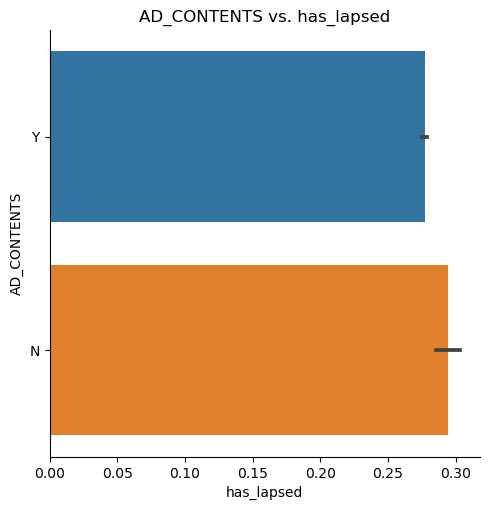

Chi-squared test statistic: 2939.55
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.12


<Figure size 2000x2000 with 0 Axes>

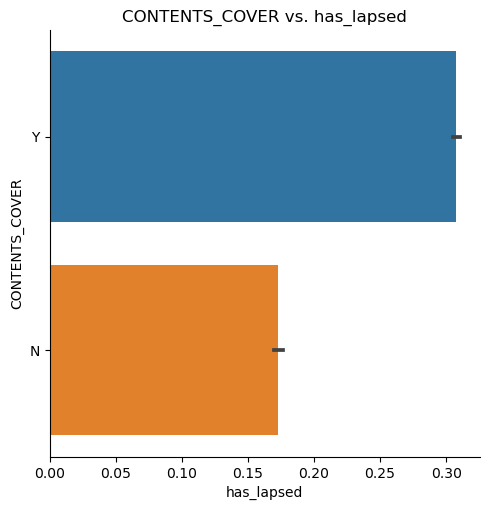

Chi-squared test statistic: 11.72
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

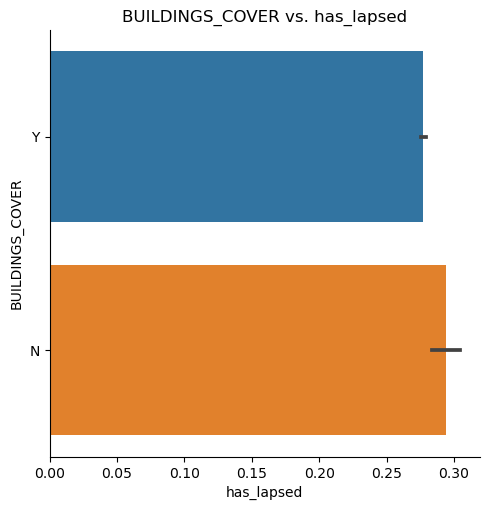

Chi-squared test statistic: 682.19
P-value: 0.00
Degrees of freedom: 2
Cramer's V statistic: 0.06


<Figure size 2000x2000 with 0 Axes>

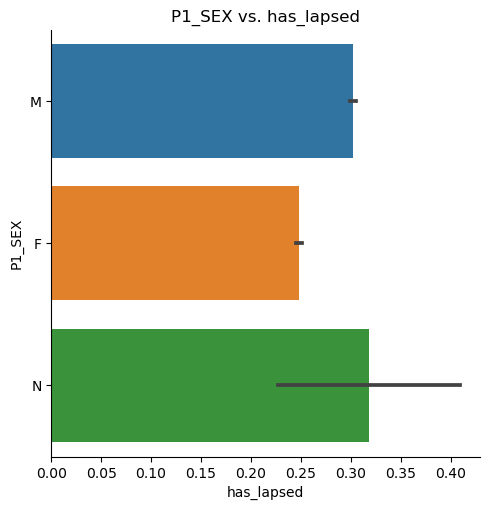

Chi-squared test statistic: 38.25
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

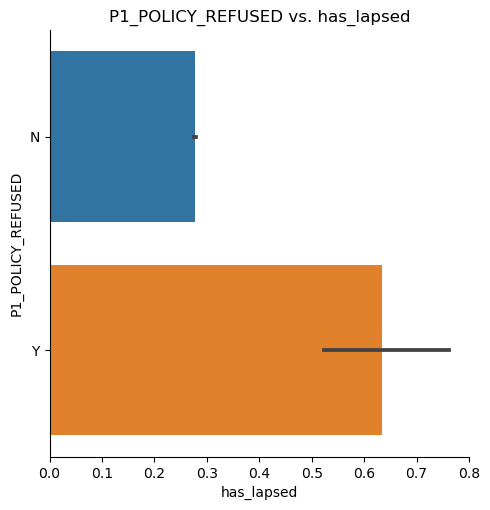

Chi-squared test statistic: 2795.73
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.12


<Figure size 2000x2000 with 0 Axes>

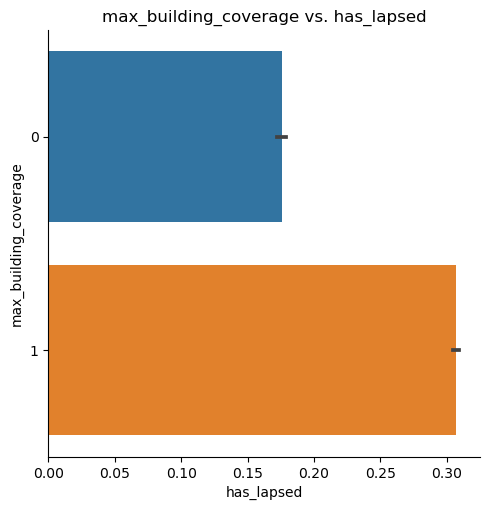

Chi-squared test statistic: 137.09
P-value: 0.00
Degrees of freedom: 2
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

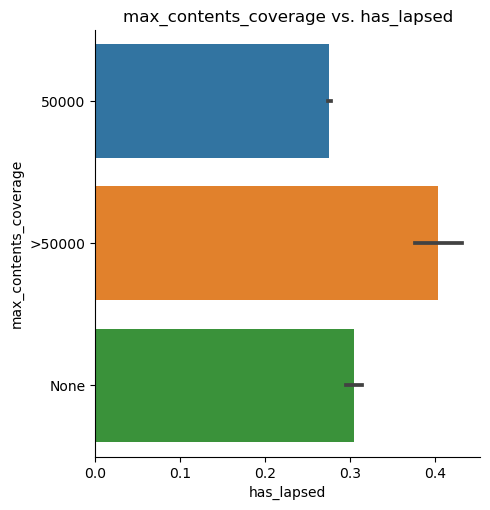

Chi-squared test statistic: 9.75
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

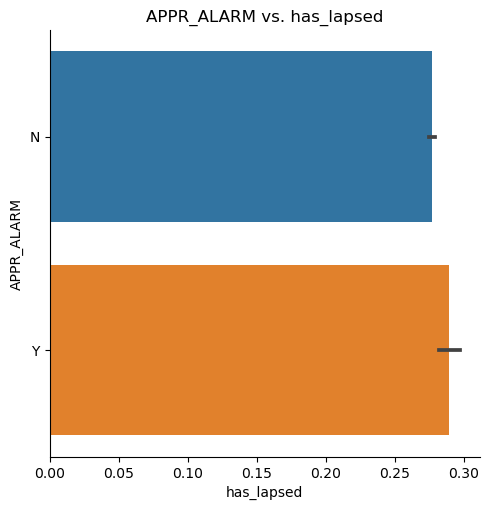

Chi-squared test statistic: 114.19
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

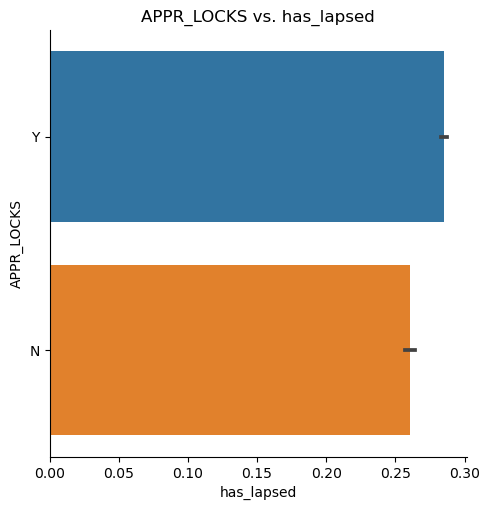

Chi-squared test statistic: 114.68
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

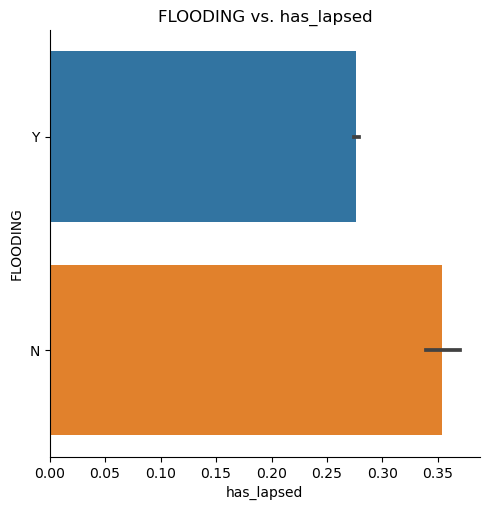

Chi-squared test statistic: 12.53
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

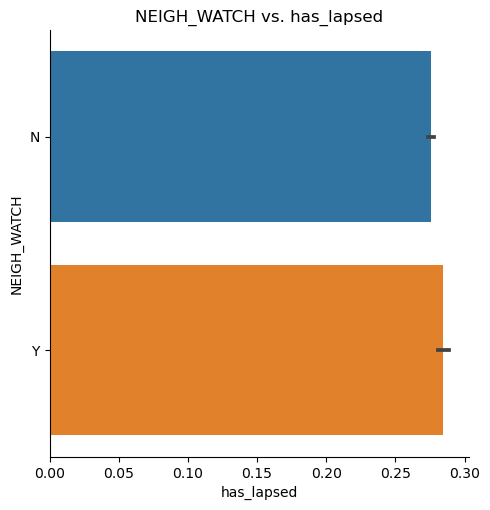

Chi-squared test statistic: 3.45
P-value: 0.06
Degrees of freedom: 1
Cramer's V statistic: 0.00


<Figure size 2000x2000 with 0 Axes>

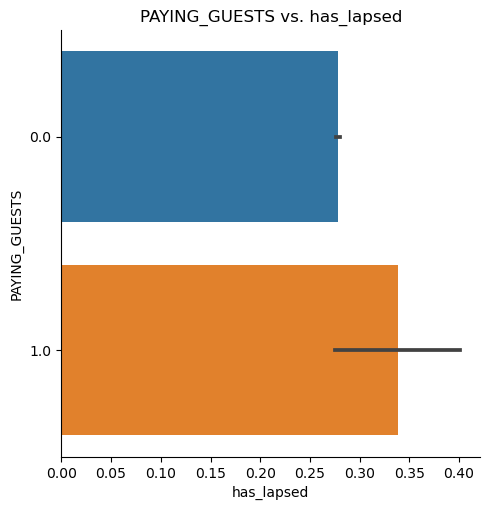

Chi-squared test statistic: 133.41
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

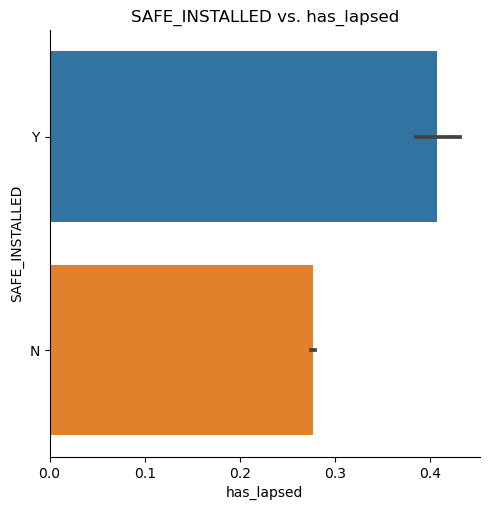

Chi-squared test statistic: 79.19
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

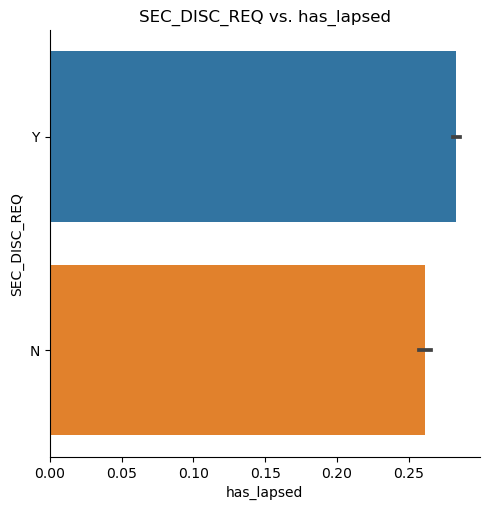

Chi-squared test statistic: 18.79
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

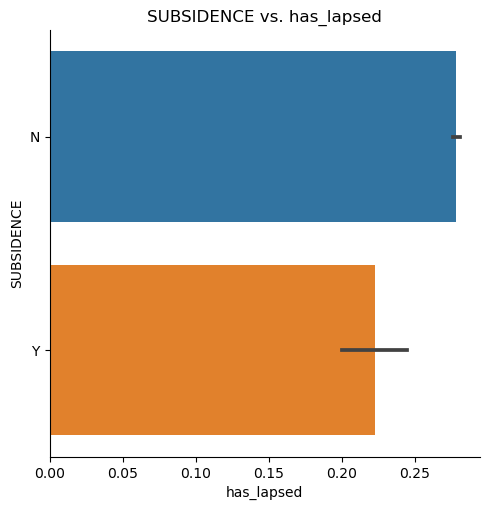

Chi-squared test statistic: 3243.70
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.13


<Figure size 2000x2000 with 0 Axes>

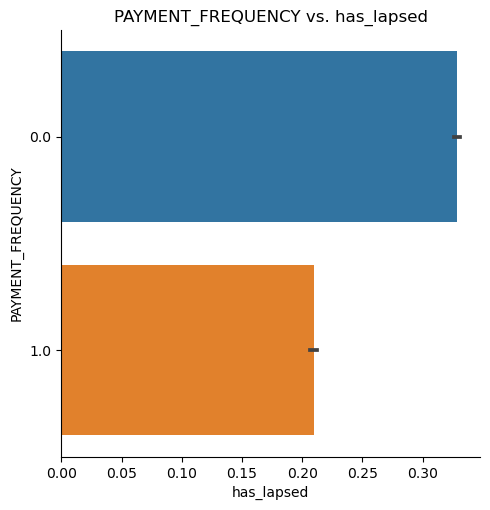

Chi-squared test statistic: 76.78
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.02


<Figure size 2000x2000 with 0 Axes>

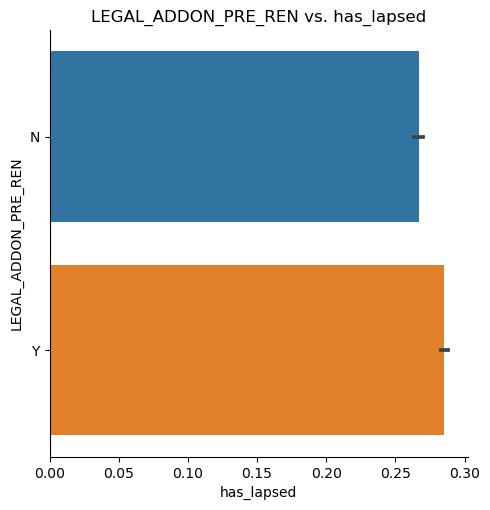

Chi-squared test statistic: 1685.21
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.09


<Figure size 2000x2000 with 0 Axes>

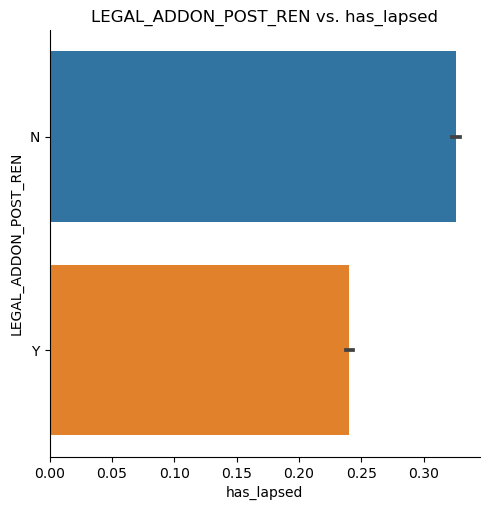

Chi-squared test statistic: 35.49
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

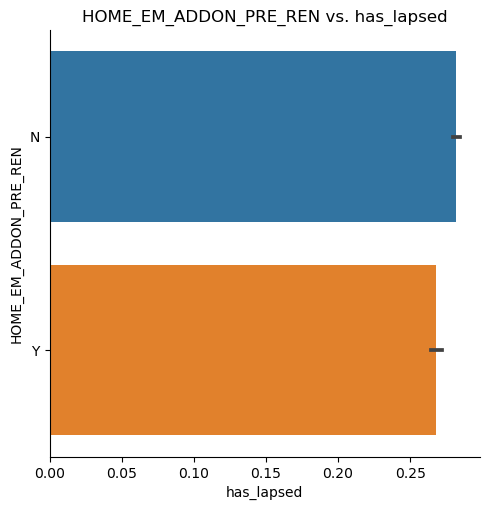

Chi-squared test statistic: 1.83
P-value: 0.18
Degrees of freedom: 1
Cramer's V statistic: 0.00


<Figure size 2000x2000 with 0 Axes>

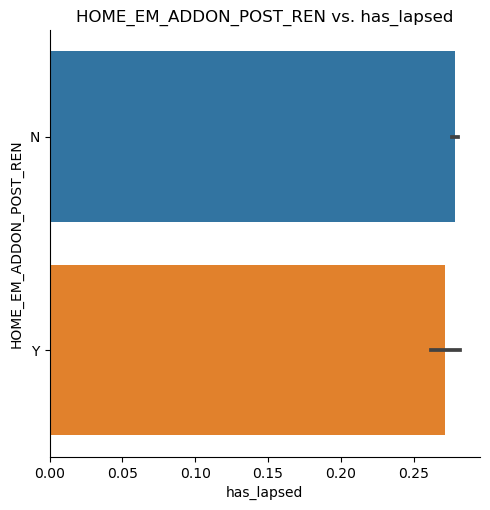

Chi-squared test statistic: 194.37
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

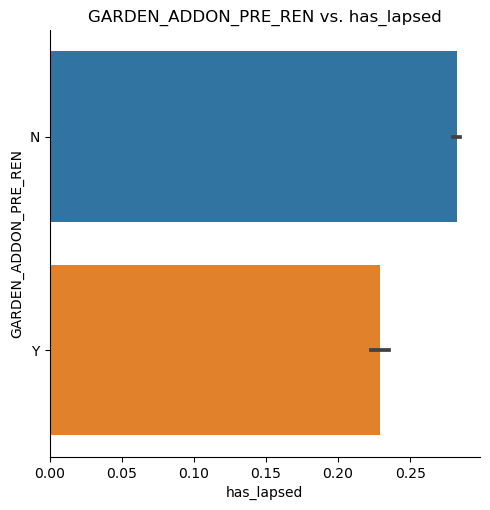

Chi-squared test statistic: 674.36
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.06


<Figure size 2000x2000 with 0 Axes>

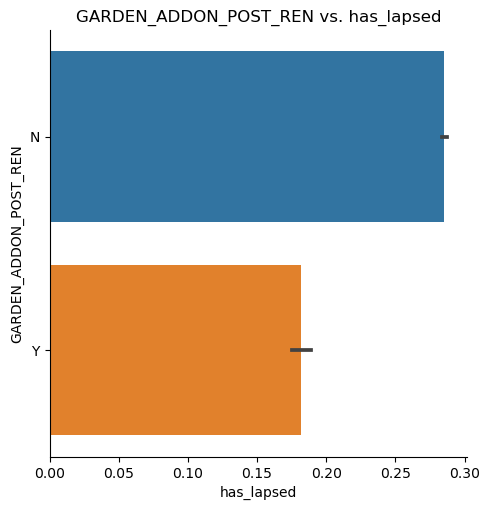

Chi-squared test statistic: 9.98
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

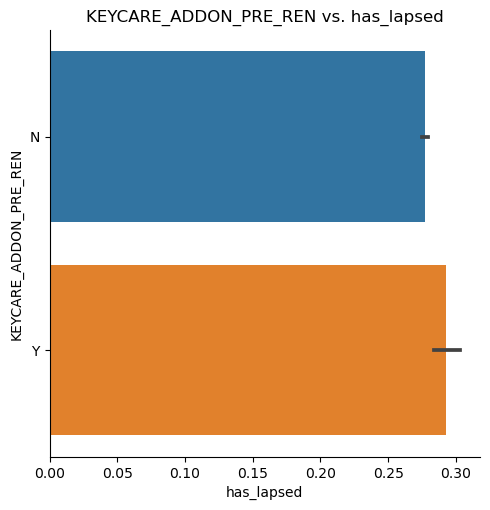

Chi-squared test statistic: 201.61
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

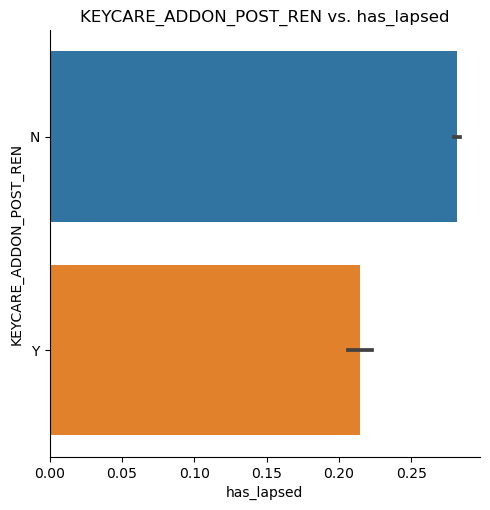

Chi-squared test statistic: 4.23
P-value: 0.04
Degrees of freedom: 1
Cramer's V statistic: 0.00


<Figure size 2000x2000 with 0 Axes>

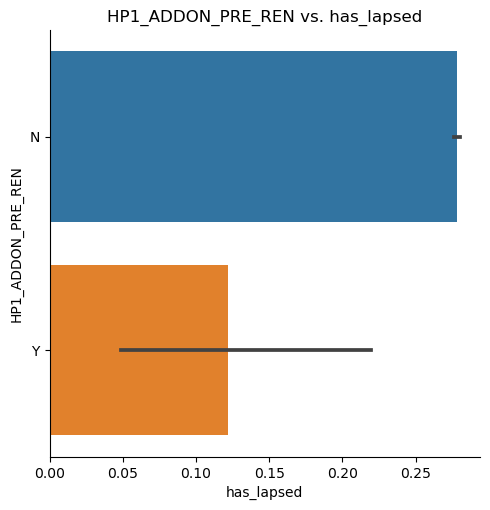

Chi-squared test statistic: 392.89
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.05


<Figure size 2000x2000 with 0 Axes>

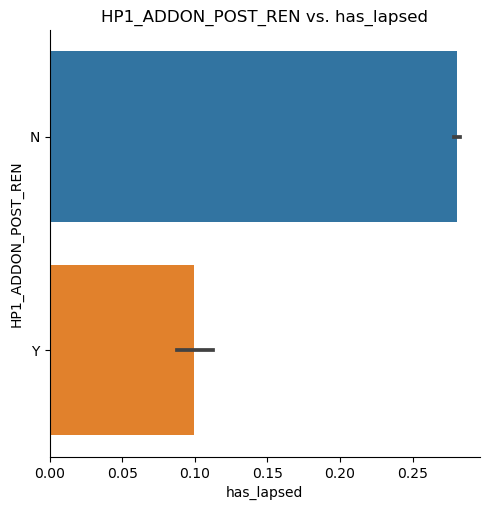

Chi-squared test statistic: 5.98
P-value: 0.01
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

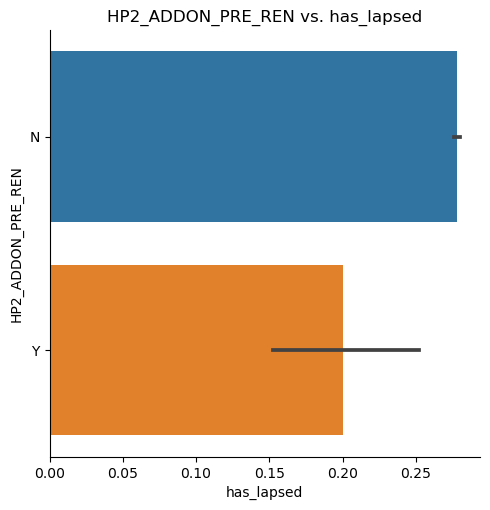

Chi-squared test statistic: 773.49
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.06


<Figure size 2000x2000 with 0 Axes>

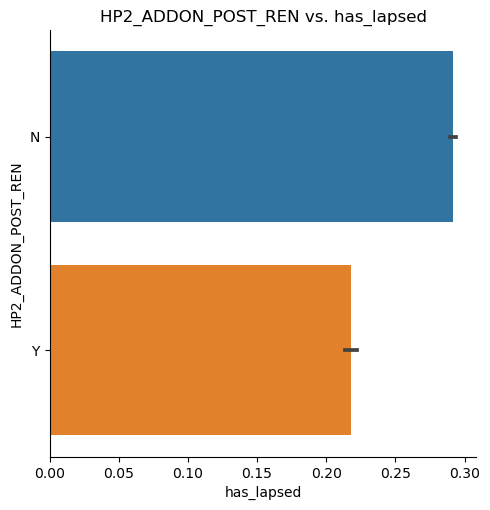

Chi-squared test statistic: 1.18
P-value: 0.28
Degrees of freedom: 1
Cramer's V statistic: 0.00


<Figure size 2000x2000 with 0 Axes>

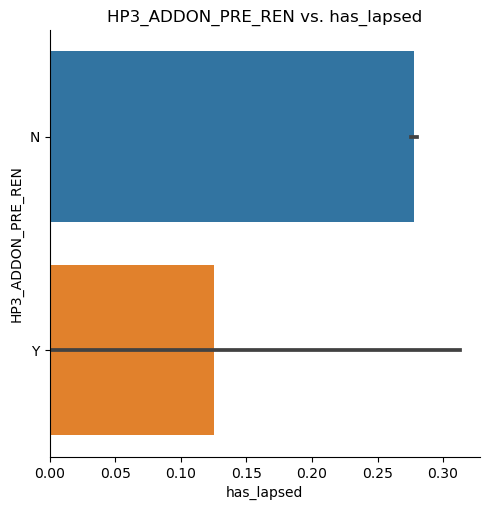

Chi-squared test statistic: 171.39
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

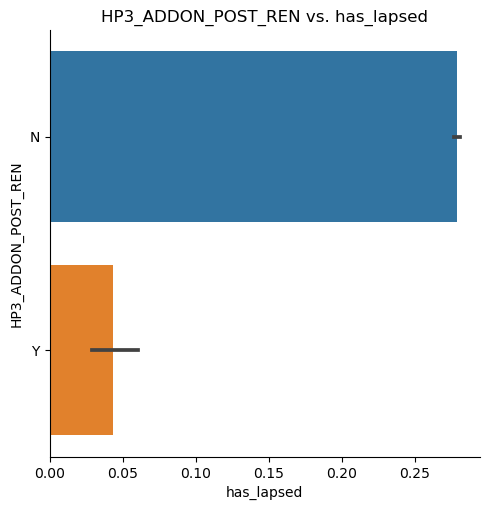

Chi-squared test statistic: 5.67
P-value: 0.02
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

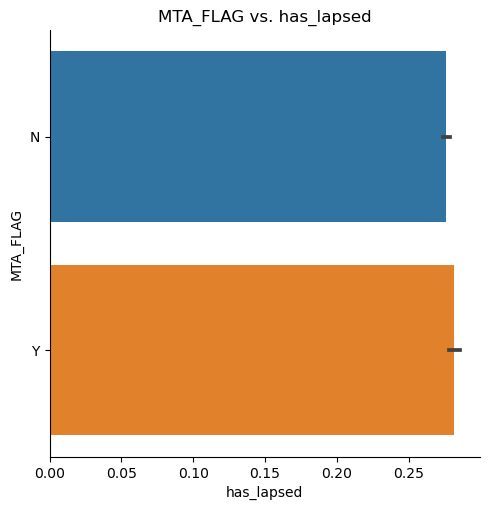

In [45]:
for col in boolean:
    
    discrete_comparison(data_no_nulls , col, target, plot_type= 'bar')

HOME_EM_ADDON_POST_REN (Option to cover emergency situations, such as plumbing or electrical emergencies that require immediate attention) seems to have no significant effect for observed vs expected values, so this will be dropped from the dataset. 

PAYING_GUESTS also seems to have little effect on lapsing.

In [46]:
data_no_nulls.drop(['HOME_EM_ADDON_POST_REN'], axis = 'columns', inplace = True)

In [47]:
data_no_nulls.drop(['PAYING_GUESTS'], axis = 'columns', inplace = True)

In [48]:
data_no_nulls.drop(['HP3_ADDON_PRE_REN'], axis = 'columns', inplace = True)

In [119]:
# new data type fields we are interested in

target = 'has_lapsed'

continuous = ['RISK_RATED_AREA_B',  'RISK_RATED_AREA_C', 'LAST_ANN_PREM_GROSS', 'house_age', 'cover_length']

cat_ordinal = ['NCD_GRANTED_YEARS_B', 'NCD_GRANTED_YEARS_C', 'BEDROOMS']

cat_nominal = ['P1_EMP_STATUS', 'P1_MAR_STATUS', 'special_item_premium_quantile_band',
              'special_item_cover_quantile_band', 'wall_construction_cat', 'roof_construction_cat', 'OCC_STATUS',
              'PROP_TYPE','OWNERSHIP_TYPE','max_contents_coverage']

boolean = ['CLAIM3YEARS', 'BUS_USE', 'AD_BUILDINGS', 'AD_CONTENTS', 'CONTENTS_COVER', 'BUILDINGS_COVER',
          'P1_SEX', 'P1_POLICY_REFUSED', 'APPR_ALARM', 'APPR_LOCKS',
          'FLOODING', 'NEIGH_WATCH', 'SAFE_INSTALLED',
             'SEC_DISC_REQ',
             'SUBSIDENCE',
             'PAYMENT_FREQUENCY',
             'LEGAL_ADDON_PRE_REN',
             'LEGAL_ADDON_POST_REN',
             'HOME_EM_ADDON_PRE_REN',
             'GARDEN_ADDON_PRE_REN',
             'GARDEN_ADDON_POST_REN',
             'KEYCARE_ADDON_PRE_REN',
             'KEYCARE_ADDON_POST_REN',
             'HP1_ADDON_PRE_REN',
             'HP1_ADDON_POST_REN',
             'HP2_ADDON_PRE_REN',
             'HP2_ADDON_POST_REN',
             'HP3_ADDON_POST_REN',
             'MTA_FLAG',
              'max_building_coverage']


In [120]:
# for ordinal values we turn them into integers

data_no_nulls[cat_ordinal] = data_no_nulls[cat_ordinal].astype(int)

In [121]:
# for all boolean values check to see if unique value set = {0,1} otherwise map N:0 and Y:1

for val in boolean:
    
    if set(data_no_nulls[val].unique()) == {0.0,1.0}:
        pass
    elif set(data_no_nulls[val].unique()) == {'N','Y'}:
        data_no_nulls[val] = data_no_nulls[val].map({'N':0 , 'Y':1})
        
    elif set(data_no_nulls[val].unique()) == {'F', 'M', 'N'}:
        # set male to 1 and female and Non to 0
        # male has the largest count so ill make that binary 1
        data_no_nulls[val] = data_no_nulls[val].map({'M':1 , 'F':0, 'N': 0})
        
    
    

finally lets test the correlation between features

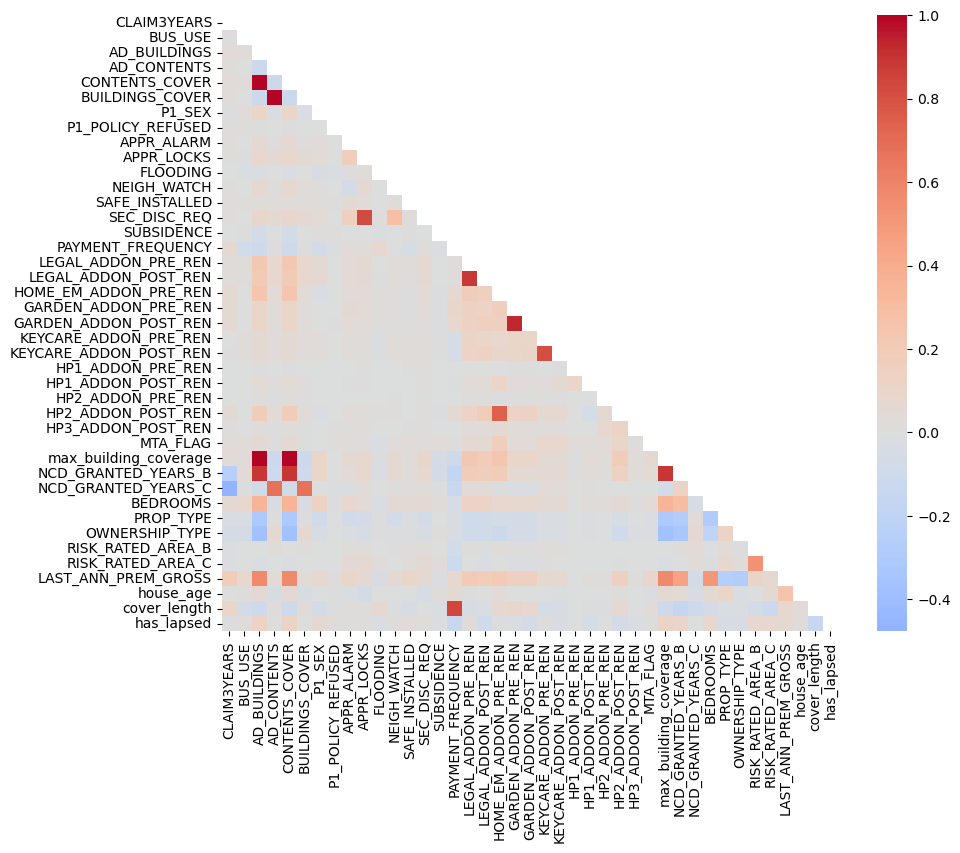

In [122]:
def plot_correlation_heatmap(data):
    corr_matrix = data.corr()
    mask = np.zeros_like(corr_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', annot=False, center=0, square=True, fmt='.2f')
    plt.show()
    
    
    
plot_correlation_heatmap(data_no_nulls[boolean + cat_ordinal + cat_nominal + continuous + [target]])

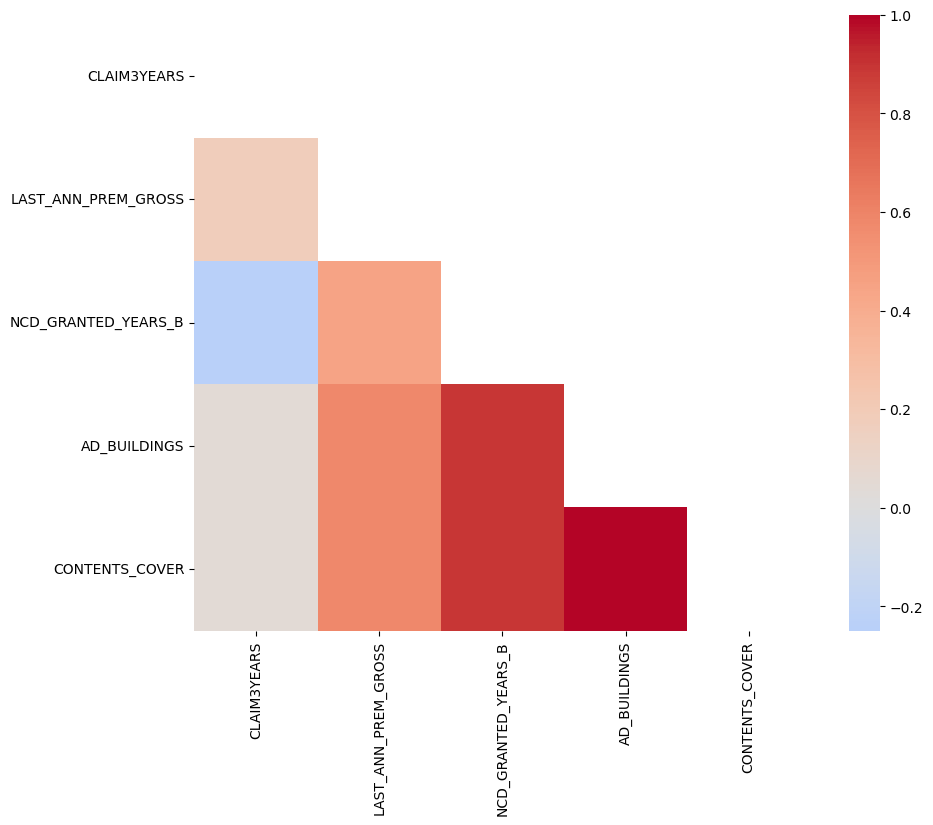

In [500]:
plot_correlation_heatmap(data_no_nulls[['CLAIM3YEARS', 'LAST_ANN_PREM_GROSS', 'NCD_GRANTED_YEARS_B', 
                                       'AD_BUILDINGS' , 'CONTENTS_COVER']])

**note correlated features here**

*A) 3 Year Claim with Last years premium payments*

why?


1. High premium payments: Customers who pay higher premiums may have higher claim amounts because they have more valuable assets to protect or they may be more likely to file a claim due to the higher investment they have made.

2. More coverage: Customers who opt for higher coverage may pay higher premiums and therefore, have higher claim amounts.

3. Previous claims history: Customers who have a history of making claims in the past may be charged higher premiums and also be more likely to make a claim in the future.

4. Market trends: Changes in the market can lead to an increase in both premiums and claims, resulting in a positive correlation between the two variables.


*B) NCD Granted years and max_building coverage positive correlation*

why?

Individuals who have a higher NCD (no-claims discount) may also have a greater sense of responsibility and be more likely to insure their properties for higher amounts.


*C) AD_BUILDINGS + CONTENTS_COVER with max_building_coverage*

why?

1. AD_BUILDINGS represents the coverage for self-damage to the policyholder's building, which is typically determined based on the estimated rebuilding cost of the property. A higher value for AD_BUILDINGS suggests that the policyholder has opted for a higher level of coverage for their building, which would also mean that their maximum building coverage amount is higher.



2. CONTENTS_COVER is an indicator of whether the policyholder has opted for coverage for their personal belongings. A higher value for CONTENTS_COVER suggests that the policyholder has opted for a higher level of coverage for their belongings, which could also mean that their overall coverage amount (including building coverage) is higher.


These two values were also an indication of lapsing in the charts at the EDA stage. This could be due to:
1. Cost: AD_BUILDINGS and CONTENTS_COVER may be more expensive, and therefore customers may be more likely to let their policy lapse to save money.

2. Risk: AD_BUILDINGS and CONTENTS_COVER may be more associated with risk, such as living in areas prone to natural disasters or crime, and therefore customers may be more likely to let their policy lapse if they perceive the risk to be low (Although our dataset does not show this is the case).

# Modelling

In [175]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (OneHotEncoder,
                                   StandardScaler) # using standard scaler here becuase the age of the house 
                                                    #appears normally distributed
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTENC



# define the column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), continuous), 
        ('cat_nominal', OneHotEncoder(handle_unknown='ignore'), cat_nominal)]) 

# define the pipeline with logistic regression
logistic_regression = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])

# define the pipeline with decision tree
decision_tree = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier())
])

# define the pipeline with random forest
random_forest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier())
])

# support = Pipeline(steps=[
#     ('preprocessor', preprocessor),
#     ('classifier', SVC(kernel='linear'))
# ])

X = data_no_nulls[boolean + cat_ordinal + cat_nominal + continuous]
y = data_no_nulls[target]


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Split train set into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=42)


In [178]:
lr_model = logistic_regression.fit(X_train , y_train)
dtree_model = decision_tree.fit(X_train , y_train)
rforest_model = random_forest.fit(X_train, y_train)
# svc_model = support.fit(X_train, y_train) svm very slow due to memory on computer so will have to comeback to this

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [179]:
from sklearn.metrics import (accuracy_score, precision_score, 
                             recall_score, f1_score, roc_auc_score, 
                             confusion_matrix, plot_precision_recall_curve, plot_roc_curve)


def evaluate_classification_model(model, X_test, y_test):
    
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    
    print("Accuracy: {:.3f}".format(accuracy))
    print("Precision: {:.3f}".format(precision))
    print("Recall: {:.3f}".format(recall))
    print("F1 score: {:.3f}".format(f1))
    print("AUC score: {:.3f}".format(auc))
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 6))

    # Plot confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False, ax=ax1)
    ax1.set_xlabel('Predicted label')
    ax1.set_ylabel('True label')
    ax1.set_title('Confusion Matrix')

    # Plot precision recall curve and ROC curve
    plot_precision_recall_curve(model, X_test, y_test, ax=ax2)
    plot_roc_curve(model, X_test, y_test, ax=ax2)

    plt.show()

lets look at all of the train scores

Accuracy: 0.724
Precision: 0.566
Recall: 0.033
F1 score: 0.063
AUC score: 0.651


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


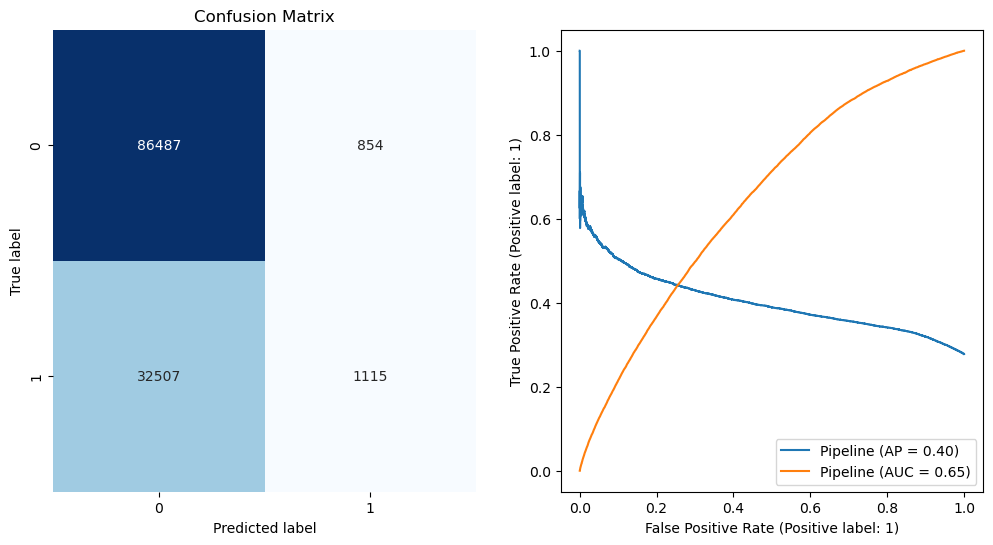

Accuracy: 0.999
Precision: 1.000
Recall: 0.997
F1 score: 0.998
AUC score: 1.000


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


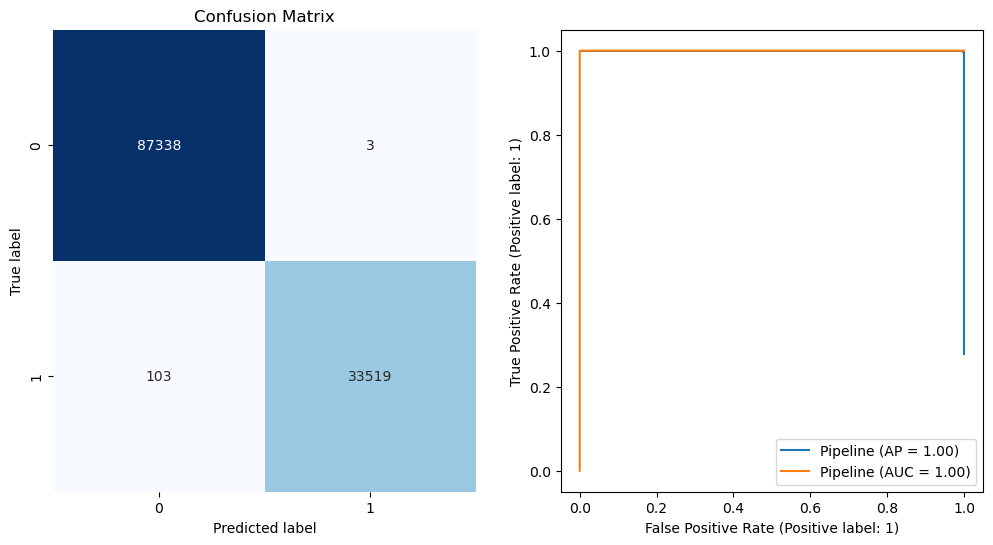

Accuracy: 0.999
Precision: 1.000
Recall: 0.997
F1 score: 0.998
AUC score: 1.000


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


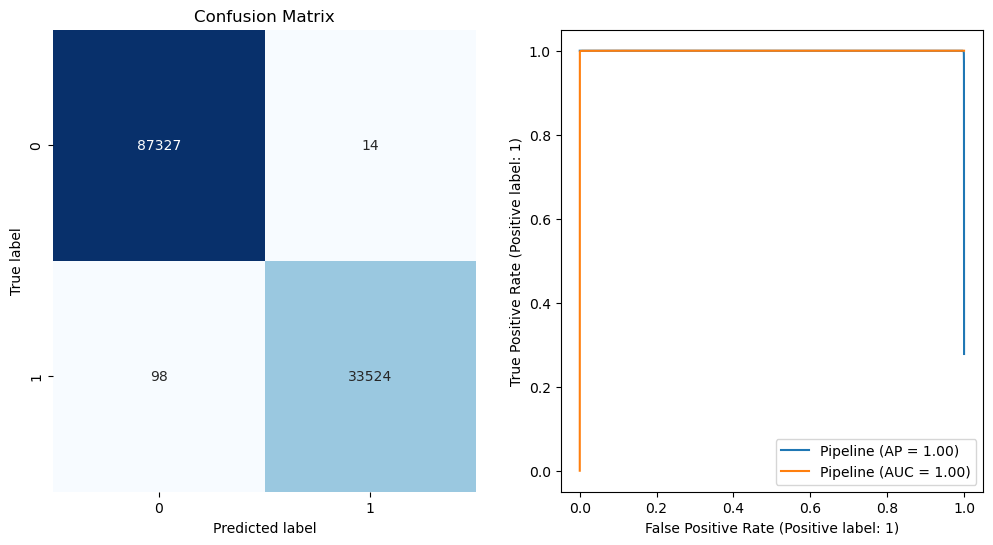

In [180]:
for model in [lr_model,
dtree_model,
rforest_model]:
    
    evaluate_classification_model(model, X_train, y_train)
    

Accuracy: 0.724
Precision: 0.561
Recall: 0.033
F1 score: 0.063
AUC score: 0.648


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


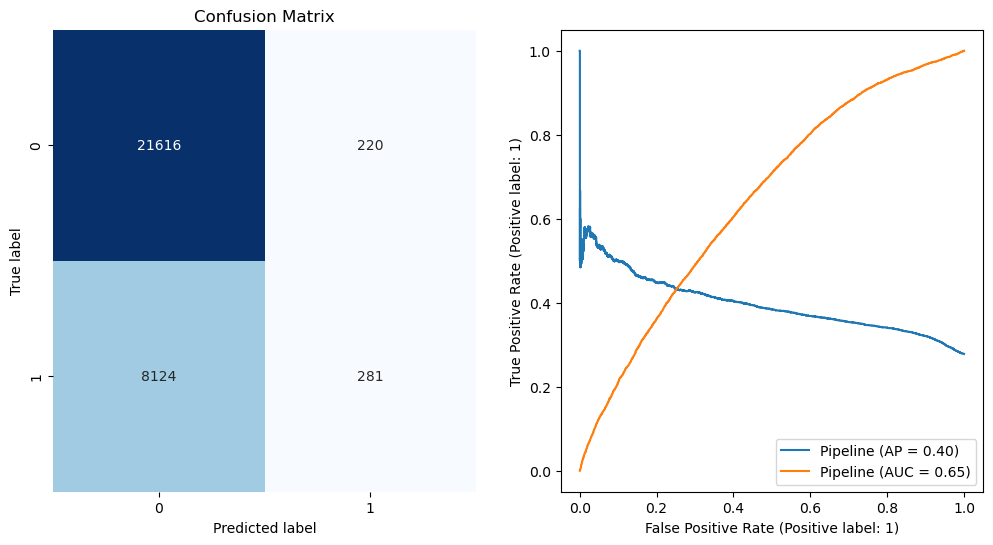

Accuracy: 0.641
Precision: 0.362
Recall: 0.382
F1 score: 0.372
AUC score: 0.561


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


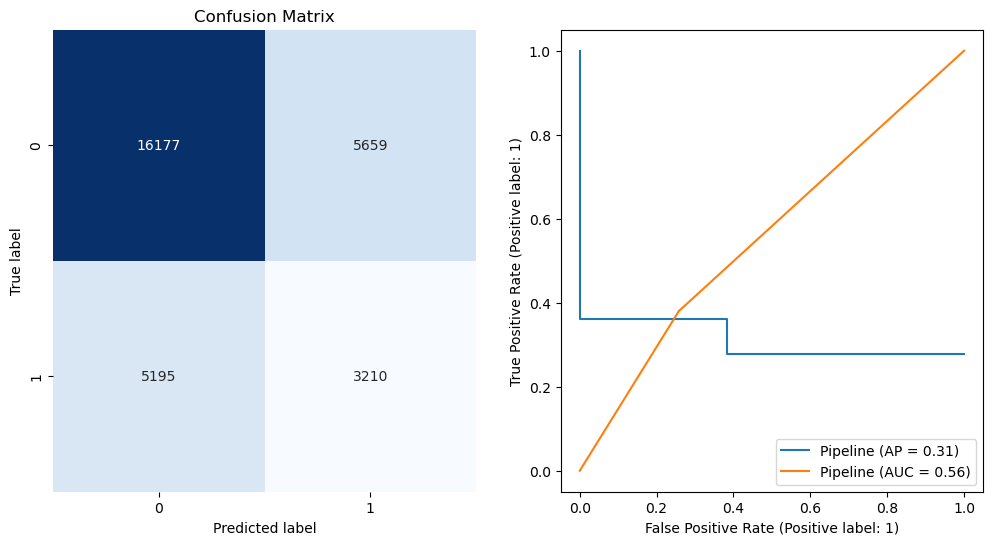

Accuracy: 0.719
Precision: 0.487
Recall: 0.234
F1 score: 0.317
AUC score: 0.656


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


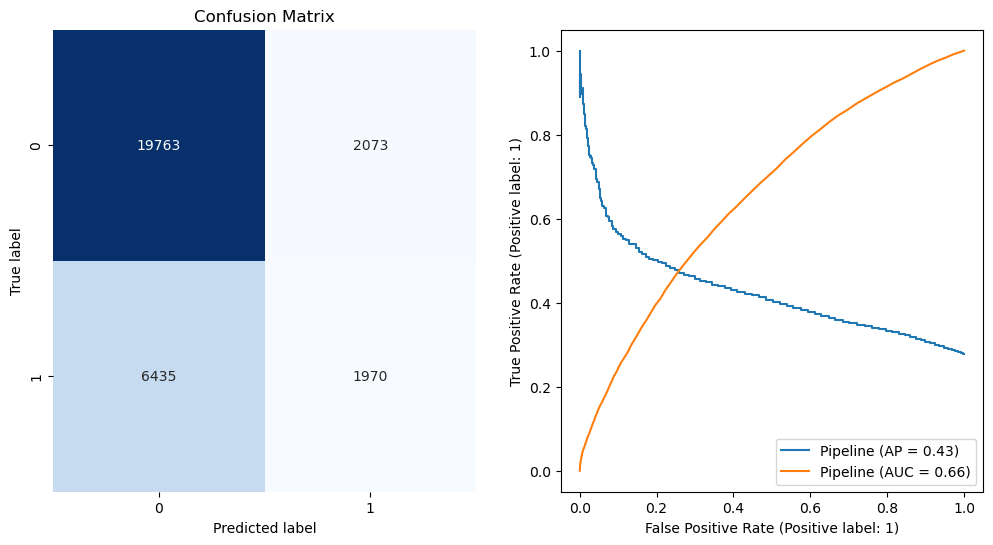

In [181]:
for model in [lr_model,
dtree_model,
rforest_model]:
    
    evaluate_classification_model(model, X_val, y_val)

The Logistic Regression is clearly the best model for the job becuase the AUC score is highest for the validation set. The test score is similar to the train score which means the model generalises well, although it is not accurate enough for any production setting. The model performs well above the baseline (0.5 AUC) which means that some features within our model allow us to choose a value that is better than guessing at random.


Its these features that we want to identify in order to report on factors that accociate with Policy Lapsing. 

In [183]:
# logistic regression is the best model to use becuase of the coefficient values and what they say about logodds of occurance

from sklearn.model_selection import GridSearchCV

# Set up the parameter grid to search over
param_grid = {
    # using 'l1' to remove irrelevant features
    'classifier__penalty': ['l1'],
    'classifier__C': np.logspace(-10, -1,20),
    'classifier__solver': ['liblinear', 'saga']
}

# Set up grid search
grid_search = GridSearchCV(logistic_regression, param_grid=param_grid, cv=5)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means

Best parameters:  {'classifier__C': 0.1, 'classifier__penalty': 'l1', 'classifier__solver': 'saga'}
Best score:  0.7238081179795983


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


Accuracy: 0.724
Precision: 0.565
Recall: 0.030
F1 score: 0.056
AUC score: 0.648


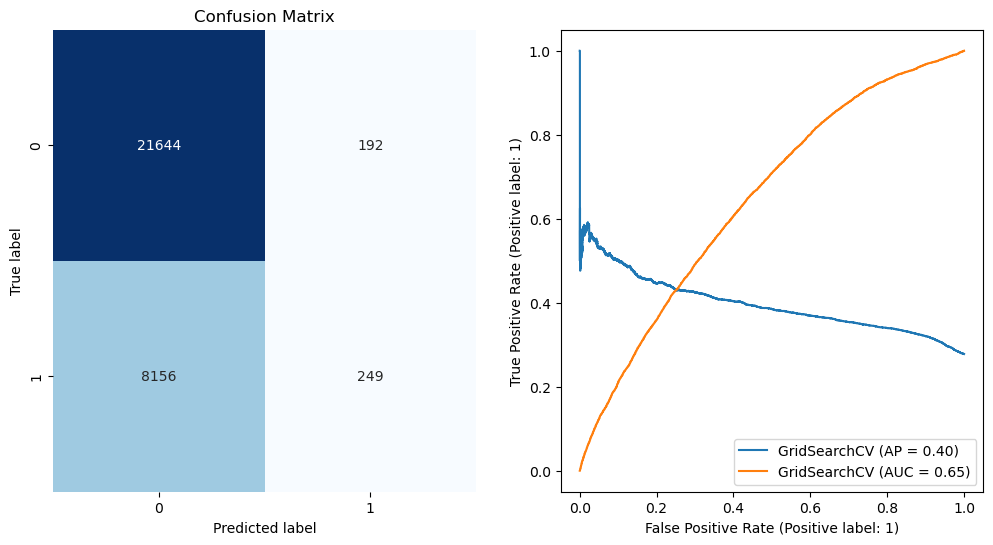

In [184]:
# how does this grid search perform on the test set?
evaluate_classification_model(grid_search, X_val, y_val)

In [185]:
coefficients = grid_search.best_estimator_['classifier'].coef_[0]

In [186]:
feature_names = grid_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

In [187]:
# create a dataframe for these

dataset_coef = pd.DataFrame({
    'features': feature_names,
    'coef' : coefficients
})


dataset_coef['abs_coef'] = abs(dataset_coef['coef'])

# isolate only relevent features
coef_data = dataset_coef.sort_values(by = 'abs_coef', ascending = False).loc[dataset_coef['abs_coef'] > 0.001]
coef_data

,features,coef,abs_coef
23,cat_nominal__P1_MAR_STATUS_P,-0.832898,0.832898
89,cat_nominal__OWNERSHIP_TYPE_8.0,0.585738,0.585738
44,cat_nominal__OCC_STATUS_PH,-0.498975,0.498975
42,cat_nominal__OCC_STATUS_LP,-0.460185,0.460185
86,cat_nominal__OWNERSHIP_TYPE_3.0,0.449519,0.449519
26,cat_nominal__special_item_premium_quantile_ban...,-0.447769,0.447769
81,cat_nominal__PROP_TYPE_51.0,0.395850,0.395850
65,cat_nominal__PROP_TYPE_25.0,-0.359105,0.359105
49,cat_nominal__PROP_TYPE_2.0,0.347508,0.347508
29,cat_nominal__special_item_cover_quantile_band_q1,-0.287706,0.287706


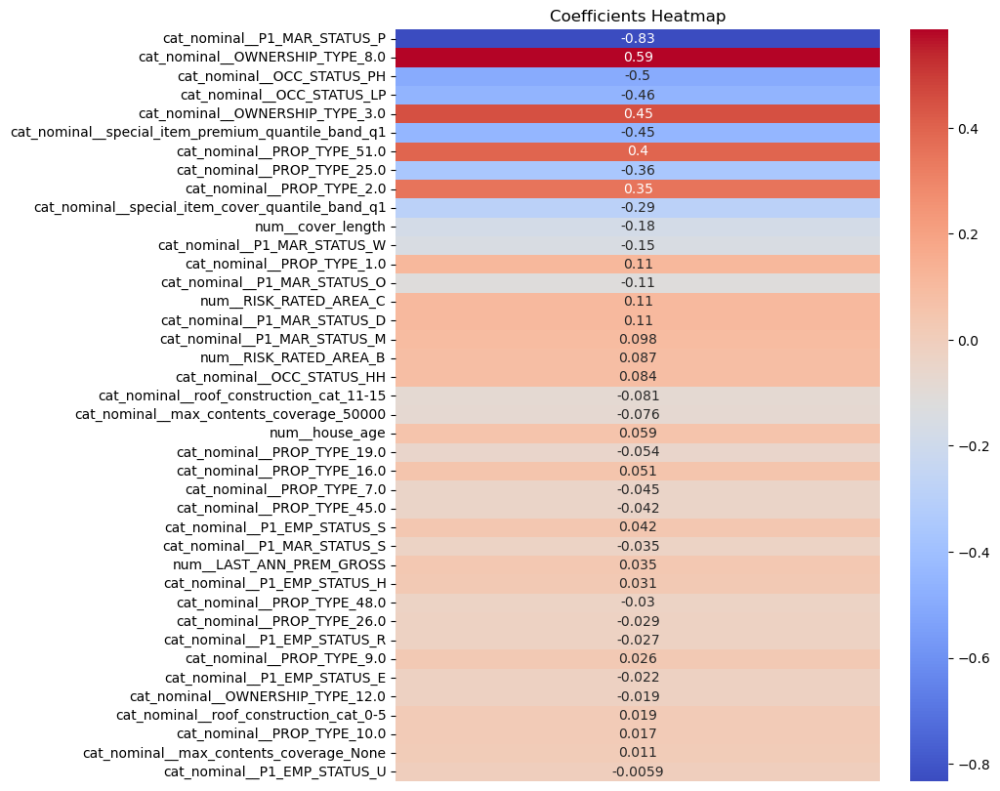

In [188]:
fig, ax = plt.subplots(figsize=(8, 10))
sns.heatmap(data=coef_data[['coef']], annot=True, fmt='.2g', cmap='coolwarm',
            yticklabels=coef_data['features'], xticklabels=False, ax=ax)
ax.set_title('Coefficients Heatmap')
plt.show()

We can see that the strongest variable in our model is having a marital status of 'P', which has a negative effect on lapsing on a housing policy.

Positive indicators include the occupancy status of private house and local authority (assumed).

Its poorly documented as to what these fields mean and I have made some assumptions, below.


employment status assumptions and Marital staus assumptions

employment_status_map = { 'R': 'Retired', 'E': 'Employed', 'S': 'Self-employed', 'N': 'Not employed', 'H': 'Homemaker', 'U': 'Unknown', 'A': 'Apprentice', 'F': 'Full-time education', 'I': 'Inactive', 'V': 'Voluntary work', 'C': 'Carer' }

marital_status = { 'M': 'Married', 'P': 'Partnership', 'O': 'Other', 'W': 'Widowed', 'S': 'Single', 'D': 'Divorced', 'A': 'Separated', 'C': 'Cohabiting', 'B': 'Unknown', 'N': 'Not Disclosed' }

### SMOTENC

The target variable is highliy imbalanced so its worth trying to use SMOTENC to make the training data have the same class balance.

In [195]:
# # imbalance pipeline
# from imblearn.over_sampling import SMOTENC


# apply one-hot encoding to categorical features
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
X_train_ohe = ohe.fit_transform(X_train[cat_nominal])

# apply standard scaling to numerical features
scaler_num = StandardScaler()
X_train_num = scaler_num.fit_transform(X_train[continuous])

X_train_rest_features = X_train[cat_ordinal]

# concatenate the one-hot encoded and scaled numerical features
X_train_transformed = pd.DataFrame(np.concatenate((X_train_ohe, X_train_num, X_train_rest_features.values), axis=1),
                                   columns = list(ohe.get_feature_names_out()) + list(scaler_num.get_feature_names_out()) + cat_ordinal)


# Fit SMOTENC to training data
smote_nc = SMOTENC(categorical_features=[idx for idx, col in enumerate([list(ohe.get_feature_names_out()) + list(scaler_num.get_feature_names_out()) + cat_ordinal][0]) if (col in cat_ordinal) or (col in list(ohe.get_feature_names_out())) ], random_state=42)


X_train_resampled, y_train_resampled = smote_nc.fit_resample(X_train_transformed, y_train)


# Define the Logistic Regression model
lr = LogisticRegression()

# Define the hyperparameters to search over
param_grid_smote = {'penalty': ['l1'],
              'C': np.logspace(-10, -1,20),
              'solver': ['liblinear', 'saga']}

# Define the GridSearchCV object
grid_search_smote = GridSearchCV(lr, param_grid_smote, cv=5, scoring='precision')

# Fit the GridSearchCV object to the data
grid_search_smote.fit(X_train_resampled, y_train_resampled)

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/minif

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/minif

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/minif

/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/chrismembrey/minif

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-10, 2.97635144e-10, 8.85866790e-10, 2.63665090e-09,
       7.84759970e-09, 2.33572147e-08, 6.95192796e-08, 2.06913808e-07,
       6.15848211e-07, 1.83298071e-06, 5.45559478e-06, 1.62377674e-05,
       4.83293024e-05, 1.43844989e-04, 4.28133240e-04, 1.27427499e-03,
       3.79269019e-03, 1.12883789e-02, 3.35981829e-02, 1.00000000e-01]),
                         'penalty': ['l1'], 'solver': ['liblinear', 'saga']},
             scoring='precision')

Accuracy: 0.636
Precision: 0.627
Recall: 0.673
F1 score: 0.649
AUC score: 0.693


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


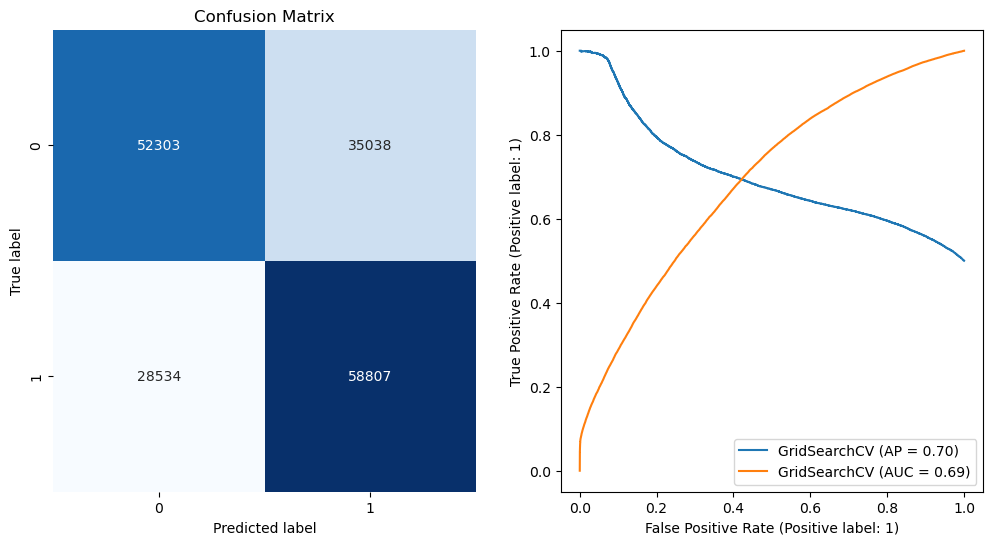

In [199]:
evaluate_classification_model(grid_search_smote, X_train_resampled, y_train_resampled)

Accuracy: 0.596
Precision: 0.363
Recall: 0.604
F1 score: 0.454
AUC score: 0.637


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


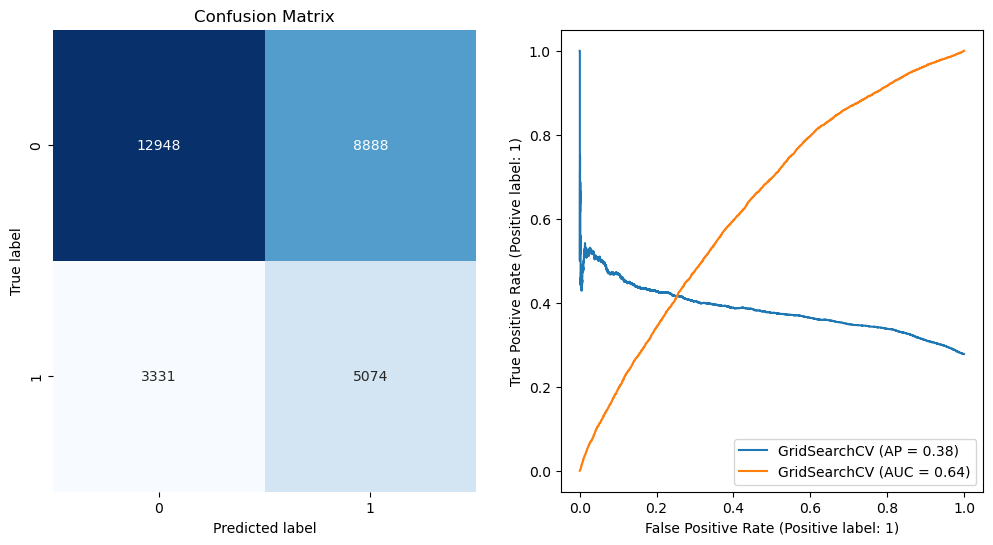

In [198]:
# now test on the validation set once more, has this made a more robust model (more robust model = more reliable coefficients)?

X_val_ohe = ohe.transform(X_val[cat_nominal])

X_val_num = scaler_num.transform(X_val[continuous])

X_val_rest_features = X_val[cat_ordinal]

# concatenate the one-hot encoded and scaled numerical features
X_val_transformed = pd.DataFrame(np.concatenate((X_val_ohe, X_val_num, X_val_rest_features.values), axis=1),
                                   columns = list(ohe.get_feature_names_out()) + list(scaler_num.get_feature_names_out()) + cat_ordinal)

evaluate_classification_model(grid_search_smote, X_val_transformed, y_val)

The precision of the model has improved on the training set but now performs poorly on the validation set and doesnt generalise well, even with regularisation. 

### Bootstrapping the coeffs

The next stage is to gauge **how statistically significant the variables are** from the original model (we need to test that we didnt get them by chance). We can either use statsmodels or boostrapping of the coefficients with resampling of the training data to produce confidence intervals.

In [211]:
from tqdm import tqdm
from scipy import stats

def bootstrap_logistic_regression(model, X_train, y_train, num_samples):
    """
    Bootstrap logistic regression model with specified parameters on train data.
    
    Parameters:
    -----------
    model : sklearn.linear_model.LogisticRegression
        Logistic regression model with specified parameters.
    X_train : pandas.DataFrame
        Training data features.
    y_train : pandas.Series
        Training data target variable.
    num_samples : int
        Number of samples to take for bootstrapping with replacement.
        
    Returns:
    --------
    coef_df : pandas.DataFrame
        DataFrame of coefficients, confidence intervals, and p-values.
    """
    
    feature_names = grid_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()
    
    # Set random seed for reproducibility
    np.random.seed(42)
    
    # Initialize list to store coefficients for each bootstrap sample
    coef_list = []
    
    # Loop through each bootstrap sample
    for i in tqdm(range(num_samples)):
        # Sample from training data with replacement
        sample_indices = np.random.choice(X_train.index, size=len(X_train), replace=True)
        X_train_sample = X_train.loc[sample_indices]
        y_train_sample = y_train.loc[sample_indices]
        
        # Fit logistic regression model on bootstrapped data
        model.fit(X_train_sample, y_train_sample)
        
        # Get coefficients and add to list
        coef_list.append(model['classifier'].coef_[0])
    
    # Convert coefficient list to DataFrame
    coef_df = pd.DataFrame(coef_list, columns=feature_names)
    
    return coef_df

In [213]:
best_model_param = {'C': 0.1, 'penalty': 'l1', 'solver': 'saga'}


# define the pipeline with logistic regression
logistic_regression_final = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(**best_model_param))
])


coef_data = bootstrap_logistic_regression(logistic_regression_final, X_train, y_train, 5_000)
coef_data

  0%|                                                                                                                                                                              | 0/5000 [00:00<?, ?it/s]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  0%|                                                                                                                                                                    | 1/5000 [00:04<5:37:43,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  0%|                                                                                                                                                                    | 2/5

  0%|▋                                                                                                                                                                  | 20/5000 [01:25<6:01:10,  4.35s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  0%|▋                                                                                                                                                                  | 21/5000 [01:28<5:51:07,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  0%|▋                                                                                                                                                                  | 22/5

  1%|█▎                                                                                                                                                                 | 40/5000 [02:49<5:51:57,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  1%|█▎                                                                                                                                                                 | 42/5000 [02:56<5:37:45,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  1%|█▍                                                                                                                                                                 | 43/5

  1%|██                                                                                                                                                                 | 62/5000 [04:19<5:17:34,  3.86s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  1%|██                                                                                                                                                                 | 63/5000 [04:24<5:32:29,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  1%|██                                                                                                                                                                 | 64/5

  2%|██▋                                                                                                                                                                | 83/5000 [05:46<5:40:03,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  2%|██▋                                                                                                                                                                | 84/5000 [05:50<5:45:03,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  2%|██▊                                                                                                                                                                | 85/5

  2%|███▎                                                                                                                                                              | 104/5000 [07:12<5:53:01,  4.33s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  2%|███▍                                                                                                                                                              | 105/5000 [07:16<5:47:47,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  2%|███▍                                                                                                                                                              | 106/5

  2%|████                                                                                                                                                              | 124/5000 [08:39<5:45:51,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  2%|████                                                                                                                                                              | 125/5000 [08:43<5:41:47,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  3%|████                                                                                                                                                              | 126/5

  3%|████▋                                                                                                                                                             | 144/5000 [10:04<5:45:46,  4.27s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  3%|████▋                                                                                                                                                             | 145/5000 [10:08<5:47:35,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  3%|████▋                                                                                                                                                             | 146/5

  3%|█████▎                                                                                                                                                            | 165/5000 [11:32<5:42:58,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  3%|█████▍                                                                                                                                                            | 166/5000 [11:36<5:40:26,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  3%|█████▍                                                                                                                                                            | 167/5

  4%|█████▉                                                                                                                                                            | 185/5000 [12:55<5:40:02,  4.24s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  4%|██████                                                                                                                                                            | 186/5000 [13:00<5:41:40,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  4%|██████                                                                                                                                                            | 187/5

  4%|██████▋                                                                                                                                                           | 206/5000 [14:23<5:42:19,  4.28s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  4%|██████▋                                                                                                                                                           | 207/5000 [14:28<5:37:59,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  4%|██████▋                                                                                                                                                           | 208/5

  5%|███████▎                                                                                                                                                          | 227/5000 [15:48<5:20:27,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|███████▍                                                                                                                                                          | 230/5000 [15:56<4:06:27,  3.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|███████▍                                                                                                                                                          | 231/5

  5%|████████                                                                                                                                                          | 249/5000 [17:14<5:25:00,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|████████                                                                                                                                                          | 250/5000 [17:18<5:20:42,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|████████▏                                                                                                                                                         | 251/5

  5%|████████▋                                                                                                                                                         | 269/5000 [18:37<5:32:48,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|████████▋                                                                                                                                                         | 270/5000 [18:41<5:27:25,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  5%|████████▊                                                                                                                                                         | 271/5

  6%|█████████▎                                                                                                                                                        | 289/5000 [19:58<5:20:05,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  6%|█████████▍                                                                                                                                                        | 290/5000 [20:02<5:14:43,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  6%|█████████▍                                                                                                                                                        | 291/5

  6%|██████████                                                                                                                                                        | 309/5000 [21:20<5:21:34,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  6%|██████████                                                                                                                                                        | 310/5000 [21:24<5:19:14,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  6%|██████████                                                                                                                                                        | 311/5

  7%|██████████▋                                                                                                                                                       | 330/5000 [22:45<5:17:01,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|██████████▋                                                                                                                                                       | 331/5000 [22:49<5:14:34,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|██████████▊                                                                                                                                                       | 332/5

  7%|███████████▎                                                                                                                                                      | 350/5000 [24:08<5:21:56,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|███████████▎                                                                                                                                                      | 351/5000 [24:13<5:24:03,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|███████████▍                                                                                                                                                      | 352/5

  7%|███████████▉                                                                                                                                                      | 370/5000 [25:30<5:10:57,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|████████████                                                                                                                                                      | 371/5000 [25:35<5:13:06,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  7%|████████████                                                                                                                                                      | 372/5

  8%|████████████▋                                                                                                                                                     | 390/5000 [26:53<5:20:12,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  8%|████████████▋                                                                                                                                                     | 391/5000 [26:57<5:20:16,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  8%|████████████▋                                                                                                                                                     | 393/5

  8%|█████████████▎                                                                                                                                                    | 412/5000 [28:22<5:07:41,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  8%|█████████████▍                                                                                                                                                    | 413/5000 [28:26<5:09:31,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  8%|█████████████▍                                                                                                                                                    | 414/5

  9%|█████████████▉                                                                                                                                                    | 432/5000 [29:44<5:14:00,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  9%|██████████████                                                                                                                                                    | 433/5000 [29:48<5:15:18,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  9%|██████████████                                                                                                                                                    | 434/5

  9%|██████████████▋                                                                                                                                                   | 452/5000 [31:06<5:10:48,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  9%|██████████████▋                                                                                                                                                   | 453/5000 [31:10<5:14:45,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  9%|██████████████▋                                                                                                                                                   | 454/5

  9%|███████████████▎                                                                                                                                                  | 473/5000 [32:32<5:05:05,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
  9%|███████████████▎                                                                                                                                                  | 474/5000 [32:36<5:01:08,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 10%|███████████████▍                                                                                                                                                  | 475/5

 10%|███████████████▉                                                                                                                                                  | 493/5000 [33:54<5:04:48,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 10%|████████████████                                                                                                                                                  | 494/5000 [33:58<5:10:16,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 10%|████████████████                                                                                                                                                  | 495/5

 10%|████████████████▌                                                                                                                                                 | 513/5000 [35:16<5:08:45,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 10%|████████████████▋                                                                                                                                                 | 514/5000 [35:20<5:11:58,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 10%|████████████████▋                                                                                                                                                 | 515/5

 11%|█████████████████▎                                                                                                                                                | 533/5000 [36:39<5:08:50,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 11%|█████████████████▎                                                                                                                                                | 534/5000 [36:43<5:04:57,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 11%|█████████████████▎                                                                                                                                                | 536/5

 11%|█████████████████▉                                                                                                                                                | 554/5000 [38:07<5:18:21,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 11%|█████████████████▉                                                                                                                                                | 555/5000 [38:11<5:09:32,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 11%|██████████████████                                                                                                                                                | 556/5

 11%|██████████████████▌                                                                                                                                               | 574/5000 [39:31<5:15:58,  4.28s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|██████████████████▋                                                                                                                                               | 575/5000 [39:35<5:06:03,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|██████████████████▋                                                                                                                                               | 576/5

 12%|███████████████████▏                                                                                                                                              | 594/5000 [40:54<5:02:19,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|███████████████████▎                                                                                                                                              | 595/5000 [40:59<5:03:48,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|███████████████████▎                                                                                                                                              | 596/5

 12%|███████████████████▉                                                                                                                                              | 614/5000 [42:17<5:05:08,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|███████████████████▉                                                                                                                                              | 615/5000 [42:22<5:14:24,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 12%|███████████████████▉                                                                                                                                              | 616/5

 13%|████████████████████▌                                                                                                                                             | 634/5000 [43:40<5:01:07,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 13%|████████████████████▌                                                                                                                                             | 636/5000 [43:47<4:23:02,  3.62s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 13%|████████████████████▋                                                                                                                                             | 637/5

 13%|█████████████████████▏                                                                                                                                            | 655/5000 [45:04<4:54:32,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 13%|█████████████████████▎                                                                                                                                            | 656/5000 [45:08<4:53:44,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 13%|█████████████████████▎                                                                                                                                            | 657/5

 14%|█████████████████████▊                                                                                                                                            | 675/5000 [46:28<5:06:09,  4.25s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|█████████████████████▉                                                                                                                                            | 676/5000 [46:32<5:07:28,  4.27s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|█████████████████████▉                                                                                                                                            | 677/5

 14%|██████████████████████▌                                                                                                                                           | 696/5000 [47:54<4:50:08,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|██████████████████████▌                                                                                                                                           | 697/5000 [47:58<4:52:57,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|██████████████████████▌                                                                                                                                           | 698/5

 14%|███████████████████████▏                                                                                                                                          | 717/5000 [49:21<4:52:48,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|███████████████████████▎                                                                                                                                          | 718/5000 [49:25<4:58:26,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 14%|███████████████████████▎                                                                                                                                          | 719/5

 15%|███████████████████████▉                                                                                                                                          | 737/5000 [50:43<4:58:34,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 15%|███████████████████████▉                                                                                                                                          | 738/5000 [50:47<5:00:11,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 15%|███████████████████████▉                                                                                                                                          | 739/5

 15%|████████████████████████▌                                                                                                                                         | 757/5000 [52:06<4:52:06,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 15%|████████████████████████▌                                                                                                                                         | 758/5000 [52:10<4:50:11,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 15%|████████████████████████▌                                                                                                                                         | 759/5

 16%|█████████████████████████▏                                                                                                                                        | 777/5000 [53:27<4:41:23,  4.00s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|█████████████████████████▏                                                                                                                                        | 778/5000 [53:31<4:49:33,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|█████████████████████████▏                                                                                                                                        | 779/5

 16%|█████████████████████████▊                                                                                                                                        | 797/5000 [54:49<4:47:58,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|█████████████████████████▊                                                                                                                                        | 798/5000 [54:53<4:47:06,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|█████████████████████████▉                                                                                                                                        | 799/5

 16%|██████████████████████████▍                                                                                                                                       | 817/5000 [56:11<4:39:49,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|██████████████████████████▌                                                                                                                                       | 818/5000 [56:15<4:40:23,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 16%|██████████████████████████▌                                                                                                                                       | 819/5

 17%|███████████████████████████                                                                                                                                       | 837/5000 [57:34<4:50:45,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 17%|███████████████████████████▏                                                                                                                                      | 838/5000 [57:38<4:49:41,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 17%|███████████████████████████▏                                                                                                                                      | 839/5

 17%|███████████████████████████▊                                                                                                                                      | 858/5000 [58:59<4:35:36,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 17%|███████████████████████████▊                                                                                                                                      | 859/5000 [59:03<4:37:53,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 17%|███████████████████████████▊                                                                                                                                      | 860/5

 18%|████████████████████████████                                                                                                                                    | 878/5000 [1:00:22<4:45:43,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|████████████████████████████▏                                                                                                                                   | 879/5000 [1:00:26<4:46:32,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|████████████████████████████▏                                                                                                                                   | 880/500

 18%|████████████████████████████▋                                                                                                                                   | 898/5000 [1:01:45<4:43:23,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|████████████████████████████▊                                                                                                                                   | 899/5000 [1:01:49<4:42:40,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|████████████████████████████▊                                                                                                                                   | 900/500

 18%|█████████████████████████████▍                                                                                                                                  | 919/5000 [1:03:11<4:33:48,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|█████████████████████████████▍                                                                                                                                  | 920/5000 [1:03:15<4:33:58,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 18%|█████████████████████████████▍                                                                                                                                  | 921/500

 19%|██████████████████████████████                                                                                                                                  | 939/5000 [1:04:33<4:39:19,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 19%|██████████████████████████████                                                                                                                                  | 940/5000 [1:04:38<4:43:31,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 19%|██████████████████████████████                                                                                                                                  | 941/500

 19%|██████████████████████████████▋                                                                                                                                 | 959/5000 [1:05:56<4:31:21,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 19%|██████████████████████████████▋                                                                                                                                 | 960/5000 [1:05:59<4:28:22,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 19%|██████████████████████████████▊                                                                                                                                 | 961/500

 20%|███████████████████████████████▎                                                                                                                                | 979/5000 [1:07:20<4:44:47,  4.25s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|███████████████████████████████▎                                                                                                                                | 980/5000 [1:07:24<4:43:01,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|███████████████████████████████▍                                                                                                                                | 981/500

 20%|███████████████████████████████▉                                                                                                                                | 999/5000 [1:08:43<4:34:18,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|███████████████████████████████▊                                                                                                                               | 1000/5000 [1:08:47<4:38:35,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|███████████████████████████████▊                                                                                                                               | 1001/500

 20%|████████████████████████████████▍                                                                                                                              | 1019/5000 [1:10:06<4:37:42,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|████████████████████████████████▍                                                                                                                              | 1020/5000 [1:10:10<4:33:36,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 20%|████████████████████████████████▍                                                                                                                              | 1021/500

 21%|█████████████████████████████████                                                                                                                              | 1039/5000 [1:11:29<4:32:42,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 21%|█████████████████████████████████                                                                                                                              | 1040/5000 [1:11:33<4:35:56,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 21%|█████████████████████████████████                                                                                                                              | 1041/500

 21%|█████████████████████████████████▋                                                                                                                             | 1059/5000 [1:12:49<4:21:06,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 21%|█████████████████████████████████▋                                                                                                                             | 1060/5000 [1:12:53<4:23:28,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 21%|█████████████████████████████████▋                                                                                                                             | 1061/500

 22%|██████████████████████████████████▎                                                                                                                            | 1079/5000 [1:14:11<4:25:41,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|██████████████████████████████████▎                                                                                                                            | 1080/5000 [1:14:16<4:26:41,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|██████████████████████████████████▍                                                                                                                            | 1082/500

 22%|██████████████████████████████████▉                                                                                                                            | 1100/5000 [1:15:38<4:27:19,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|███████████████████████████████████                                                                                                                            | 1101/5000 [1:15:42<4:25:31,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|███████████████████████████████████                                                                                                                            | 1102/500

 22%|███████████████████████████████████▌                                                                                                                           | 1120/5000 [1:17:01<4:27:10,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|███████████████████████████████████▋                                                                                                                           | 1121/5000 [1:17:05<4:27:15,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 22%|███████████████████████████████████▋                                                                                                                           | 1122/500

 23%|████████████████████████████████████▎                                                                                                                          | 1140/5000 [1:18:22<4:21:16,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 23%|████████████████████████████████████▎                                                                                                                          | 1141/5000 [1:18:26<4:19:19,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 23%|████████████████████████████████████▎                                                                                                                          | 1142/500

 23%|████████████████████████████████████▉                                                                                                                          | 1160/5000 [1:19:44<4:25:01,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 23%|████████████████████████████████████▉                                                                                                                          | 1161/5000 [1:19:49<4:26:01,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 23%|████████████████████████████████████▉                                                                                                                          | 1162/500

 24%|█████████████████████████████████████▌                                                                                                                         | 1181/5000 [1:21:10<4:14:39,  4.00s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|█████████████████████████████████████▌                                                                                                                         | 1182/5000 [1:21:14<4:22:21,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|█████████████████████████████████████▌                                                                                                                         | 1183/500

 24%|██████████████████████████████████████▏                                                                                                                        | 1201/5000 [1:22:32<4:16:06,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|██████████████████████████████████████▏                                                                                                                        | 1202/5000 [1:22:36<4:19:32,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|██████████████████████████████████████▎                                                                                                                        | 1203/500

 24%|██████████████████████████████████████▊                                                                                                                        | 1221/5000 [1:23:55<4:20:57,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|██████████████████████████████████████▊                                                                                                                        | 1222/5000 [1:23:59<4:23:38,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 24%|██████████████████████████████████████▉                                                                                                                        | 1223/500

 25%|███████████████████████████████████████▍                                                                                                                       | 1241/5000 [1:25:17<4:16:35,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 25%|███████████████████████████████████████▍                                                                                                                       | 1242/5000 [1:25:21<4:21:18,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 25%|███████████████████████████████████████▌                                                                                                                       | 1243/500

 25%|████████████████████████████████████████                                                                                                                       | 1261/5000 [1:26:39<4:14:08,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 25%|████████████████████████████████████████▏                                                                                                                      | 1262/5000 [1:26:44<4:16:14,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 25%|████████████████████████████████████████▏                                                                                                                      | 1264/500

 26%|████████████████████████████████████████▊                                                                                                                      | 1283/5000 [1:28:10<4:07:03,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|████████████████████████████████████████▊                                                                                                                      | 1284/5000 [1:28:14<4:09:48,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|████████████████████████████████████████▊                                                                                                                      | 1285/500

 26%|█████████████████████████████████████████▍                                                                                                                     | 1303/5000 [1:29:32<4:09:40,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|█████████████████████████████████████████▍                                                                                                                     | 1304/5000 [1:29:36<4:11:50,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|█████████████████████████████████████████▍                                                                                                                     | 1305/500

 26%|██████████████████████████████████████████                                                                                                                     | 1323/5000 [1:30:54<4:13:32,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|██████████████████████████████████████████                                                                                                                     | 1324/5000 [1:30:59<4:17:26,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 26%|██████████████████████████████████████████▏                                                                                                                    | 1325/500

 27%|██████████████████████████████████████████▋                                                                                                                    | 1344/5000 [1:32:21<4:09:01,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 27%|██████████████████████████████████████████▊                                                                                                                    | 1345/5000 [1:32:25<4:13:38,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 27%|██████████████████████████████████████████▊                                                                                                                    | 1346/500

 27%|███████████████████████████████████████████▍                                                                                                                   | 1365/5000 [1:33:47<4:07:49,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 27%|███████████████████████████████████████████▍                                                                                                                   | 1366/5000 [1:33:51<4:04:59,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 27%|███████████████████████████████████████████▍                                                                                                                   | 1367/500

 28%|████████████████████████████████████████████                                                                                                                   | 1385/5000 [1:35:08<4:05:18,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 28%|████████████████████████████████████████████                                                                                                                   | 1386/5000 [1:35:12<4:07:21,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 28%|████████████████████████████████████████████                                                                                                                   | 1387/500

 28%|████████████████████████████████████████████▋                                                                                                                  | 1405/5000 [1:36:31<4:02:20,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 28%|████████████████████████████████████████████▋                                                                                                                  | 1406/5000 [1:36:35<4:03:43,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 28%|████████████████████████████████████████████▋                                                                                                                  | 1407/500

 28%|█████████████████████████████████████████████▎                                                                                                                 | 1425/5000 [1:37:55<4:14:08,  4.27s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|█████████████████████████████████████████████▎                                                                                                                 | 1426/5000 [1:37:59<4:13:00,  4.25s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|█████████████████████████████████████████████▍                                                                                                                 | 1427/500

 29%|█████████████████████████████████████████████▉                                                                                                                 | 1445/5000 [1:39:19<4:14:56,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|█████████████████████████████████████████████▉                                                                                                                 | 1446/5000 [1:39:23<4:10:17,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|██████████████████████████████████████████████                                                                                                                 | 1447/500

 29%|██████████████████████████████████████████████▌                                                                                                                | 1465/5000 [1:40:41<4:00:08,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|██████████████████████████████████████████████▌                                                                                                                | 1466/5000 [1:40:45<3:58:27,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 29%|██████████████████████████████████████████████▋                                                                                                                | 1467/500

 30%|███████████████████████████████████████████████▏                                                                                                               | 1485/5000 [1:42:04<4:00:28,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 30%|███████████████████████████████████████████████▎                                                                                                               | 1486/5000 [1:42:08<3:55:22,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 30%|███████████████████████████████████████████████▎                                                                                                               | 1488/500

 30%|███████████████████████████████████████████████▉                                                                                                               | 1506/5000 [1:43:31<4:01:36,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 30%|███████████████████████████████████████████████▉                                                                                                               | 1507/5000 [1:43:35<3:58:58,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 30%|███████████████████████████████████████████████▉                                                                                                               | 1508/500

 31%|████████████████████████████████████████████████▌                                                                                                              | 1526/5000 [1:44:53<3:56:00,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|████████████████████████████████████████████████▌                                                                                                              | 1527/5000 [1:44:57<3:54:24,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|████████████████████████████████████████████████▌                                                                                                              | 1528/500

 31%|█████████████████████████████████████████████████▏                                                                                                             | 1546/5000 [1:46:15<3:53:50,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|█████████████████████████████████████████████████▏                                                                                                             | 1547/5000 [1:46:19<3:55:36,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|█████████████████████████████████████████████████▏                                                                                                             | 1548/500

 31%|█████████████████████████████████████████████████▊                                                                                                             | 1566/5000 [1:47:37<3:57:46,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|█████████████████████████████████████████████████▊                                                                                                             | 1567/5000 [1:47:42<4:00:26,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 31%|█████████████████████████████████████████████████▊                                                                                                             | 1568/500

 32%|██████████████████████████████████████████████████▍                                                                                                            | 1586/5000 [1:49:00<3:51:01,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 32%|██████████████████████████████████████████████████▍                                                                                                            | 1587/5000 [1:49:04<3:52:09,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 32%|██████████████████████████████████████████████████▍                                                                                                            | 1588/500

 32%|███████████████████████████████████████████████████                                                                                                            | 1606/5000 [1:50:22<3:48:58,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 32%|███████████████████████████████████████████████████                                                                                                            | 1607/5000 [1:50:26<3:45:28,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 32%|███████████████████████████████████████████████████▏                                                                                                           | 1608/500

 33%|███████████████████████████████████████████████████▋                                                                                                           | 1627/5000 [1:51:49<3:56:35,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|███████████████████████████████████████████████████▊                                                                                                           | 1628/5000 [1:51:53<3:49:50,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|███████████████████████████████████████████████████▊                                                                                                           | 1629/500

 33%|████████████████████████████████████████████████████▎                                                                                                          | 1647/5000 [1:53:12<3:49:25,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|████████████████████████████████████████████████████▍                                                                                                          | 1648/5000 [1:53:16<3:53:30,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|████████████████████████████████████████████████████▍                                                                                                          | 1649/500

 33%|█████████████████████████████████████████████████████                                                                                                          | 1667/5000 [1:54:35<3:48:51,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|█████████████████████████████████████████████████████                                                                                                          | 1668/5000 [1:54:39<3:50:55,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 33%|█████████████████████████████████████████████████████                                                                                                          | 1669/500

 34%|█████████████████████████████████████████████████████▋                                                                                                         | 1687/5000 [1:55:58<3:55:10,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 34%|█████████████████████████████████████████████████████▋                                                                                                         | 1688/5000 [1:56:03<3:58:00,  4.31s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 34%|█████████████████████████████████████████████████████▋                                                                                                         | 1689/500

 34%|██████████████████████████████████████████████████████▎                                                                                                        | 1707/5000 [1:57:20<3:41:53,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 34%|██████████████████████████████████████████████████████▎                                                                                                        | 1708/5000 [1:57:25<3:44:38,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 34%|██████████████████████████████████████████████████████▎                                                                                                        | 1709/500

 35%|██████████████████████████████████████████████████████▉                                                                                                        | 1727/5000 [1:58:43<3:43:52,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|██████████████████████████████████████████████████████▉                                                                                                        | 1728/5000 [1:58:47<3:46:05,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|██████████████████████████████████████████████████████▉                                                                                                        | 1729/500

 35%|███████████████████████████████████████████████████████▌                                                                                                       | 1747/5000 [2:00:06<3:42:03,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|███████████████████████████████████████████████████████▌                                                                                                       | 1748/5000 [2:00:10<3:37:11,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|███████████████████████████████████████████████████████▌                                                                                                       | 1749/500

 35%|████████████████████████████████████████████████████████▏                                                                                                      | 1767/5000 [2:01:27<3:39:16,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|████████████████████████████████████████████████████████▏                                                                                                      | 1768/5000 [2:01:31<3:38:51,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 35%|████████████████████████████████████████████████████████▎                                                                                                      | 1769/500

 36%|████████████████████████████████████████████████████████▊                                                                                                      | 1787/5000 [2:02:48<3:44:48,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 36%|████████████████████████████████████████████████████████▊                                                                                                      | 1788/5000 [2:02:53<3:44:26,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 36%|████████████████████████████████████████████████████████▉                                                                                                      | 1789/500

 36%|█████████████████████████████████████████████████████████▍                                                                                                     | 1807/5000 [2:04:12<3:38:49,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 36%|█████████████████████████████████████████████████████████▍                                                                                                     | 1808/5000 [2:04:16<3:39:44,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 36%|█████████████████████████████████████████████████████████▌                                                                                                     | 1809/500

 37%|██████████████████████████████████████████████████████████                                                                                                     | 1827/5000 [2:05:34<3:34:06,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|██████████████████████████████████████████████████████████▏                                                                                                    | 1828/5000 [2:05:38<3:36:28,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|██████████████████████████████████████████████████████████▏                                                                                                    | 1829/500

 37%|██████████████████████████████████████████████████████████▋                                                                                                    | 1847/5000 [2:06:57<3:38:49,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|██████████████████████████████████████████████████████████▊                                                                                                    | 1848/5000 [2:07:01<3:38:08,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|██████████████████████████████████████████████████████████▊                                                                                                    | 1850/500

 37%|███████████████████████████████████████████████████████████▍                                                                                                   | 1868/5000 [2:08:25<3:39:44,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|███████████████████████████████████████████████████████████▍                                                                                                   | 1869/5000 [2:08:29<3:39:24,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 37%|███████████████████████████████████████████████████████████▍                                                                                                   | 1870/500

 38%|████████████████████████████████████████████████████████████                                                                                                   | 1888/5000 [2:09:46<3:26:35,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 38%|████████████████████████████████████████████████████████████                                                                                                   | 1889/5000 [2:09:50<3:28:30,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 38%|████████████████████████████████████████████████████████████                                                                                                   | 1890/500

 38%|████████████████████████████████████████████████████████████▋                                                                                                  | 1908/5000 [2:11:08<3:35:16,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 38%|████████████████████████████████████████████████████████████▋                                                                                                  | 1909/5000 [2:11:12<3:31:26,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 38%|████████████████████████████████████████████████████████████▋                                                                                                  | 1910/500

 39%|█████████████████████████████████████████████████████████████▎                                                                                                 | 1928/5000 [2:12:31<3:28:13,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|█████████████████████████████████████████████████████████████▎                                                                                                 | 1929/5000 [2:12:35<3:30:49,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|█████████████████████████████████████████████████████████████▎                                                                                                 | 1930/500

 39%|██████████████████████████████████████████████████████████████                                                                                                 | 1950/5000 [2:14:00<3:23:33,  4.00s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|██████████████████████████████████████████████████████████████                                                                                                 | 1951/5000 [2:14:05<3:27:27,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|██████████████████████████████████████████████████████████████                                                                                                 | 1952/500

 39%|██████████████████████████████████████████████████████████████▋                                                                                                | 1970/5000 [2:15:24<3:30:39,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|██████████████████████████████████████████████████████████████▋                                                                                                | 1971/5000 [2:15:28<3:32:45,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 39%|██████████████████████████████████████████████████████████████▋                                                                                                | 1972/500

 40%|███████████████████████████████████████████████████████████████▎                                                                                               | 1991/5000 [2:16:50<3:18:19,  3.95s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|███████████████████████████████████████████████████████████████▎                                                                                               | 1992/5000 [2:16:54<3:19:43,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|███████████████████████████████████████████████████████████████▍                                                                                               | 1993/500

 40%|███████████████████████████████████████████████████████████████▉                                                                                               | 2011/5000 [2:18:12<3:24:55,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|███████████████████████████████████████████████████████████████▉                                                                                               | 2012/5000 [2:18:16<3:23:04,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 40%|████████████████████████████████████████████████████████████████                                                                                               | 2013/500

 41%|████████████████████████████████████████████████████████████████▌                                                                                              | 2031/5000 [2:19:35<3:21:57,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 41%|████████████████████████████████████████████████████████████████▋                                                                                              | 2033/5000 [2:19:42<2:59:16,  3.63s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 41%|████████████████████████████████████████████████████████████████▋                                                                                              | 2034/500

 41%|█████████████████████████████████████████████████████████████████▎                                                                                             | 2052/5000 [2:21:00<3:21:43,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 41%|█████████████████████████████████████████████████████████████████▎                                                                                             | 2053/5000 [2:21:04<3:21:05,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 41%|█████████████████████████████████████████████████████████████████▎                                                                                             | 2054/500

 41%|█████████████████████████████████████████████████████████████████▉                                                                                             | 2073/5000 [2:22:24<3:19:12,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 41%|█████████████████████████████████████████████████████████████████▉                                                                                             | 2074/5000 [2:22:28<3:18:10,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 42%|█████████████████████████████████████████████████████████████████▉                                                                                             | 2075/500

 42%|██████████████████████████████████████████████████████████████████▌                                                                                            | 2093/5000 [2:23:47<3:20:43,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 42%|██████████████████████████████████████████████████████████████████▌                                                                                            | 2094/5000 [2:23:51<3:17:48,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 42%|██████████████████████████████████████████████████████████████████▌                                                                                            | 2095/500

 42%|███████████████████████████████████████████████████████████████████▏                                                                                           | 2113/5000 [2:25:08<3:12:21,  4.00s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 42%|███████████████████████████████████████████████████████████████████▏                                                                                           | 2114/5000 [2:25:12<3:13:52,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 42%|███████████████████████████████████████████████████████████████████▎                                                                                           | 2115/500

 43%|███████████████████████████████████████████████████████████████████▊                                                                                           | 2133/5000 [2:26:31<3:13:11,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 43%|███████████████████████████████████████████████████████████████████▊                                                                                           | 2134/5000 [2:26:35<3:16:45,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 43%|███████████████████████████████████████████████████████████████████▉                                                                                           | 2135/500

 43%|████████████████████████████████████████████████████████████████████▍                                                                                          | 2153/5000 [2:27:53<3:13:38,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 43%|████████████████████████████████████████████████████████████████████▍                                                                                          | 2154/5000 [2:27:57<3:14:56,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 43%|████████████████████████████████████████████████████████████████████▌                                                                                          | 2156/500

 43%|█████████████████████████████████████████████████████████████████████▏                                                                                         | 2174/5000 [2:29:20<3:18:28,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|█████████████████████████████████████████████████████████████████████▏                                                                                         | 2175/5000 [2:29:24<3:15:06,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|█████████████████████████████████████████████████████████████████████▏                                                                                         | 2176/500

 44%|█████████████████████████████████████████████████████████████████████▊                                                                                         | 2194/5000 [2:30:42<3:13:16,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|█████████████████████████████████████████████████████████████████████▊                                                                                         | 2195/5000 [2:30:46<3:13:14,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|█████████████████████████████████████████████████████████████████████▊                                                                                         | 2196/500

 44%|██████████████████████████████████████████████████████████████████████▍                                                                                        | 2214/5000 [2:32:05<3:11:30,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|██████████████████████████████████████████████████████████████████████▍                                                                                        | 2215/5000 [2:32:09<3:11:07,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 44%|██████████████████████████████████████████████████████████████████████▍                                                                                        | 2216/500

 45%|███████████████████████████████████████████████████████████████████████                                                                                        | 2235/5000 [2:33:31<2:52:45,  3.75s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 45%|███████████████████████████████████████████████████████████████████████                                                                                        | 2236/5000 [2:33:35<2:55:31,  3.81s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 45%|███████████████████████████████████████████████████████████████████████▏                                                                                       | 2237/500

 45%|███████████████████████████████████████████████████████████████████████▋                                                                                       | 2255/5000 [2:34:53<3:12:37,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 45%|███████████████████████████████████████████████████████████████████████▋                                                                                       | 2256/5000 [2:34:57<3:11:09,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 45%|███████████████████████████████████████████████████████████████████████▊                                                                                       | 2257/500

 46%|████████████████████████████████████████████████████████████████████████▍                                                                                      | 2276/5000 [2:36:18<3:11:33,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|████████████████████████████████████████████████████████████████████████▍                                                                                      | 2277/5000 [2:36:22<3:08:44,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|████████████████████████████████████████████████████████████████████████▍                                                                                      | 2278/500

 46%|█████████████████████████████████████████████████████████████████████████                                                                                      | 2296/5000 [2:37:41<3:07:07,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|█████████████████████████████████████████████████████████████████████████                                                                                      | 2297/5000 [2:37:45<3:10:33,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|█████████████████████████████████████████████████████████████████████████                                                                                      | 2298/500

 46%|█████████████████████████████████████████████████████████████████████████▋                                                                                     | 2316/5000 [2:39:06<3:09:10,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|█████████████████████████████████████████████████████████████████████████▋                                                                                     | 2317/5000 [2:39:10<3:06:24,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 46%|█████████████████████████████████████████████████████████████████████████▋                                                                                     | 2318/500

 47%|██████████████████████████████████████████████████████████████████████████▎                                                                                    | 2336/5000 [2:40:28<3:00:53,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 47%|██████████████████████████████████████████████████████████████████████████▎                                                                                    | 2337/5000 [2:40:32<3:01:07,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 47%|██████████████████████████████████████████████████████████████████████████▎                                                                                    | 2338/500

 47%|██████████████████████████████████████████████████████████████████████████▉                                                                                    | 2356/5000 [2:41:50<3:00:19,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 47%|██████████████████████████████████████████████████████████████████████████▉                                                                                    | 2357/5000 [2:41:54<2:59:39,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 47%|██████████████████████████████████████████████████████████████████████████▉                                                                                    | 2358/500

 48%|███████████████████████████████████████████████████████████████████████████▌                                                                                   | 2376/5000 [2:43:12<3:00:21,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|███████████████████████████████████████████████████████████████████████████▌                                                                                   | 2377/5000 [2:43:16<3:01:02,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|███████████████████████████████████████████████████████████████████████████▌                                                                                   | 2378/500

 48%|████████████████████████████████████████████████████████████████████████████▏                                                                                  | 2396/5000 [2:44:33<2:54:54,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|████████████████████████████████████████████████████████████████████████████▏                                                                                  | 2397/5000 [2:44:37<2:53:17,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|████████████████████████████████████████████████████████████████████████████▎                                                                                  | 2398/500

 48%|████████████████████████████████████████████████████████████████████████████▊                                                                                  | 2416/5000 [2:45:56<3:02:15,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|████████████████████████████████████████████████████████████████████████████▊                                                                                  | 2417/5000 [2:46:00<3:00:50,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 48%|████████████████████████████████████████████████████████████████████████████▉                                                                                  | 2418/500

 49%|█████████████████████████████████████████████████████████████████████████████▍                                                                                 | 2436/5000 [2:47:20<3:05:48,  4.35s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 49%|█████████████████████████████████████████████████████████████████████████████▍                                                                                 | 2437/5000 [2:47:24<3:01:54,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 49%|█████████████████████████████████████████████████████████████████████████████▌                                                                                 | 2438/500

 49%|██████████████████████████████████████████████████████████████████████████████                                                                                 | 2456/5000 [2:48:42<2:53:52,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 49%|██████████████████████████████████████████████████████████████████████████████▏                                                                                | 2457/5000 [2:48:46<2:51:40,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 49%|██████████████████████████████████████████████████████████████████████████████▏                                                                                | 2458/500

 50%|██████████████████████████████████████████████████████████████████████████████▊                                                                                | 2479/5000 [2:50:15<2:49:16,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|██████████████████████████████████████████████████████████████████████████████▊                                                                                | 2480/5000 [2:50:20<2:55:31,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|██████████████████████████████████████████████████████████████████████████████▉                                                                                | 2481/500

 50%|███████████████████████████████████████████████████████████████████████████████▌                                                                               | 2500/5000 [2:51:40<2:49:58,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|███████████████████████████████████████████████████████████████████████████████▌                                                                               | 2501/5000 [2:51:44<2:49:48,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|███████████████████████████████████████████████████████████████████████████████▌                                                                               | 2502/500

 50%|████████████████████████████████████████████████████████████████████████████████▏                                                                              | 2520/5000 [2:53:03<2:51:55,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|████████████████████████████████████████████████████████████████████████████████▏                                                                              | 2521/5000 [2:53:07<2:54:31,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 50%|████████████████████████████████████████████████████████████████████████████████▏                                                                              | 2522/500

 51%|████████████████████████████████████████████████████████████████████████████████▊                                                                              | 2540/5000 [2:54:27<2:52:34,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 51%|████████████████████████████████████████████████████████████████████████████████▊                                                                              | 2541/5000 [2:54:31<2:54:46,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 51%|████████████████████████████████████████████████████████████████████████████████▊                                                                              | 2542/500

 51%|█████████████████████████████████████████████████████████████████████████████████▍                                                                             | 2561/5000 [2:55:53<2:43:53,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 51%|█████████████████████████████████████████████████████████████████████████████████▍                                                                             | 2562/5000 [2:55:57<2:41:29,  3.97s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 51%|█████████████████████████████████████████████████████████████████████████████████▌                                                                             | 2563/500

 52%|██████████████████████████████████████████████████████████████████████████████████                                                                             | 2581/5000 [2:57:15<2:47:48,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|██████████████████████████████████████████████████████████████████████████████████                                                                             | 2582/5000 [2:57:19<2:48:07,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|██████████████████████████████████████████████████████████████████████████████████▏                                                                            | 2583/500

 52%|██████████████████████████████████████████████████████████████████████████████████▋                                                                            | 2601/5000 [2:58:37<2:43:51,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|██████████████████████████████████████████████████████████████████████████████████▋                                                                            | 2602/5000 [2:58:41<2:42:19,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|██████████████████████████████████████████████████████████████████████████████████▊                                                                            | 2603/500

 52%|███████████████████████████████████████████████████████████████████████████████████▎                                                                           | 2621/5000 [3:00:00<2:41:35,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|███████████████████████████████████████████████████████████████████████████████████▍                                                                           | 2622/5000 [3:00:04<2:41:10,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 52%|███████████████████████████████████████████████████████████████████████████████████▍                                                                           | 2623/500

 53%|███████████████████████████████████████████████████████████████████████████████████▉                                                                           | 2641/5000 [3:01:24<2:43:24,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 53%|████████████████████████████████████████████████████████████████████████████████████                                                                           | 2642/5000 [3:01:28<2:42:21,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 53%|████████████████████████████████████████████████████████████████████████████████████                                                                           | 2643/500

 53%|████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 2661/5000 [3:02:45<2:43:06,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 53%|████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 2662/5000 [3:02:50<2:44:02,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 53%|████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 2663/500

 54%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 2682/5000 [3:04:11<2:36:39,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 54%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 2684/5000 [3:04:17<2:15:38,  3.51s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 54%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 2685/500

 54%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 2704/5000 [3:05:41<2:43:11,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 54%|██████████████████████████████████████████████████████████████████████████████████████                                                                         | 2705/5000 [3:05:45<2:41:06,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 54%|██████████████████████████████████████████████████████████████████████████████████████                                                                         | 2706/500

 54%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 2724/5000 [3:07:04<2:35:59,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 2725/5000 [3:07:08<2:37:11,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 2726/500

 55%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 2744/5000 [3:08:27<2:39:46,  4.25s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 2745/5000 [3:08:31<2:36:29,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 2746/500

 55%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 2764/5000 [3:09:50<2:37:10,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 2765/5000 [3:09:54<2:32:30,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 55%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 2766/500

 56%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 2784/5000 [3:11:11<2:29:21,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 56%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 2785/5000 [3:11:16<2:34:18,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 56%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 2786/500

 56%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 2804/5000 [3:12:35<2:27:44,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 56%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 2805/5000 [3:12:39<2:29:29,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 56%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 2806/500

 56%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 2824/5000 [3:13:58<2:30:54,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 56%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 2825/5000 [3:14:02<2:29:09,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 57%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 2826/500

 57%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 2844/5000 [3:15:21<2:30:45,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 57%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 2845/5000 [3:15:25<2:29:03,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 57%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 2846/500

 57%|███████████████████████████████████████████████████████████████████████████████████████████                                                                    | 2864/5000 [3:16:44<2:27:42,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 57%|███████████████████████████████████████████████████████████████████████████████████████████                                                                    | 2865/5000 [3:16:48<2:24:31,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 57%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 2866/500

 58%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 2884/5000 [3:18:07<2:24:59,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 58%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 2885/5000 [3:18:11<2:24:31,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 58%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 2886/500

 58%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 2904/5000 [3:19:30<2:24:58,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 58%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2905/5000 [3:19:34<2:23:34,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 58%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 2906/500

 58%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 2924/5000 [3:20:52<2:23:15,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 58%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2925/5000 [3:20:57<2:23:34,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 59%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2926/500

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 2944/5000 [3:22:15<2:21:32,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 59%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2945/5000 [3:22:19<2:21:22,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 59%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 2946/500

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2964/5000 [3:23:37<2:19:50,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 59%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2965/5000 [3:23:41<2:18:14,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 59%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 2966/500

 60%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2984/5000 [3:24:58<2:17:27,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 60%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2985/5000 [3:25:02<2:17:06,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 60%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 2986/500

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3004/5000 [3:26:21<2:15:41,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 60%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3005/5000 [3:26:25<2:15:56,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 60%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3006/500

 60%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3025/5000 [3:27:47<2:15:02,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3026/5000 [3:27:51<2:14:56,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3027/500

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3046/5000 [3:29:10<2:03:04,  3.78s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3047/5000 [3:29:14<2:09:11,  3.97s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3048/500

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3067/5000 [3:30:37<2:09:52,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3068/5000 [3:30:41<2:10:19,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3069/500

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 3087/5000 [3:31:59<2:12:21,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 3088/5000 [3:32:03<2:10:14,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 3089/500

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 3109/5000 [3:33:28<2:07:35,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 3110/5000 [3:33:33<2:09:03,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 62%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 3111/500

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 3129/5000 [3:34:51<2:10:26,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 3130/5000 [3:34:55<2:10:04,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 3131/500

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 3149/5000 [3:36:14<2:09:13,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 3150/5000 [3:36:18<2:11:37,  4.27s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 3151/500

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 3169/5000 [3:37:37<2:05:21,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 3170/5000 [3:37:41<2:05:43,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 3171/500

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 3189/5000 [3:39:01<2:06:59,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 3190/5000 [3:39:06<2:05:38,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 3191/500

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 3209/5000 [3:40:24<2:04:22,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 3210/5000 [3:40:28<2:06:13,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 3211/500

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 3229/5000 [3:41:46<1:59:33,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 3230/5000 [3:41:50<2:00:26,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 3231/500

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 3250/5000 [3:43:12<1:57:08,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 3251/5000 [3:43:16<1:59:13,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 3252/500

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 3270/5000 [3:44:35<1:58:12,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 3271/5000 [3:44:38<1:56:45,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 3272/500

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 3290/5000 [3:45:57<1:57:58,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 3292/5000 [3:46:04<1:51:37,  3.92s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 3293/500

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 3312/5000 [3:47:26<1:57:33,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 3313/5000 [3:47:30<1:57:04,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 3314/500

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 3332/5000 [3:48:48<1:55:01,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 3333/5000 [3:48:52<1:54:18,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 3334/500

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 3354/5000 [3:50:17<1:49:06,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 3355/5000 [3:50:22<1:51:57,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 3356/500

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 3374/5000 [3:51:40<1:52:12,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 3375/5000 [3:51:44<1:50:33,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 3376/500

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 3394/5000 [3:53:04<1:49:46,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 3395/5000 [3:53:08<1:49:59,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 3396/500

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 3414/5000 [3:54:26<1:47:49,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 3415/5000 [3:54:30<1:49:16,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 3416/500

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 3434/5000 [3:55:47<1:45:23,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 3435/5000 [3:55:51<1:46:21,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 3436/500

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 3454/5000 [3:57:09<1:48:24,  4.21s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 3455/5000 [3:57:14<1:50:40,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 3456/500

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 3474/5000 [3:58:33<1:47:16,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 3475/5000 [3:58:37<1:47:45,  4.24s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 3476/500

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 3494/5000 [3:59:55<1:40:58,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 3495/5000 [3:59:59<1:40:36,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 3496/500

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 3514/5000 [4:01:17<1:39:22,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 3515/5000 [4:01:21<1:41:26,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 3516/500

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 3534/5000 [4:02:40<1:40:46,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 3535/5000 [4:02:44<1:39:27,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 3536/500

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 3555/5000 [4:04:06<1:38:10,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 3556/5000 [4:04:10<1:37:55,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 3557/500

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 3575/5000 [4:05:28<1:36:51,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 3576/5000 [4:05:32<1:38:37,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 3577/500

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 3595/5000 [4:06:50<1:35:36,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 3596/5000 [4:06:54<1:36:08,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 3597/500

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 3616/5000 [4:08:19<1:32:54,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 3617/5000 [4:08:23<1:33:24,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 3618/500

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 3638/5000 [4:09:47<1:30:14,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 3639/5000 [4:09:51<1:30:50,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 3640/500

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 3658/5000 [4:11:09<1:32:45,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 3659/5000 [4:11:13<1:31:50,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 3660/500

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 3678/5000 [4:12:32<1:32:02,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 3679/5000 [4:12:35<1:30:23,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 3680/500

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 3698/5000 [4:13:53<1:26:37,  3.99s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 3699/5000 [4:13:57<1:27:20,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 3700/500

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 3718/5000 [4:15:16<1:28:38,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 3719/5000 [4:15:20<1:28:04,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 3720/500

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 3738/5000 [4:16:38<1:25:10,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 3739/5000 [4:16:41<1:23:11,  3.96s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 3740/500

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 3758/5000 [4:17:59<1:26:01,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 3759/5000 [4:18:03<1:24:48,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 3760/500

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 3779/5000 [4:19:25<1:26:46,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 3780/5000 [4:19:29<1:24:26,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 3781/500

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 3800/5000 [4:20:51<1:20:40,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 3801/5000 [4:20:55<1:20:16,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 3802/500

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 3820/5000 [4:22:12<1:20:13,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 3821/5000 [4:22:17<1:19:52,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 3822/500

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 3840/5000 [4:23:34<1:19:09,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 3841/5000 [4:23:38<1:17:55,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 3842/500

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 3860/5000 [4:24:55<1:16:27,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 3861/5000 [4:24:59<1:15:06,  3.96s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 3862/500

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 3880/5000 [4:26:16<1:17:29,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 3881/5000 [4:26:20<1:16:37,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 3882/500

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 3900/5000 [4:27:39<1:16:44,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 3901/5000 [4:27:44<1:17:20,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 3902/500

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 3920/5000 [4:29:01<1:12:55,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 3922/5000 [4:29:08<1:06:37,  3.71s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 3923/500

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 3941/5000 [4:30:26<1:12:10,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 3942/5000 [4:30:30<1:12:17,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 3943/500

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 3961/5000 [4:31:48<1:10:50,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 3962/5000 [4:31:52<1:11:09,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 3963/500

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 3981/5000 [4:33:10<1:09:44,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 3982/5000 [4:33:14<1:09:54,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 3983/500

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 4001/5000 [4:34:31<1:09:00,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 4002/5000 [4:34:36<1:09:24,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 4003/500

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 4021/5000 [4:35:52<1:05:34,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 4022/5000 [4:35:56<1:05:50,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 4023/500

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 4041/5000 [4:37:14<1:04:19,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 4042/5000 [4:37:19<1:07:00,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 4043/500

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 4061/5000 [4:38:38<1:04:35,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 4062/5000 [4:38:42<1:04:21,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 4063/500

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 4081/5000 [4:40:01<1:04:15,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 4082/5000 [4:40:06<1:04:55,  4.24s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 4083/500

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 4102/5000 [4:41:28<59:37,  3.98s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 4103/5000 [4:41:32<1:00:44,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 4104/500

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 4122/5000 [4:42:51<1:00:19,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 4123/5000 [4:42:55<1:00:04,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 4124/500

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 4144/5000 [4:44:19<59:03,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 4145/5000 [4:44:24<1:00:10,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 4146/5

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 4164/5000 [4:45:42<56:59,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 4165/5000 [4:45:46<57:12,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 4166/5

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 4184/5000 [4:47:05<55:49,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 4185/5000 [4:47:08<55:01,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 4186/5

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 4204/5000 [4:48:27<53:09,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 4205/5000 [4:48:31<54:25,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 4206/5

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 4224/5000 [4:49:49<52:48,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 4225/5000 [4:49:53<53:00,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 4226/5

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 4244/5000 [4:51:13<53:39,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 4245/5000 [4:51:17<52:50,  4.20s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 4246/5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 4264/5000 [4:52:36<49:24,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 4265/5000 [4:52:40<50:32,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 4266/5

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 4284/5000 [4:53:58<50:25,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 4285/5000 [4:54:02<49:43,  4.17s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 4286/5

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 4304/5000 [4:55:20<48:17,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 4305/5000 [4:55:24<47:55,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 4306/5

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 4324/5000 [4:56:41<45:41,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 4325/5000 [4:56:45<44:59,  4.00s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 4326/5

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 4345/5000 [4:58:07<45:13,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 4346/5000 [4:58:11<44:34,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 4347/5

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 4365/5000 [4:59:28<42:27,  4.01s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 4366/5000 [4:59:33<42:34,  4.03s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 4367/5

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 4385/5000 [5:00:50<41:36,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 4386/5000 [5:00:55<42:18,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 4387/5

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 4405/5000 [5:02:13<40:17,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 4406/5000 [5:02:17<40:23,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 4407/5

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 4426/5000 [5:03:40<40:28,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 4427/5000 [5:03:44<39:46,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 4428/5

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 4446/5000 [5:05:01<38:19,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 4447/5000 [5:05:06<38:18,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 4448/5

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 4467/5000 [5:06:26<35:06,  3.95s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 4468/5000 [5:06:30<34:57,  3.94s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 4469/5

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 4487/5000 [5:07:51<36:44,  4.30s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 4488/5000 [5:07:55<36:32,  4.28s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 4489/5

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 4507/5000 [5:09:13<33:16,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 4508/5000 [5:09:17<33:39,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 4509/5

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 4527/5000 [5:10:36<32:35,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 4528/5000 [5:10:40<32:18,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 4529/5

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 4548/5000 [5:12:03<30:51,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 4549/5000 [5:12:07<30:45,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 4550/5

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 4568/5000 [5:13:26<29:34,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 4569/5000 [5:13:30<29:36,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 4570/5

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 4589/5000 [5:14:52<28:36,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 4590/5000 [5:14:56<28:09,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 4591/5

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 4609/5000 [5:16:13<26:32,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 4610/5000 [5:16:17<26:36,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 4611/5

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 4629/5000 [5:17:35<25:07,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 4630/5000 [5:17:40<25:13,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 4631/5

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 4649/5000 [5:18:57<24:27,  4.18s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 4650/5000 [5:19:01<24:14,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 4651/5

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 4669/5000 [5:20:20<22:41,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 4670/5000 [5:20:24<22:26,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 4672/5

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 4690/5000 [5:21:46<21:24,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 4691/5000 [5:21:51<21:35,  4.19s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 4692/5

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 4710/5000 [5:23:08<19:10,  3.97s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 4711/5000 [5:23:12<19:35,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 4712/5

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 4731/5000 [5:24:34<18:27,  4.12s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 4732/5000 [5:24:38<18:11,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 4733/5

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 4751/5000 [5:25:57<17:47,  4.29s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 4752/5000 [5:26:01<17:29,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 4753/5

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 4771/5000 [5:27:20<16:09,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 4772/5000 [5:27:24<16:04,  4.23s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 4773/5

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 4791/5000 [5:28:43<14:50,  4.26s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 4792/5000 [5:28:47<14:13,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 4793/5

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 4811/5000 [5:30:04<12:50,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 4812/5000 [5:30:09<12:57,  4.13s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 4813/5

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 4831/5000 [5:31:27<11:29,  4.08s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 4832/5000 [5:31:32<11:39,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 4833/5

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 4851/5000 [5:32:50<10:18,  4.15s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 4852/5000 [5:32:54<10:05,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 4853/5

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 4871/5000 [5:34:13<09:04,  4.22s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 4872/5000 [5:34:17<08:52,  4.16s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 4873/5

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 4891/5000 [5:35:35<07:21,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 4892/5000 [5:35:39<07:17,  4.05s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 4893/5

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 4911/5000 [5:36:59<06:21,  4.29s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 4912/5000 [5:37:04<06:27,  4.41s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 4913/5

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 4931/5000 [5:38:22<04:38,  4.04s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 4932/5000 [5:38:26<04:36,  4.06s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 4933/5

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 4952/5000 [5:39:46<03:17,  4.11s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 4953/5000 [5:39:51<03:14,  4.14s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 4954/5

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 4972/5000 [5:41:09<01:52,  4.02s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 4973/5000 [5:41:13<01:49,  4.07s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 4974/5

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 4992/5000 [5:42:32<00:32,  4.10s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 4993/5000 [5:42:36<00:28,  4.09s/it]/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 4994/5

,num__RISK_RATED_AREA_B,num__RISK_RATED_AREA_C,num__LAST_ANN_PREM_GROSS,num__house_age,num__cover_length,cat_nominal__P1_EMP_STATUS_A,cat_nominal__P1_EMP_STATUS_C,cat_nominal__P1_EMP_STATUS_E,cat_nominal__P1_EMP_STATUS_F,cat_nominal__P1_EMP_STATUS_H,cat_nominal__P1_EMP_STATUS_I,cat_nominal__P1_EMP_STATUS_N,cat_nominal__P1_EMP_STATUS_R,cat_nominal__P1_EMP_STATUS_S,cat_nominal__P1_EMP_STATUS_U,cat_nominal__P1_EMP_STATUS_V,cat_nominal__P1_MAR_STATUS_A,cat_nominal__P1_MAR_STATUS_B,cat_nominal__P1_MAR_STATUS_C,cat_nominal__P1_MAR_STATUS_D,cat_nominal__P1_MAR_STATUS_M,cat_nominal__P1_MAR_STATUS_N,cat_nominal__P1_MAR_STATUS_O,cat_nominal__P1_MAR_STATUS_P,cat_nominal__P1_MAR_STATUS_S,cat_nominal__P1_MAR_STATUS_W,cat_nominal__special_item_premium_quantile_band_q1,cat_nominal__special_item_premium_quantile_band_q2,cat_nominal__special_item_premium_quantile_band_q4,cat_nominal__special_item_cover_quantile_band_q1,cat_nominal__special_item_cover_quantile_band_q2,cat_nominal__special_item_cover_quantile_band_q3,cat_nominal__special_item_cover_quantile_band_q4,cat_nominal__wall_construction_cat_0-5,cat_nominal__wall_construction_cat_11-15,cat_nominal__wall_construction_cat_6-10,cat_nominal__wall_construction_cat_>=15,cat_nominal__roof_construction_cat_0-5,cat_nominal__roof_construction_cat_11-15,cat_nominal__roof_construction_cat_6-10,cat_nominal__roof_construction_cat_>=15,cat_nominal__OCC_STATUS_HH,cat_nominal__OCC_STATUS_LP,cat_nominal__OCC_STATUS_OT,cat_nominal__OCC_STATUS_PH,cat_nominal__OCC_STATUS_UN,cat_nominal__OCC_STATUS_WD,cat_nominal__OCC_STATUS_WE,cat_nominal__PROP_TYPE_1.0,cat_nominal__PROP_TYPE_2.0,cat_nominal__PROP_TYPE_3.0,cat_nominal__PROP_TYPE_4.0,cat_nominal__PROP_TYPE_7.0,cat_nominal__PROP_TYPE_8.0,cat_nominal__PROP_TYPE_9.0,cat_nominal__PROP_TYPE_10.0,cat_nominal__PROP_TYPE_16.0,cat_nominal__PROP_TYPE_17.0,cat_nominal__PROP_TYPE_18.0,cat_nominal__PROP_TYPE_19.0,cat_nominal__PROP_TYPE_20.0,cat_nominal__PROP_TYPE_21.0,cat_nominal__PROP_TYPE_22.0,cat_nominal__PROP_TYPE_23.0,cat_nominal__PROP_TYPE_24.0,cat_nominal__PROP_TYPE_25.0,cat_nominal__PROP_TYPE_26.0,cat_nominal__PROP_TYPE_27.0,cat_nominal__PROP_TYPE_28.0,cat_nominal__PROP_TYPE_29.0,cat_nominal__PROP_TYPE_30.0,cat_nominal__PROP_TYPE_31.0,cat_nominal__PROP_TYPE_32.0,cat_nominal__PROP_TYPE_37.0,cat_nominal__PROP_TYPE_38.0,cat_nominal__PROP_TYPE_39.0,cat_nominal__PROP_TYPE_40.0,cat_nominal__PROP_TYPE_44.0,cat_nominal__PROP_TYPE_45.0,cat_nominal__PROP_TYPE_47.0,cat_nominal__PROP_TYPE_48.0,cat_nominal__PROP_TYPE_51.0,cat_nominal__PROP_TYPE_52.0,cat_nominal__PROP_TYPE_53.0,cat_nominal__OWNERSHIP_TYPE_1.0,cat_nominal__OWNERSHIP_TYPE_2.0,cat_nominal__OWNERSHIP_TYPE_3.0,cat_nominal__OWNERSHIP_TYPE_6.0,cat_nominal__OWNERSHIP_TYPE_7.0,cat_nominal__OWNERSHIP_TYPE_8.0,cat_nominal__OWNERSHIP_TYPE_11.0,cat_nominal__OWNERSHIP_TYPE_12.0,cat_nominal__OWNERSHIP_TYPE_13.0,cat_nominal__OWNERSHIP_TYPE_14.0,cat_nominal__OWNERSHIP_TYPE_15.0,cat_nominal__OWNERSHIP_TYPE_16.0,cat_nominal__OWNERSHIP_TYPE_17.0,cat_nominal__OWNERSHIP_TYPE_18.0,cat_nominal__max_contents_coverage_50000,cat_nominal__max_contents_coverage_>50000,cat_nominal__max_contents_coverage_None,mean,std,lower,upper,p-value
0,0.099239,0.102608,0.027751,0.064510,-0.168168,0.0,0.0,-0.066369,0.0,0.002797,0.0,0.000000,-0.044720,0.000000,0.000000,0.0,0.000000,0.0,0.110456,0.194822,0.164611,0.0,-0.047247,-0.783262,0.000000,-0.067348,-0.948053,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,-0.031721,0.000000,-0.035229,0.0,0.000000,0.562662,-0.304736,0.000000,-0.278982,0.0,0.000000,0.078899,0.332180,0.000000,0.000000,-0.100411,0.000000,0.061396,0.000000,0.000000,0.000000,0.006657,-0.070518,0.000000,0.0,0.0,0.000000,0.000000,-0.382325,-0.058791,0.0,0.0,0.0,0.0,0.000000e+00,0.131188,0.0,0.0,0.0,0.0,0.000000,-0.101723,0.000000,0.000000,0.219822,0.000000,0.0,0.000000,0.000000,0.431824,0.000000,0.000000,0.533348,0.000000,-0.026172,0.000000,0.0,0.0,0.000000,0.000000,0.000000,-0.043511,0.000000e+00,0.075081,NaN,NaN,NaN,NaN,

In [224]:
trans_coef = coef_data.T
trans_coef['mean'] = trans_coef.apply(lambda x: np.mean(x), axis=1)
trans_coef['std'] = trans_coef.apply(lambda x: np.std(x), axis=1)
trans_coef['lower'] = trans_coef.apply(lambda x: np.percentile(x, 2.5), axis=1)
trans_coef['upper'] = trans_coef.apply(lambda x: np.percentile(x, 97.5), axis=1)

In [274]:
trans_coef

0         1             2  \
num__RISK_RATED_AREA_B                     0.099239  0.090988  8.385742e-02   
num__RISK_RATED_AREA_C                     0.102608  0.113872  1.097478e-01   
num__LAST_ANN_PREM_GROSS                   0.027751  0.045995  3.755818e-02   
num__house_age                             0.064510  0.056565  6.418801e-02   
num__cover_length                         -0.168168 -0.179632 -1.885267e-01   
...                                             ...       ...           ...   
cat_nominal__OWNERSHIP_TYPE_17.0           0.000000  0.000000 -2.381591e-02   
cat_nominal__OWNERSHIP_TYPE_18.0          -0.043511  0.070952  0.000000e+00   
cat_nominal__max_contents_coverage_50000   0.000000       NaN  6.416739e-08   
cat_nominal__max_contents_coverage_>50000  0.075081       NaN           NaN   
cat_nominal__max_contents_coverage_None         NaN       NaN           NaN   

                                                  3         4         5  \
num__RISK_RATED_AREA_B                     0.090187  0.093315  0.079347   
num__RISK_RATED_AREA_C                     0.105254  0.102339  0.110727   
num__LAST_ANN_PREM_GROSS                   0.038898  0.035824  0.037041   
num__house_age                             0.054051  0.069721  0.062691   
num__cover_length                         -0.190696 -0.176664 -0.173380   
...                                             ...       ...       ...   
cat_nominal__OWNERSHIP_TYPE_17.0           0.000000 -0.109829  0.014197   
cat_nominal__OWNERSHIP_TYPE_18.0           0.000000  0.000000       NaN   
cat_nominal__max_contents_coverage_50000  -0.048470  0.000000       NaN   
cat_nominal__max_contents_coverage_>50000  0.000000       NaN       NaN   
cat_nominal__max_contents_coverage_None    0.000000       NaN       NaN   

                                                  6         7         8  \
num__RISK_RATED_AREA_B                     0.102156  0.085335  0.077300   
num__RISK_RATED_AREA_C                     0.098992  0.107178  0.114132   
num__LAST_ANN_PREM_GROSS                   0.036213  0.037063  0.044667   
num__house_age                             0.044669  0.069776  0.060305   
num__cover_length                         -0.187747 -0.162076 -0.169675   
...                                             ...       ...       ...   
cat_nominal__OWNERSHIP_TYPE_17.0           0.000000 -0.142951 -0.112224   
cat_nominal__OWNERSHIP_TYPE_18.0           0.072488  0.000000  0.029328   
cat_nominal__max_contents_coverage_50000        NaN  0.000000  0.000000   
cat_nominal__max_contents_coverage_>50000       NaN       NaN       NaN   
cat_nominal__max_contents_coverage_None         NaN       NaN       NaN   

                                                  9        10        11  \
num__RISK_RATED_AREA_B                     0.089795  0.087806  0.094266   
num__RISK_RATED_AREA_C                     0.109385  0.113890  0.096969   
num__LAST_ANN_PREM_GROSS                   0.048996  0.038976  0.033367   
num__house_age                             0.047577  0.056097  0.054477   
num__cover_length                         -0.182207 -0.177734 -0.172411   
...                                             ...       ...       ...   
cat_nominal__OWNERSHIP_TYPE_17.0          -0.023073  0.000000  0.000000   
cat_nominal__OWNERSHIP_TYPE_18.0           0.000000  0.000000  0.000000   
cat_nominal__max_contents_coverage_50000   0.078462  0.099297 -0.104470   
cat_nominal__max_contents_coverage_>50000       NaN       NaN  0.000000   
cat_nominal__max_contents_coverage_None         NaN       NaN  0.000000   

                                                 12        13        14  \
num__RISK_RATED_AREA_B                     0.081478  0.077575  0.094217   
num__RISK_RATED_AREA_C                     0.103152  0.104667  0.109351   
num__LAST_ANN_PREM_GROSS                   0.034851  0.040157  0.034893   
num__house_age                             0.051343  0.062931  0.050747   
num__cover_length      

In [225]:
descriptive = trans_coef.iloc[:-5 , 5000:]
descriptive

,mean,std,lower,upper
num__RISK_RATED_AREA_B,0.086857,0.007705,0.072097,0.102340
num__RISK_RATED_AREA_C,0.108695,0.007841,0.093596,0.124116
num__LAST_ANN_PREM_GROSS,0.034794,0.007939,0.019601,0.050397
num__house_age,0.058985,0.007092,0.044932,0.073247
num__cover_length,-0.178980,0.008661,-0.196003,-0.162110
...,...,...,...,...
cat_nominal__OWNERSHIP_TYPE_17.0,-0.027686,0.043926,NaN,NaN
cat_nominal__OWNERSHIP_TYPE_18.0,-0.023589,0.047543,NaN,NaN
cat_nominal__max_contents_coverage_50000,-0.002962,0.046157,NaN,NaN
cat_nominal__max_contents_coverage_>50000,0.018408,0.035455,NaN,NaN


In [226]:
# some are = to NAN becuase the np.percentile ccannot deal with null values. 
# Null values appear when a certain feature want present in the dataset
np.percentile([2,3,4,5,6,7,8,9,2,3,4,5,5,6,6,np.nan], 2.5)

nan

In [246]:
# to get around this we need to fill in the nulls manually

for idx in tqdm(descriptive.index):
    
    if str(descriptive.at[idx, 'lower']) == 'nan':
        
        descriptive.at[idx, 'lower'] = np.percentile(
            [x for x in trans_coef.loc[idx, :'mean'] if pd.isna(x) == False]
            , 2.5)
        
        descriptive.at[idx, 'upper'] = np.percentile(
            [x for x in trans_coef.loc[idx, :'mean'] if pd.isna(x) == False]
                                                     , 97.5)
        

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 101/101 [00:00<00:00, 2023.00it/s]


In [249]:
descriptive = round(descriptive, 3)

In [252]:
# isolate all of the coefficients where upper and lower
descriptive = descriptive.loc[~((descriptive['lower']<0)&(descriptive['upper']>0))]
# remove values of lower and upper that are equal to 0
descriptive = descriptive.loc[(descriptive['lower']!=0.0)&(descriptive['upper']!=0.0)]

descriptive

,mean,std,lower,upper
num__RISK_RATED_AREA_B,0.087,0.008,0.072,0.102
num__RISK_RATED_AREA_C,0.109,0.008,0.094,0.124
num__LAST_ANN_PREM_GROSS,0.035,0.008,0.020,0.050
num__house_age,0.059,0.007,0.045,0.073
num__cover_length,-0.179,0.009,-0.196,-0.162
cat_nominal__P1_MAR_STATUS_D,0.119,0.051,0.008,0.210
cat_nominal__P1_MAR_STATUS_M,0.108,0.042,0.011,0.180
cat_nominal__P1_MAR_STATUS_O,-0.103,0.044,-0.198,-0.025
cat_nominal__P1_MAR_STATUS_P,-0.822,0.047,-0.923,-0.740
cat_nominal__P1_MAR_STATUS_W,-0.136,0.045,-0.233,-0.060


That leaves us with these features that we can be sure, with 95% confidence have an effect on the target variable.

Since the above model was not a good predictor of lapsing. we can try to make new decision trees that dont overfit the data and see if the importance scores match our findings.

In [297]:
# Set up the parameter grid to search over for decision tree
param_grid_dt = {
    'classifier__max_depth': [2, 3, 4, 5, 6],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Set up grid search for decision tree
dt_grid_search = GridSearchCV(dtree_model, param_grid=param_grid_dt, cv=5)

# Fit the grid search to the data for decision tree
dt_grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score for decision tree
print("Best parameters for decision tree: ", dt_grid_search.best_params_)
print("Best score for decision tree: ", dt_grid_search.best_score_)

Best parameters for decision tree:  {'classifier__max_depth': 6, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2}
Best score for decision tree:  0.7306944962489696


Accuracy: 0.732
Precision: 0.839
Recall: 0.042
F1 score: 0.080
AUC score: 0.666


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


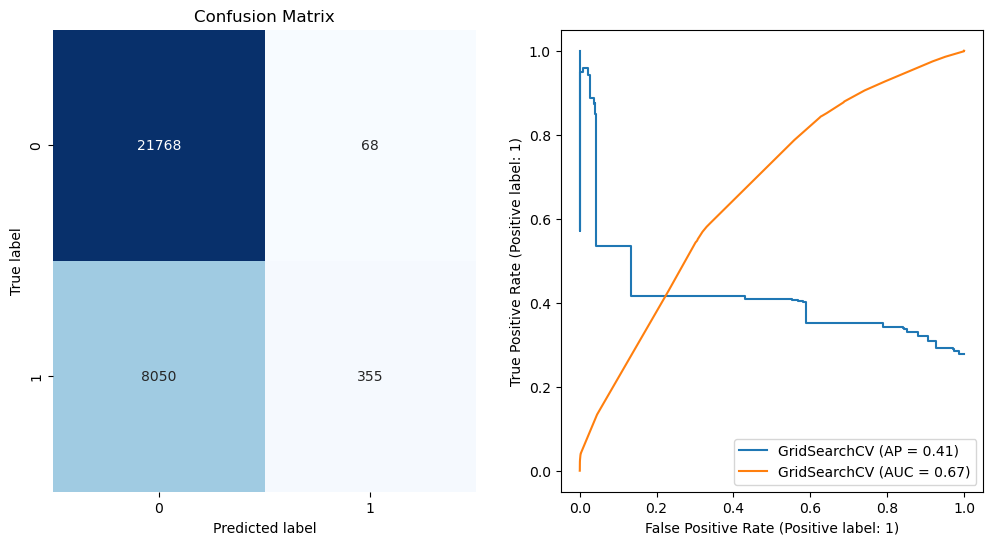

In [473]:
evaluate_classification_model(dt_grid_search , X_val, y_val)

In [314]:
feature_names = dt_grid_search.best_estimator_[:-1].get_feature_names_out()
importances = dt_grid_search.best_estimator_[-1].feature_importances_

feature_df = pd.DataFrame({
    'features': feature_names,
    'importances': importances
})

feature_df[feature_df.importances > 0.001].sort_values(by = 'importances', ascending = False)

,features,importances
23,cat_nominal__P1_MAR_STATUS_P,0.359280
4,num__cover_length,0.145006
1,num__RISK_RATED_AREA_C,0.142193
2,num__LAST_ANN_PREM_GROSS,0.140932
0,num__RISK_RATED_AREA_B,0.090879
22,cat_nominal__P1_MAR_STATUS_O,0.088879
49,cat_nominal__PROP_TYPE_2.0,0.026406
3,num__house_age,0.001400
79,cat_nominal__PROP_TYPE_47.0,0.001163
20,cat_nominal__P1_MAR_STATUS_M,0.001110


In [298]:

# Set up the parameter grid to search over for random forest
param_grid_rf = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [2, 3, 4, 5, 6],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Set up grid search for random forest
rf_grid_search = GridSearchCV(rforest_model, param_grid=param_grid_rf, cv=5)

# Fit the grid search to the data for random forest
rf_grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score for random forest
print("Best parameters for random forest: ", rf_grid_search.best_params_)
print("Best score for random forest: ", rf_grid_search.best_score_)




Best parameters for random forest:  {'classifier__max_depth': 6, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 100}
Best score for random forest:  0.7265114165008375


Accuracy: 0.726
Precision: 0.820
Recall: 0.019
F1 score: 0.037
AUC score: 0.676


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


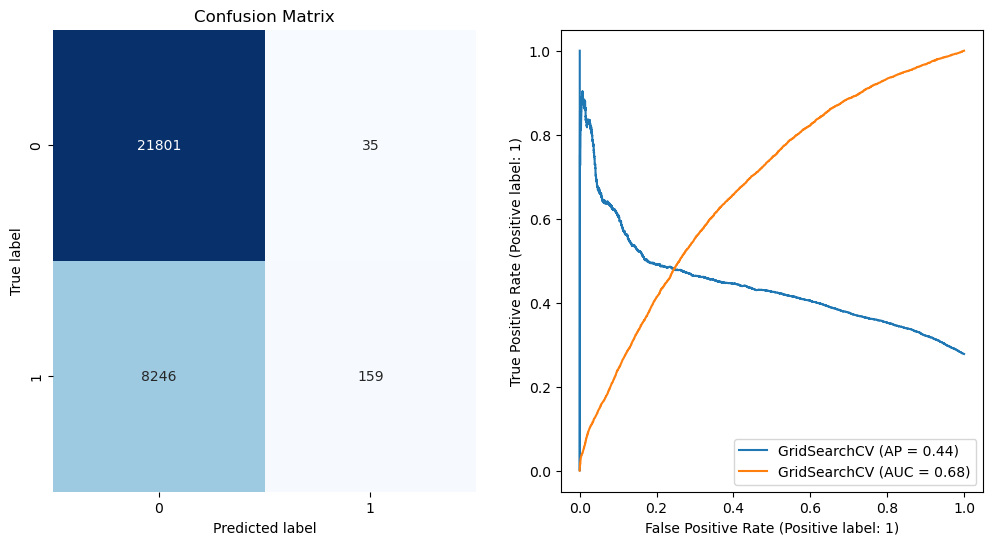

In [471]:
evaluate_classification_model(rf_grid_search, X_val, y_val)

In [315]:
feature_names = rf_grid_search.best_estimator_[:-1].get_feature_names_out()
importances = rf_grid_search.best_estimator_[-1].feature_importances_

feature_df = pd.DataFrame({
    'features': feature_names,
    'importances': importances
})

feature_df[feature_df.importances > 0.001].sort_values(by = 'importances', ascending = False)

,features,importances
23,cat_nominal__P1_MAR_STATUS_P,0.243452
4,num__cover_length,0.168515
1,num__RISK_RATED_AREA_C,0.137641
0,num__RISK_RATED_AREA_B,0.100210
2,num__LAST_ANN_PREM_GROSS,0.094232
20,cat_nominal__P1_MAR_STATUS_M,0.085938
49,cat_nominal__PROP_TYPE_2.0,0.037330
22,cat_nominal__P1_MAR_STATUS_O,0.036607
3,num__house_age,0.021688
65,cat_nominal__PROP_TYPE_25.0,0.013984


We can also try xgboost and the shapley package which calculates the marginal contribution of each feature to the model.

In [ ]:
import xgboost as xgb
import eli5
from eli5.sklearn import PermutationImportance

# define the pipeline with xgb
xgb_pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', xgb.XGBClassifier(objective='binary:logistic'))])

# create xgb model
xgb_pipe.fit(X_train, y_train)

Accuracy: 0.740
Precision: 0.624
Recall: 0.164
F1 score: 0.260
AUC score: 0.699


/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; Function `plot_precision_recall_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: PrecisionRecallDisplay.from_predictions or PrecisionRecallDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/chrismembrey/miniforge3/envs/chris_env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


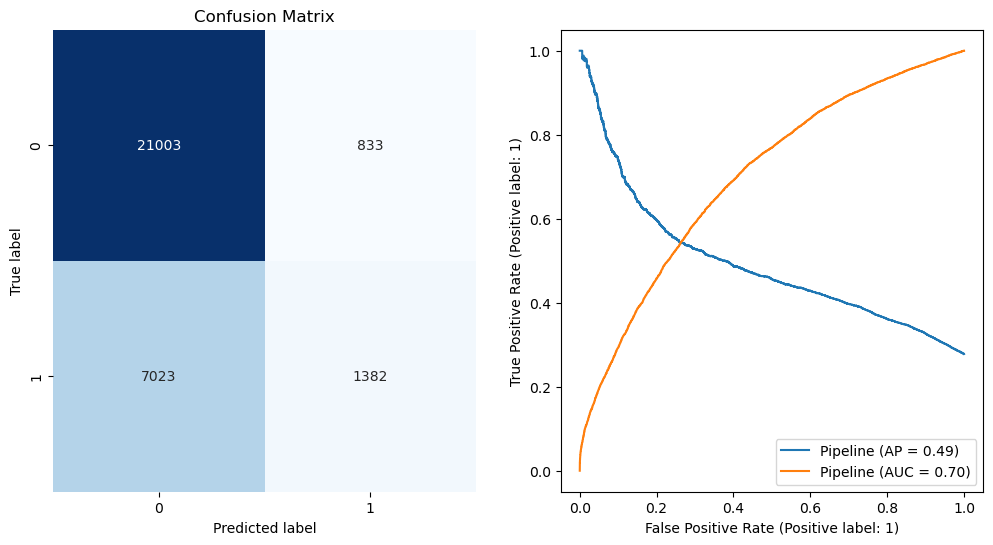

In [329]:
# evaluate
evaluate_classification_model(xgb_pipe, X_val, y_val)

In [325]:
# Use ELI5 to analyze feature importances
perm = PermutationImportance(xgb_pipe).fit(X_val, y_val)
eli5.show_weights(perm, feature_names = X_val.columns.tolist())

Weight,Feature
0.0285 ± 0.0022,RISK_RATED_AREA_C
0.0271 ± 0.0018,RISK_RATED_AREA_B
0.0242 ± 0.0025,cover_length
0.0123 ± 0.0031,LAST_ANN_PREM_GROSS
0.0065 ± 0.0014,PROP_TYPE
0.0065 ± 0.0023,P1_MAR_STATUS
0.0060 ± 0.0018,house_age
0.0009 ± 0.0007,max_contents_coverage
0.0007 ± 0.0009,OWNERSHIP_TYPE
0.0007 ± 0.0002,OCC_STATUS


# Conclusions

## From Modelling

### Marital Status

Married and 'Other' seem to have a very small on lapsing. Alternatively, the insurer could look to insure more marital status 'p' groups to ensure non-lapsing. 

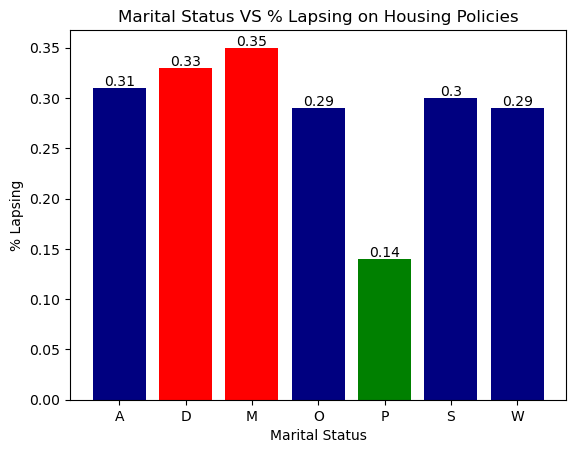

In [496]:
# get the mean lapse by marital status
data_mar = data_no_nulls[['P1_MAR_STATUS', 'has_lapsed']].groupby('P1_MAR_STATUS').mean().reset_index()

# taking these columns out of our analysis becuase they have such high variability in thier average value
data_mar = data_mar[data_mar['P1_MAR_STATUS'].isin(['N', 'B', 'C']) == False]
# create bar plot
fig, ax = plt.subplots()
ax.bar(data_mar['P1_MAR_STATUS'], round(data_mar['has_lapsed'],2) , 
      color = ['navy', 'r', 'r', 'navy', 'g', 'navy', 'navy'])

# add annotations to the bars
for i, value in enumerate(round(data_mar['has_lapsed'],2)):
    ax.text(i, value + 0.002, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Marital Status')
ax.set_ylabel('% Lapsing')
ax.set_title('Marital Status VS % Lapsing on Housing Policies')


# fig.text(-.25, -0.3,  '''According to the model, being Divorced/Married meant that the individual had a log odds increase. Here is the proportionality of those categories with Lapsing.  
# The biggest indicator of lapsing, however, is NOT being in a partnership. Potential reasons for this are:

# 1. Financial Stability: Partnerships may have more financial stability and resources than those who are single or divorced, and therefore may be less likely to experience financial difficulties or miss payments.

# 2. Risk Aversion: Partnerships may be more risk-averse and cautious than those who are single, which could lead to more responsible financial behavior.

# 3. Social Support: Marriage or partnership can provide social support and a safety net in times of financial difficulty, which may reduce the likelihood of policy lapses.''')

# show the plot
plt.show()

### Area Risk - Peronal Belongings

The risk rating C of an area also seems to be a consistent factor in all of the models presented.

If RISK_RATED_AREA_C is a strong indicator for lapsing on a housing policy, it may suggest that policyholders living in areas with higher levels of risk may be more likely to experience financial difficulties or other issues that could lead to missed payments or policy lapses. Alternatively, it is also possible that policyholders in areas with higher risk may be more likely to seek out insurance coverage and thus have a higher propensity for purchasing a home insurance policy in the first place, resulting in a higher number of lapses as well. Unfortunately, we dont have the income of the policy holders and so we cant gauge the effect this has on lapsing.

see below the visualisation for RISK_RATED_AREA_C and lapsing.

T-test statistic is 38.31, with p-value of 0.00


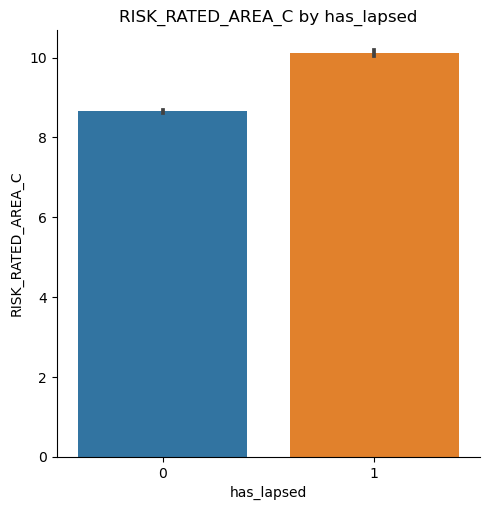

In [331]:
continuous_vs_categorical(data_no_nulls, 'RISK_RATED_AREA_C', 'has_lapsed')

The recommendation to the insurer would be to stear clear of high risk locations

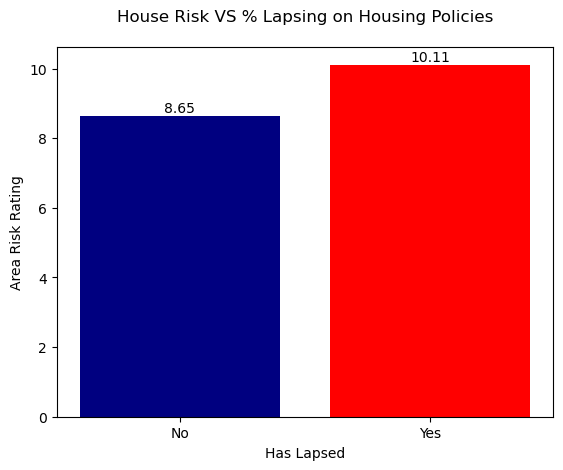

In [486]:
# get the mean lapse by marital status
status = data_no_nulls[['RISK_RATED_AREA_C', 'has_lapsed']].groupby('has_lapsed').mean().reset_index()

# create bar plot
fig, ax = plt.subplots()
ax.bar(status['has_lapsed'], round(status['RISK_RATED_AREA_C'],2) , 
      color = ['navy', 'r'])

# add annotations to the bars
for i, value in enumerate(round(status['RISK_RATED_AREA_C'],2)):
    ax.text(i, value + 0.1, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Has Lapsed')
ax.set_ylabel('Area Risk Rating')
ax.set_xticks([0,1])
ax.set_xticklabels(['No', 'Yes'])
ax.set_title('House Risk VS % Lapsing on Housing Policies\n')

# show the plot
plt.show()

### LAST_ANN_PREM_GROSS

Premiums on the policy seem to indicate lapsing. There are several reasons why this could be.

*Affordability*: Higher premium payments may strain a policyholder's finances, making it more difficult for them to make payments on time or at all.

*Risk*: Policyholders with higher premiums may be more likely to live in high-risk areas or have higher-valued properties, which could increase the likelihood of a claim being made and therefore the likelihood of lapsing.

*Coverage*: It's possible that policyholders with higher premiums are more likely to have more comprehensive coverage, which could lead to a higher likelihood of claims being made and therefore the likelihood of lapsing.

*Competition*: Higher premium policies may be more expensive relative to other policies on the market, leading to policyholders shopping around for cheaper alternatives and ultimately lapsing on their current policy.

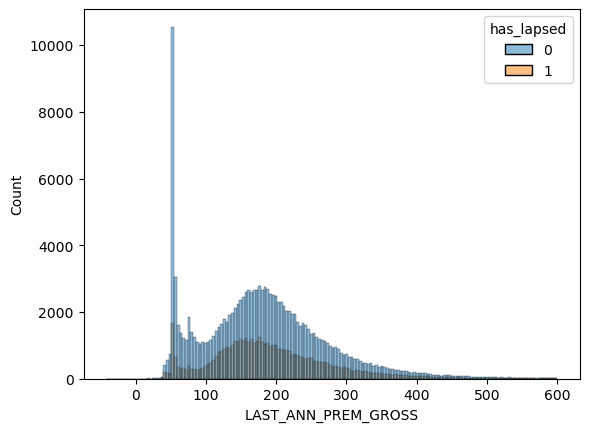

In [338]:
sns.histplot(data = data_no_nulls[
    (data_no_nulls['LAST_ANN_PREM_GROSS'] < 600) & (data_no_nulls['LAST_ANN_PREM_GROSS'] > -50) 
] , x='LAST_ANN_PREM_GROSS' , hue='has_lapsed');

T-test statistic is 27.29, with p-value of 0.00


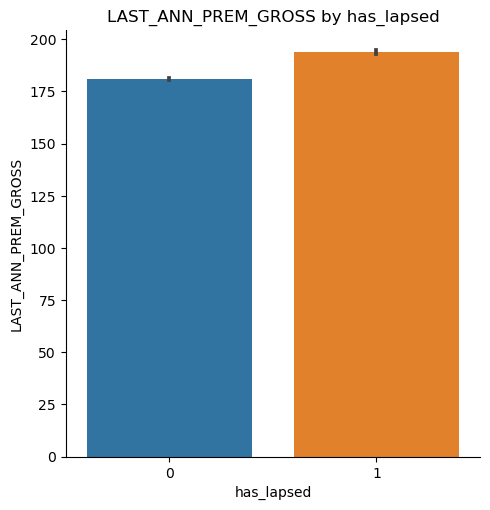

In [347]:
continuous_vs_categorical(data_no_nulls[(data_no_nulls['LAST_ANN_PREM_GROSS'] < 600) & (data_no_nulls['LAST_ANN_PREM_GROSS'] > -50)] , 'LAST_ANN_PREM_GROSS' , 'has_lapsed')

# below you can clearly see there is statistical significance in the difference between LAST ANN PREM and lapsing.

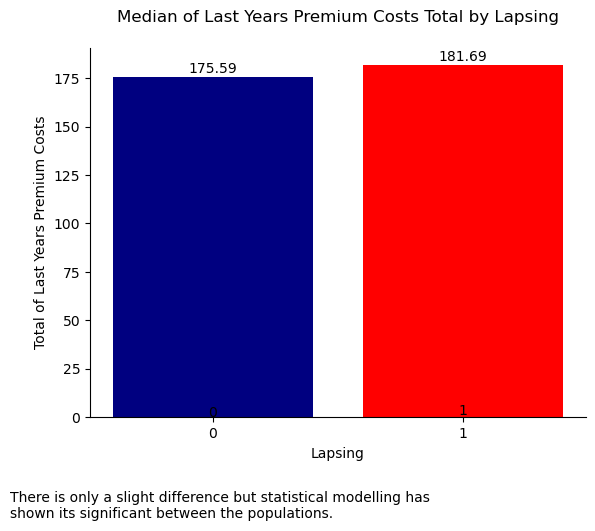

In [490]:
# get the mean lapse by marital status
status = data_no_nulls[['LAST_ANN_PREM_GROSS', 'has_lapsed']].groupby('has_lapsed').median().reset_index()

# create bar plot
fig, ax = plt.subplots()
ax.bar(round(status['has_lapsed'],2) , status['LAST_ANN_PREM_GROSS'],
      color = ['navy', 'r'])

# add annotations to the bars
for i, value in enumerate(round(status['has_lapsed'],2)):
    ax.text(i, value + 0.002, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Lapsing')
ax.set_ylabel('Total of Last Years Premium Costs')
ax.set_title('Median of Last Years Premium Costs Total by Lapsing\n')
ax.set_xticks([0,1], labels = None)

# add annotations to the bars
for i, value in enumerate(round(status['LAST_ANN_PREM_GROSS'],2)):
    ax.text(i, value + 2, str(value), ha='center', fontsize=10)
    
    
# Remove the top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# leave note
fig.text(0, -0.1,         
         
'''There is only a slight difference but statistical modelling has 
shown its significant between the populations.'''
        )

# show the plot
plt.show()

In [495]:
print("Relative increase for lapsers: ", ((181.69-175.59)/175.59) * 100)

Relative increase for lapsers:  3.474001936328945


## From EDA

While the models were poor, the EDA stage still gave a small insight as to what categories give rise to higher lapsing.

### Employment Status

The income the individual has would be a great indicator of risk to the insurer, this is not provided in the dataset. the next field for income indication is the employment status. 

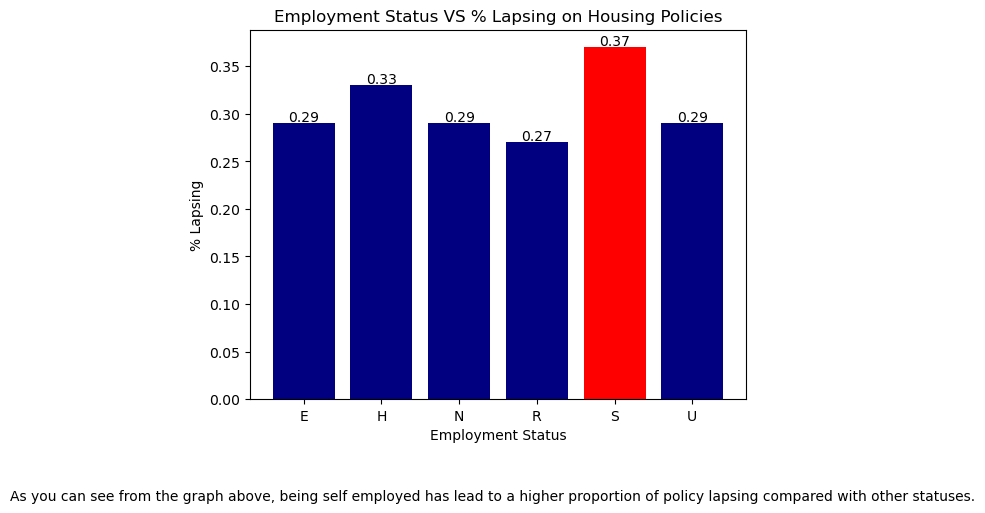

In [458]:
# get the mean lapse by marital status
status = data_no_nulls[['P1_EMP_STATUS', 'has_lapsed']].groupby('P1_EMP_STATUS').mean().reset_index()

# taking these columns out of our analysis becuase they have such high variability in thier average value
status = status[status['P1_EMP_STATUS'].isin(['A', 'F', 'I', 'V', 'C']) == False]
# create bar plot
fig, ax = plt.subplots()
ax.bar(status['P1_EMP_STATUS'], round(status['has_lapsed'],2) , 
      color = ['navy', 'navy', 'navy', 'navy', 'r', 'navy'])

# add annotations to the bars
for i, value in enumerate(round(status['has_lapsed'],2)):
    ax.text(i, value + 0.002, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Employment Status')
ax.set_ylabel('% Lapsing')
ax.set_title('Employment Status VS % Lapsing on Housing Policies')
fig.text(-0.25, -0.1,         
         
'''As you can see from the graph above, being self employed has lead to a higher proportion of policy lapsing compared with other statuses.'''
        )

# show the plot
plt.show()

Self-employment can be associated with a variable and often **unpredictable income stream**. This may lead to difficulties in meeting financial obligations, including insurance premium payments. Self-employed individuals may also have irregular working hours, which could lead to difficulties in keeping track of payments and deadlines. Additionally, they may not have access to the same benefits and support systems as those who are employed by a company, which could make it more difficult to stay on top of insurance payments.

This ties nicely to another observation during EDA...

### Business Use Buildings

Chi-squared test statistic: 149.84
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.03


<Figure size 2000x2000 with 0 Axes>

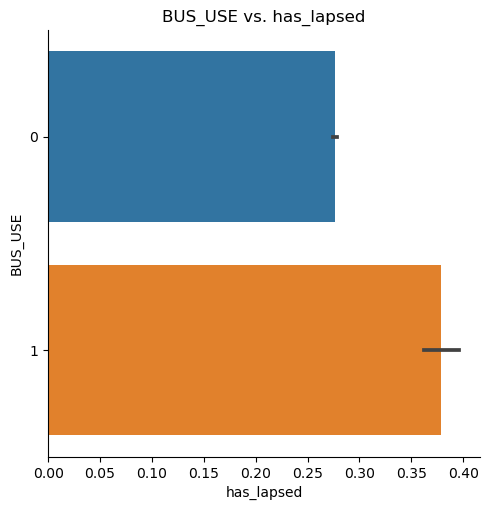

In [365]:
discrete_comparison(data_no_nulls, 'BUS_USE', 'has_lapsed', plot_type = 'bar')

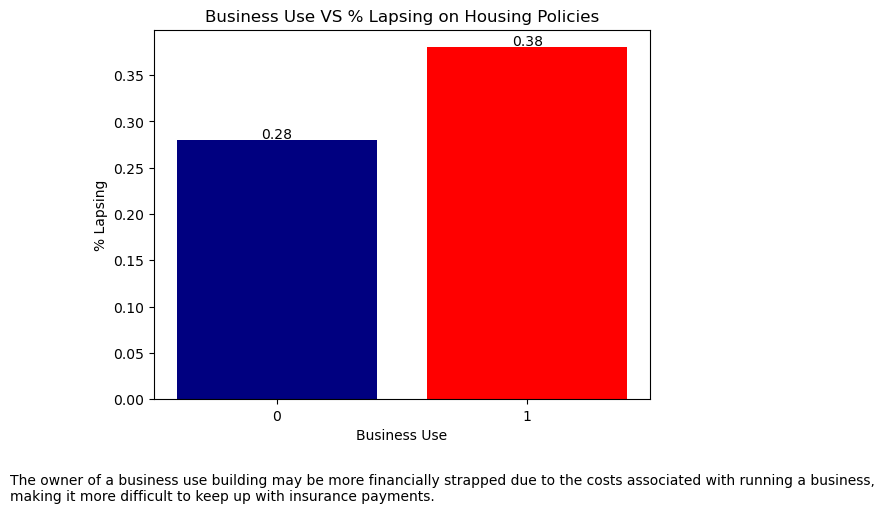

In [462]:
# get the mean lapse by marital status
status = data_no_nulls[['BUS_USE', 'has_lapsed']].groupby('BUS_USE').mean().reset_index()

# create bar plot
fig, ax = plt.subplots()
ax.bar(status['BUS_USE'], round(status['has_lapsed'],2) , 
      color = ['navy', 'r'])

# add annotations to the bars
for i, value in enumerate(round(status['has_lapsed'],2)):
    ax.text(i, value + 0.002, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Business Use')
ax.set_ylabel('% Lapsing')
ax.set_xticks([0,1])
ax.set_title('Business Use VS % Lapsing on Housing Policies')
fig.text(-0.1, -0.1,         
         
'''The owner of a business use building may be more financially strapped due to the costs associated with running a business, 
making it more difficult to keep up with insurance payments.'''
        )

# show the plot
plt.show()

The owner of a business use building may be **more financially strapped** due to the costs associated with running a business, making it more difficult to keep up with insurance payments.

### Policy Refusal

Chi-squared test statistic: 38.25
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.01


<Figure size 2000x2000 with 0 Axes>

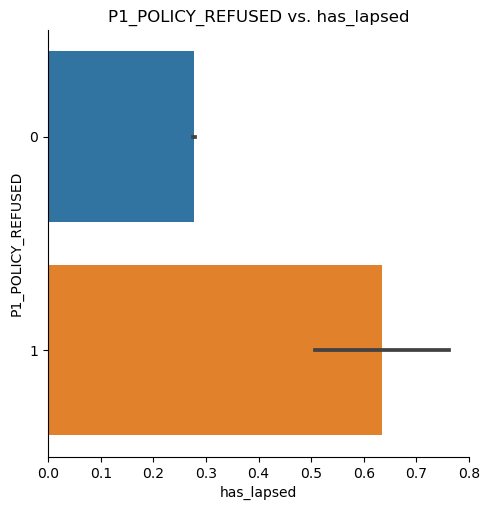

In [390]:
discrete_comparison(data_no_nulls , 'P1_POLICY_REFUSED', 'has_lapsed', plot_type = 'bar')

In [396]:
# extremely high 95% confidence interval is due to low sample size, as seen below
pd.crosstab(data_no_nulls['P1_POLICY_REFUSED'], data_no_nulls['has_lapsed'])

has_lapsed,0,1
P1_POLICY_REFUSED,,
0,136448,52494
1,23,40


"P1_POLICY_REFUSED" indicates whether the policy was refused in the past or not. If a policy was refused in the past, it may indicate that the individual has a **higher risk profile** or has a **history of non-compliance** with insurance policies. As a result, they may be more likely to lapse on a home insurance policy in the future. Additionally, if an individual has been refused coverage in the past, they may have a harder time finding affordable coverage, which could lead to lapses in coverage due to financial difficulties.

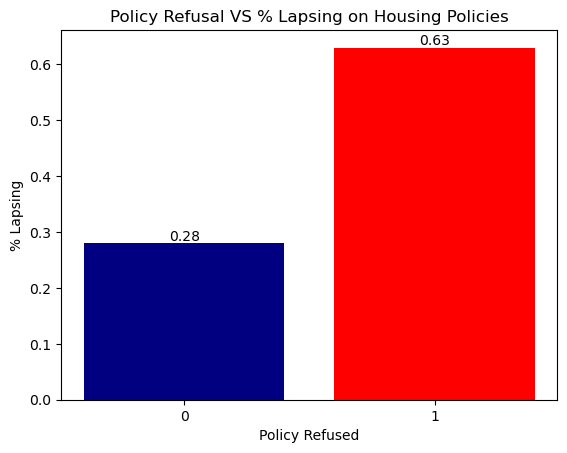

In [464]:
# get the mean lapse by marital status
status = data_no_nulls[['P1_POLICY_REFUSED', 'has_lapsed']].groupby('P1_POLICY_REFUSED').mean().reset_index()

# create bar plot
fig, ax = plt.subplots()
ax.bar(status['P1_POLICY_REFUSED'], round(status['has_lapsed'],2) , 
      color = ['navy', 'r'])

# add annotations to the bars
for i, value in enumerate(round(status['has_lapsed'],2)):
    ax.text(i, value + 0.005, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Policy Refused')
ax.set_ylabel('% Lapsing')
ax.set_xticks([0,1])
ax.set_title('Policy Refusal VS % Lapsing on Housing Policies')
# fig.text(-0.1, -0.1,         
         
# '''The owner of a business use building may be more financially strapped due to the costs associated with running a business, 
# making it more difficult to keep up with insurance payments.'''
#         )

# show the plot
plt.show()

### Payment Frequency

Chi-squared test statistic: 3243.70
P-value: 0.00
Degrees of freedom: 1
Cramer's V statistic: 0.13


<Figure size 2000x2000 with 0 Axes>

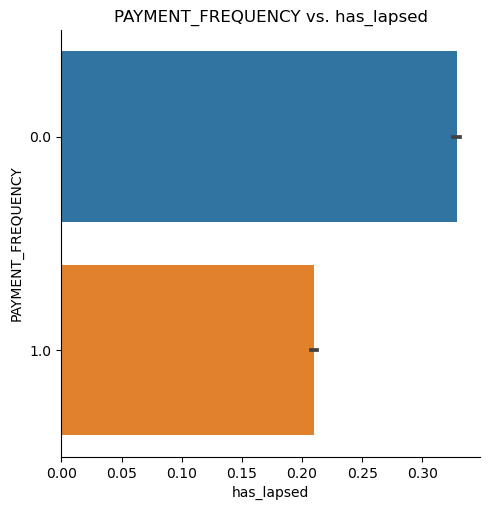

In [397]:
discrete_comparison(data_no_nulls , 'PAYMENT_FREQUENCY', 'has_lapsed', plot_type = 'bar')

PAYMENT_FREQUENCY could have an effect on lapsing for the following reasons:

1. **Cash flow management**: If the policy holder is paying on a less frequent basis, such as annually or biannually, they may need to manage their cash flow more carefully. If an unexpected expense arises, they may prioritize paying for that expense over their insurance premium.

2. **Budgeting**: Policy holders who pay less frequently may not have the same level of budgeting and financial planning skills as those who pay more frequently. They may not have as clear of a picture of their income and expenses, which could make it easier to miss a premium payment.

3. **Lack of reminders**: Policy holders who pay less frequently may not receive as many reminders about their premium payments. If they forget when their payment is due, they may miss the deadline and risk their policy lapsing.

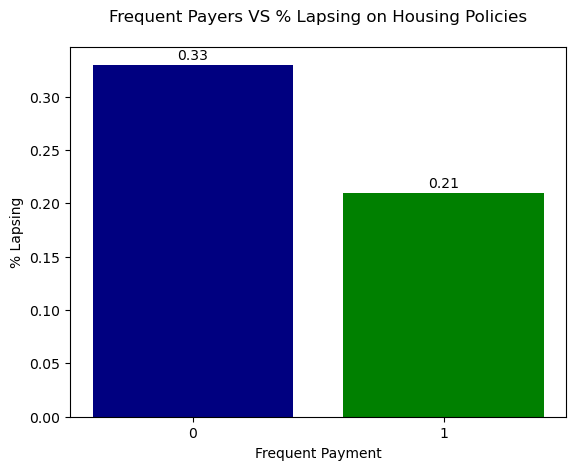

In [469]:
# get the mean lapse by marital status
status = data_no_nulls[['PAYMENT_FREQUENCY', 'has_lapsed']].groupby('PAYMENT_FREQUENCY').mean().reset_index()

# create bar plot
fig, ax = plt.subplots()
ax.bar(status['PAYMENT_FREQUENCY'], round(status['has_lapsed'],2) , 
      color = ['navy', 'g'])

# add annotations to the bars
for i, value in enumerate(round(status['has_lapsed'],2)):
    ax.text(i, value + 0.005, str(value), ha='center', fontsize=10)

# set axis labels and title
ax.set_xlabel('Frequent Payment')
ax.set_ylabel('% Lapsing')
ax.set_xticks([0,1])
ax.set_title('Frequent Payers VS % Lapsing on Housing Policies\n')
# fig.text(-0.1, -0.1,         
         
# '''The owner of a business use building may be more financially strapped due to the costs associated with running a business, 
# making it more difficult to keep up with insurance payments.'''
#         )

# show the plot
plt.show()

## Final Thought

All in all, I would suggest the insurance company look to insure non-business owners, who have a partner and live in low-risk areas. Furthermore, if these individuals do not have a history of lapsing and are able to frequently pay thier policy quotes they are of lower risk for future lapses. 

The dataset has a poor data dictionary and all of the categories have been assumed. Futhermore, additional information such as incomes streams of the policy holder would be useful to know as it gives an idea of the financial stability. This feature partnered with performance of financial markets may be used to measure the overall lapse-risk of the individual. The value of the quote would also be insightful as you can compare this value with the individuals salary. 

Another interesting aspect is the overall increase in proportion of lapsing between 2007 - 2012. In a future analysis I would look to isolate the last years lapsing which was at a proportion of ~40%.